# Data Analysis

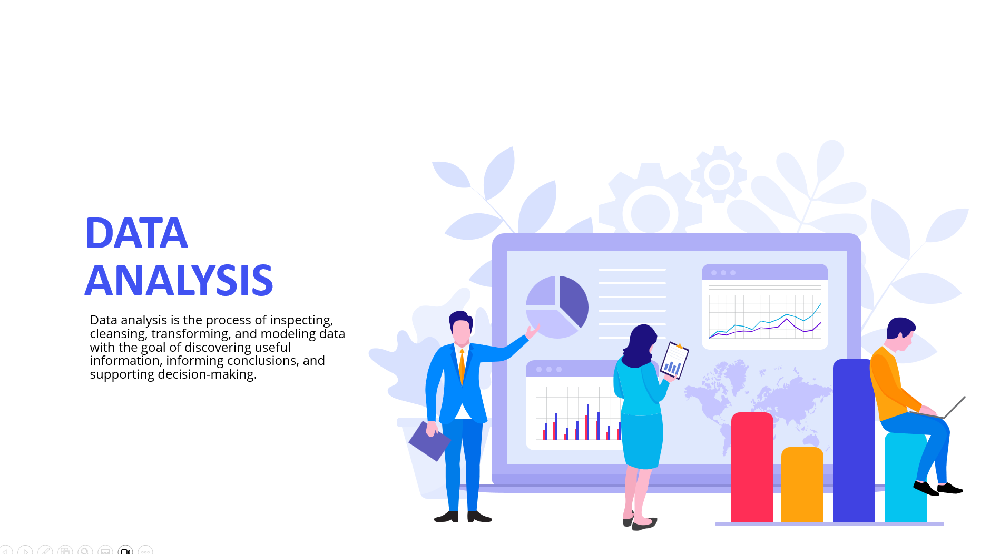

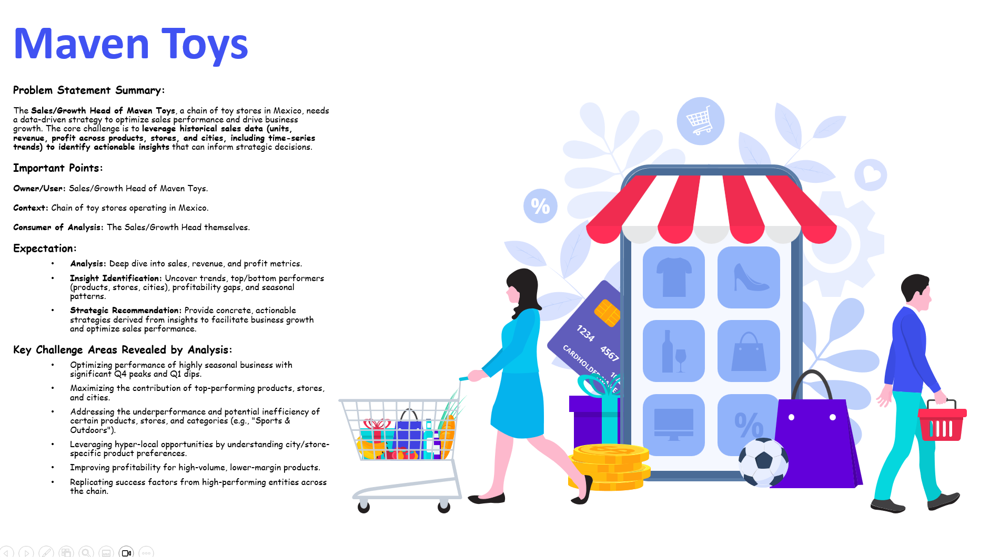

# Notebook Structure

1. Import necessary libraries
2. Import all the necessary datasets
3. Visualizing the dataset
4. Merging the dataset
5. Dataset summarization
6. Important Pre-computation/Cleaning
7. Exploratory Data Analysis - Univariate Analysis of Numerical Variables
8. Exploratory Data Analysis - Univariate Analysis of Categorical Variables
9. Exploratory Data Analysis - Timeseries Analysis - Absolute Values of the KPI's
10. Exploratory Data Analysis - Timeseries Analysis - Growth of the KPI's
11. Bivariate analysis - Numerical Vs Categorical variable
12. Multivariate analysis

# 1. Import necessary libraries

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# 2. Import all the necessary datasets

In [3]:
calendar = pd.read_csv('calendar.csv')
dictionary = pd.read_csv('data_dictionary.csv')
inventory = pd.read_csv('inventory.csv')
products = pd.read_csv('products.csv')
sales = pd.read_csv('sales.csv')
stores = pd.read_csv('stores.csv')

# 3. Visualizing the dataset

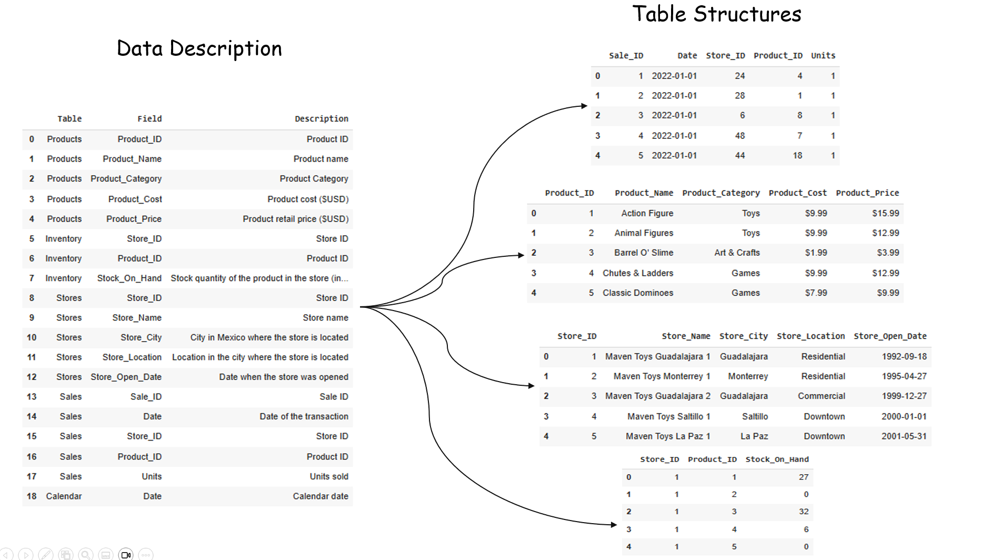

In [4]:
dictionary

,Table,Field,Description
0,Products,Product_ID,Product ID
1,Products,Product_Name,Product name
2,Products,Product_Category,Product Category
3,Products,Product_Cost,Product cost ($USD)
4,Products,Product_Price,Product retail price ($USD)
5,Inventory,Store_ID,Store ID
6,Inventory,Product_ID,Product ID
7,Inventory,Stock_On_Hand,Stock quantity of the product in the store (in...
8,Stores,Store_ID,Store ID
9,Stores,Store_Name,Store name


In [5]:
sales.head()

,Sale_ID,Date,Store_ID,Product_ID,Units
0,1,2022-01-01,24,4,1
1,2,2022-01-01,28,1,1
2,3,2022-01-01,6,8,1
3,4,2022-01-01,48,7,1
4,5,2022-01-01,44,18,1


In [6]:
products.head()

,Product_ID,Product_Name,Product_Category,Product_Cost,Product_Price
0,1,Action Figure,Toys,$9.99,$15.99
1,2,Animal Figures,Toys,$9.99,$12.99
2,3,Barrel O' Slime,Art & Crafts,$1.99,$3.99
3,4,Chutes & Ladders,Games,$9.99,$12.99
4,5,Classic Dominoes,Games,$7.99,$9.99


In [7]:
stores.head()

,Store_ID,Store_Name,Store_City,Store_Location,Store_Open_Date
0,1,Maven Toys Guadalajara 1,Guadalajara,Residential,1992-09-18
1,2,Maven Toys Monterrey 1,Monterrey,Residential,1995-04-27
2,3,Maven Toys Guadalajara 2,Guadalajara,Commercial,1999-12-27
3,4,Maven Toys Saltillo 1,Saltillo,Downtown,2000-01-01
4,5,Maven Toys La Paz 1,La Paz,Downtown,2001-05-31


In [8]:
inventory.head()

,Store_ID,Product_ID,Stock_On_Hand
0,1,1,27
1,1,2,0
2,1,3,32
3,1,4,6
4,1,5,0


In [9]:
calendar

,Date
0,1/1/2022
1,1/2/2022
2,1/3/2022
3,1/4/2022
4,1/5/2022
...,...
633,9/26/2023
634,9/27/2023
635,9/28/2023
636,9/29/2023


# 4. Merging the dataset

* Merging sales and products on 'Product_ID'
* Merging sales_products with stores on 'store_ID'
* Merging sales_products_stores with inventory on the composite key ['Product_ID' , 'Store_ID']
* Storing it in a new dataframe




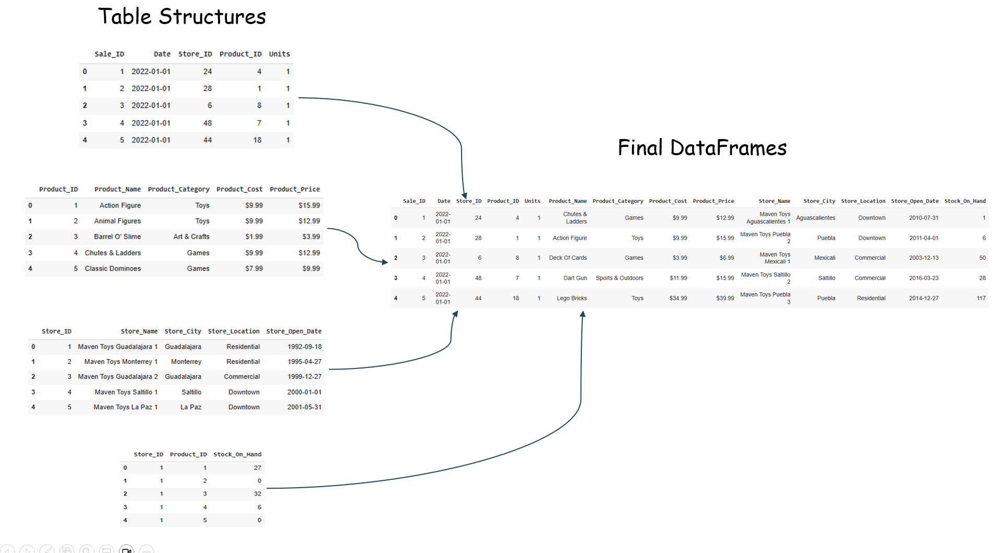

### A. Merging sales and products on 'Product_ID'

In [10]:
sales_products = pd.merge(sales , products , how = 'inner' , on = 'Product_ID')

In [11]:
sales_products.head()

,Sale_ID,Date,Store_ID,Product_ID,Units,Product_Name,Product_Category,Product_Cost,Product_Price
0,1,2022-01-01,24,4,1,Chutes & Ladders,Games,$9.99,$12.99
1,2,2022-01-01,28,1,1,Action Figure,Toys,$9.99,$15.99
2,3,2022-01-01,6,8,1,Deck Of Cards,Games,$3.99,$6.99
3,4,2022-01-01,48,7,1,Dart Gun,Sports & Outdoors,$11.99,$15.99
4,5,2022-01-01,44,18,1,Lego Bricks,Toys,$34.99,$39.99


### B. Merging sales_products with stores on 'store_ID'

In [12]:
sales_products_stores = pd.merge(sales_products , stores , how = 'inner' , on = 'Store_ID')

In [13]:
sales_products_stores.head()

,Sale_ID,Date,Store_ID,Product_ID,Units,Product_Name,Product_Category,Product_Cost,Product_Price,Store_Name,Store_City,Store_Location,Store_Open_Date
0,1,2022-01-01,24,4,1,Chutes & Ladders,Games,$9.99,$12.99,Maven Toys Aguascalientes 1,Aguascalientes,Downtown,2010-07-31
1,2,2022-01-01,28,1,1,Action Figure,Toys,$9.99,$15.99,Maven Toys Puebla 2,Puebla,Downtown,2011-04-01
2,3,2022-01-01,6,8,1,Deck Of Cards,Games,$3.99,$6.99,Maven Toys Mexicali 1,Mexicali,Commercial,2003-12-13
3,4,2022-01-01,48,7,1,Dart Gun,Sports & Outdoors,$11.99,$15.99,Maven Toys Saltillo 2,Saltillo,Commercial,2016-03-23
4,5,2022-01-01,44,18,1,Lego Bricks,Toys,$34.99,$39.99,Maven Toys Puebla 3,Puebla,Residential,2014-12-27


### C. Merging sales_products_stores with inventory on the composite key ['Product_ID' , 'Store_ID']

In [14]:
sales_products_stores_inventory = pd.merge(sales_products_stores , inventory , how = 'inner' , on = ['Product_ID' , 'Store_ID'])

In [15]:
sales_products_stores_inventory.head()

,Sale_ID,Date,Store_ID,Product_ID,Units,Product_Name,Product_Category,Product_Cost,Product_Price,Store_Name,Store_City,Store_Location,Store_Open_Date,Stock_On_Hand
0,1,2022-01-01,24,4,1,Chutes & Ladders,Games,$9.99,$12.99,Maven Toys Aguascalientes 1,Aguascalientes,Downtown,2010-07-31,1
1,2,2022-01-01,28,1,1,Action Figure,Toys,$9.99,$15.99,Maven Toys Puebla 2,Puebla,Downtown,2011-04-01,6
2,3,2022-01-01,6,8,1,Deck Of Cards,Games,$3.99,$6.99,Maven Toys Mexicali 1,Mexicali,Commercial,2003-12-13,50
3,4,2022-01-01,48,7,1,Dart Gun,Sports & Outdoors,$11.99,$15.99,Maven Toys Saltillo 2,Saltillo,Commercial,2016-03-23,28
4,5,2022-01-01,44,18,1,Lego Bricks,Toys,$34.99,$39.99,Maven Toys Puebla 3,Puebla,Residential,2014-12-27,117


### D. Storing it in a new dataframe

In [16]:
df = sales_products_stores_inventory

In [17]:
df.head()

,Sale_ID,Date,Store_ID,Product_ID,Units,Product_Name,Product_Category,Product_Cost,Product_Price,Store_Name,Store_City,Store_Location,Store_Open_Date,Stock_On_Hand
0,1,2022-01-01,24,4,1,Chutes & Ladders,Games,$9.99,$12.99,Maven Toys Aguascalientes 1,Aguascalientes,Downtown,2010-07-31,1
1,2,2022-01-01,28,1,1,Action Figure,Toys,$9.99,$15.99,Maven Toys Puebla 2,Puebla,Downtown,2011-04-01,6
2,3,2022-01-01,6,8,1,Deck Of Cards,Games,$3.99,$6.99,Maven Toys Mexicali 1,Mexicali,Commercial,2003-12-13,50
3,4,2022-01-01,48,7,1,Dart Gun,Sports & Outdoors,$11.99,$15.99,Maven Toys Saltillo 2,Saltillo,Commercial,2016-03-23,28
4,5,2022-01-01,44,18,1,Lego Bricks,Toys,$34.99,$39.99,Maven Toys Puebla 3,Puebla,Residential,2014-12-27,117


In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 823030 entries, 0 to 823029
Data columns (total 14 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   Sale_ID           823030 non-null  int64 
 1   Date              823030 non-null  object
 2   Store_ID          823030 non-null  int64 
 3   Product_ID        823030 non-null  int64 
 4   Units             823030 non-null  int64 
 5   Product_Name      823030 non-null  object
 6   Product_Category  823030 non-null  object
 7   Product_Cost      823030 non-null  object
 8   Product_Price     823030 non-null  object
 9   Store_Name        823030 non-null  object
 10  Store_City        823030 non-null  object
 11  Store_Location    823030 non-null  object
 12  Store_Open_Date   823030 non-null  object
 13  Stock_On_Hand     823030 non-null  int64 
dtypes: int64(5), object(9)
memory usage: 87.9+ MB


# 5. Dataset summarization

In [19]:
# Numerical (int64,float64): Sale_ID, Store_ID, Product_ID, Units, Stock_On_Hand
# Categorical/Object : Date, Product_Name, Product_Category, Product_Cost, Product_Price, Store_Name, Store_City, Store_Location, Store_Open_Date

# 6. Important Pre-computation/Cleaning

* conversion of Date and Store_Open_Date to datetime
* Product_Cost and Product_Price must be converted to numerical (float/int) after handling any non-numeric characters.
* Derive new metrics

### A. conversion of Date and Store_Open_Date to datetime

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 823030 entries, 0 to 823029
Data columns (total 14 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   Sale_ID           823030 non-null  int64 
 1   Date              823030 non-null  object
 2   Store_ID          823030 non-null  int64 
 3   Product_ID        823030 non-null  int64 
 4   Units             823030 non-null  int64 
 5   Product_Name      823030 non-null  object
 6   Product_Category  823030 non-null  object
 7   Product_Cost      823030 non-null  object
 8   Product_Price     823030 non-null  object
 9   Store_Name        823030 non-null  object
 10  Store_City        823030 non-null  object
 11  Store_Location    823030 non-null  object
 12  Store_Open_Date   823030 non-null  object
 13  Stock_On_Hand     823030 non-null  int64 
dtypes: int64(5), object(9)
memory usage: 87.9+ MB


In [21]:
df['Date'] = pd.to_datetime(df['Date'])
df['Store_Open_Date'] = pd.to_datetime(df['Store_Open_Date'])

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 823030 entries, 0 to 823029
Data columns (total 14 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   Sale_ID           823030 non-null  int64         
 1   Date              823030 non-null  datetime64[ns]
 2   Store_ID          823030 non-null  int64         
 3   Product_ID        823030 non-null  int64         
 4   Units             823030 non-null  int64         
 5   Product_Name      823030 non-null  object        
 6   Product_Category  823030 non-null  object        
 7   Product_Cost      823030 non-null  object        
 8   Product_Price     823030 non-null  object        
 9   Store_Name        823030 non-null  object        
 10  Store_City        823030 non-null  object        
 11  Store_Location    823030 non-null  object        
 12  Store_Open_Date   823030 non-null  datetime64[ns]
 13  Stock_On_Hand     823030 non-null  int64         
dtypes: d

### B. Product_Cost and Product_Price must be converted to numerical (float/int) after handling any non-numeric characters

In [23]:
df['Product_Cost'] = df['Product_Cost'].str.replace('$' , '')
df['Product_Price'] = df['Product_Price'].str.replace('$' , '')

In [24]:
print(df['Product_Cost'].head())
print(df['Product_Price'].head())

0     9.99 
1     9.99 
2     3.99 
3    11.99 
4    34.99 
Name: Product_Cost, dtype: object
0    12.99 
1    15.99 
2     6.99 
3    15.99 
4    39.99 
Name: Product_Price, dtype: object


In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 823030 entries, 0 to 823029
Data columns (total 14 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   Sale_ID           823030 non-null  int64         
 1   Date              823030 non-null  datetime64[ns]
 2   Store_ID          823030 non-null  int64         
 3   Product_ID        823030 non-null  int64         
 4   Units             823030 non-null  int64         
 5   Product_Name      823030 non-null  object        
 6   Product_Category  823030 non-null  object        
 7   Product_Cost      823030 non-null  object        
 8   Product_Price     823030 non-null  object        
 9   Store_Name        823030 non-null  object        
 10  Store_City        823030 non-null  object        
 11  Store_Location    823030 non-null  object        
 12  Store_Open_Date   823030 non-null  datetime64[ns]
 13  Stock_On_Hand     823030 non-null  int64         
dtypes: d

In [26]:
df['Product_Cost'] = df['Product_Cost'].astype('float64')
df['Product_Price'] = df['Product_Price'].astype('float64')

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 823030 entries, 0 to 823029
Data columns (total 14 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   Sale_ID           823030 non-null  int64         
 1   Date              823030 non-null  datetime64[ns]
 2   Store_ID          823030 non-null  int64         
 3   Product_ID        823030 non-null  int64         
 4   Units             823030 non-null  int64         
 5   Product_Name      823030 non-null  object        
 6   Product_Category  823030 non-null  object        
 7   Product_Cost      823030 non-null  float64       
 8   Product_Price     823030 non-null  float64       
 9   Store_Name        823030 non-null  object        
 10  Store_City        823030 non-null  object        
 11  Store_Location    823030 non-null  object        
 12  Store_Open_Date   823030 non-null  datetime64[ns]
 13  Stock_On_Hand     823030 non-null  int64         
dtypes: d

### C. Derive new metrics

* Revenue (Units * Product_Price)
* Profit (Units * (Product_Price - Product_Cost))

In [28]:
df['Revenue'] = df['Units'] * df['Product_Price']
df['Profit'] = df['Units'] * (df['Product_Price'] - df['Product_Cost'])

In [29]:
df.head()

,Sale_ID,Date,Store_ID,Product_ID,Units,Product_Name,Product_Category,Product_Cost,Product_Price,Store_Name,Store_City,Store_Location,Store_Open_Date,Stock_On_Hand,Revenue,Profit
0,1,2022-01-01,24,4,1,Chutes & Ladders,Games,9.99,12.99,Maven Toys Aguascalientes 1,Aguascalientes,Downtown,2010-07-31,1,12.99,3.0
1,2,2022-01-01,28,1,1,Action Figure,Toys,9.99,15.99,Maven Toys Puebla 2,Puebla,Downtown,2011-04-01,6,15.99,6.0
2,3,2022-01-01,6,8,1,Deck Of Cards,Games,3.99,6.99,Maven Toys Mexicali 1,Mexicali,Commercial,2003-12-13,50,6.99,3.0
3,4,2022-01-01,48,7,1,Dart Gun,Sports & Outdoors,11.99,15.99,Maven Toys Saltillo 2,Saltillo,Commercial,2016-03-23,28,15.99,4.0
4,5,2022-01-01,44,18,1,Lego Bricks,Toys,34.99,39.99,Maven Toys Puebla 3,Puebla,Residential,2014-12-27,117,39.99,5.0


# 7. Exploratory Data Analysis - Univariate Analysis of Numerical Variables

In [30]:
# Numerical Variables to be analyzed : Units, Stock_On_Hand, Product_Cost, Product_Price, derived Revenue, Profit

### A. Quantitative Analysis

* What is the central tendency (mean, median, mode) of Units sold per transaction?
* What is the typical Stock_On_Hand? What are the minimum and maximum stock levels?
* What is the distribution of Product_Cost and Product_Price? Are there significant outliers?
* What are the total and average Revenue and Profit per transaction?
* What is the skewness and kurtosis of Units, Revenue, and Profit?

In [31]:

# 1. Central tendency (mean, median, mode) of Units sold per transaction
print("\n1. Central Tendency of 'Units' sold per transaction:")
print(f"   Mean Units: {df['Units'].mean():.2f}")
print(f"   Median Units: {df['Units'].median():.2f}")
print(f"   Mode Units: {df['Units'].mode().tolist()}") # .mode() can return multiple if equally frequent

print('='*100)

# 2. Typical Stock_On_Hand, Minimum and Maximum Stock Levels
print("\n2. Statistics for 'Stock_On_Hand':")
print(f"   Mean Stock On Hand: {df['Stock_On_Hand'].mean():.2f}")
print(f"   Median Stock On Hand: {df['Stock_On_Hand'].median():.2f}")
print(f"   Minimum Stock On Hand: {df['Stock_On_Hand'].min():.2f}")
print(f"   Maximum Stock On Hand: {df['Stock_On_Hand'].max():.2f}")

print('='*100)

# 3. Distribution of Product_Cost and Product_Price (and hints for outliers)
print("\n3. Distribution of 'Product_Cost' and 'Product_Price':")
# .describe() provides count, mean, std, min, 25%, 50%, 75%, max
# Outliers can be inferred by comparing min/max to the quartiles (25%, 75%)
# or by observing a large standard deviation relative to the mean.
print("\n   Product_Cost Description:")
print(df['Product_Cost'].describe())
print("\n   Product_Price Description:")
print(df['Product_Price'].describe())

print('='*100)

# 4. Total and average Revenue and Profit per transaction
print("\n4. Total and Average 'Revenue' and 'Profit' per transaction:")
print(f"   Total Revenue: {df['Revenue'].sum():,.2f}")
print(f"   Average Revenue per Transaction: {df['Revenue'].mean():,.2f}")
print(f"   Total Profit: {df['Profit'].sum():,.2f}")
print(f"   Average Profit per Transaction: {df['Profit'].mean():,.2f}")

print('='*100)

# 5. Skewness and kurtosis of Units, Revenue, and Profit
print("\n5. Skewness and Kurtosis of 'Units', 'Revenue', and 'Profit':")
print(f"   Skewness of Units: {df['Units'].skew():.4f}")
print(f"   Kurtosis of Units: {df['Units'].kurtosis():.4f}")
print(f"   Skewness of Revenue: {df['Revenue'].skew():.4f}")
print(f"   Kurtosis of Revenue: {df['Revenue'].kurtosis():.4f}")
print(f"   Skewness of Profit: {df['Profit'].skew():.4f}")
print(f"   Kurtosis of Profit: {df['Profit'].kurtosis():.4f}")


1. Central Tendency of 'Units' sold per transaction:
   Mean Units: 1.32
   Median Units: 1.00
   Mode Units: [1]

2. Statistics for 'Stock_On_Hand':
   Mean Stock On Hand: 25.32
   Median Stock On Hand: 18.00
   Minimum Stock On Hand: 0.00
   Maximum Stock On Hand: 139.00

3. Distribution of 'Product_Cost' and 'Product_Price':

   Product_Cost Description:
count    823030.000000
mean         10.026130
std           7.824972
min           1.990000
25%           3.990000
50%           7.990000
75%          13.990000
max          34.990000
Name: Product_Cost, dtype: float64

   Product_Price Description:
count    823030.000000
mean         13.797757
std           8.690296
min           2.990000
25%           6.990000
50%          12.990000
75%          15.990000
max          39.990000
Name: Product_Price, dtype: float64

4. Total and Average 'Revenue' and 'Profit' per transaction:
   Total Revenue: 14,375,257.09
   Average Revenue per Transaction: 17.47
   Total Profit: 3,967,329.00
   

In [32]:
df['Product_Price'].value_counts()

,count
Product_Price,
15.99,113993
14.99,103387
19.99,92276
6.99,68083
2.99,64834
10.99,55500
3.99,54078
39.99,48030
9.99,42698


In [33]:
df['Product_Cost'].value_counts()

,count
Product_Cost,
1.99,118912
3.99,114950
9.99,112575
6.99,97366
13.99,63879
34.99,48030
7.99,45705
10.99,41550
14.99,39252


### B. Visualization of data distribution using Histograms with KDE

* Variables - Units, Stock_On_Hand, Product_Cost, Product_Price, Revenue, Profit
* Objective - show their distribution shapes, skewness, and potential multi-modality

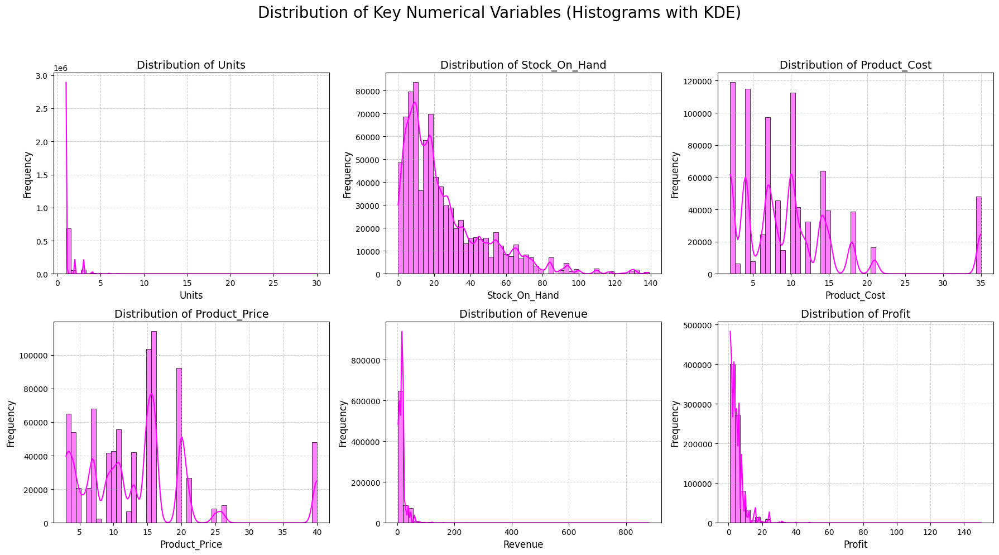

In [34]:
# --- Define the numerical columns to plot ---

columns_to_plot = ['Units', 'Stock_On_Hand', 'Product_Cost', 'Product_Price', 'Revenue', 'Profit']

# Set a professional plotting style
# sns.set_theme(style="whitegrid")

# Create a figure and a grid of subplots (2 rows, 3 columns)
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 10)) # Adjust figsize as needed
axes = axes.flatten() # Flatten the 2x3 array of axes for easy iteration

fig.suptitle('Distribution of Key Numerical Variables (Histograms with KDE)', fontsize=20, y=1.02) # Main title for the entire figure

# Loop through each column and plot its histogram with KDE
for i, col in enumerate(columns_to_plot):
    # Use sns.histplot for histogram and KDE (Kernel Density Estimate)
    sns.histplot(data=df, x=col, kde=True, ax=axes[i], bins=50, color='magenta', palette='Set1' , edgecolor='black')

    # Set title and labels for each subplot
    axes[i].set_title(f'Distribution of {col}', fontsize=14)
    axes[i].set_xlabel(col, fontsize=12)
    axes[i].set_ylabel('Frequency', fontsize=12)

    # Optional: Add grid for better readability
    axes[i].grid(True, linestyle='--', alpha=0.6)

# Adjust layout to prevent titles/labels from overlapping
plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # [left, bottom, right, top] for padding

# Display the plot
plt.show()

### C. Visualizing the discrete numerical variables

* Visualizing the product price distributions
* Visualizing the product cost distributions

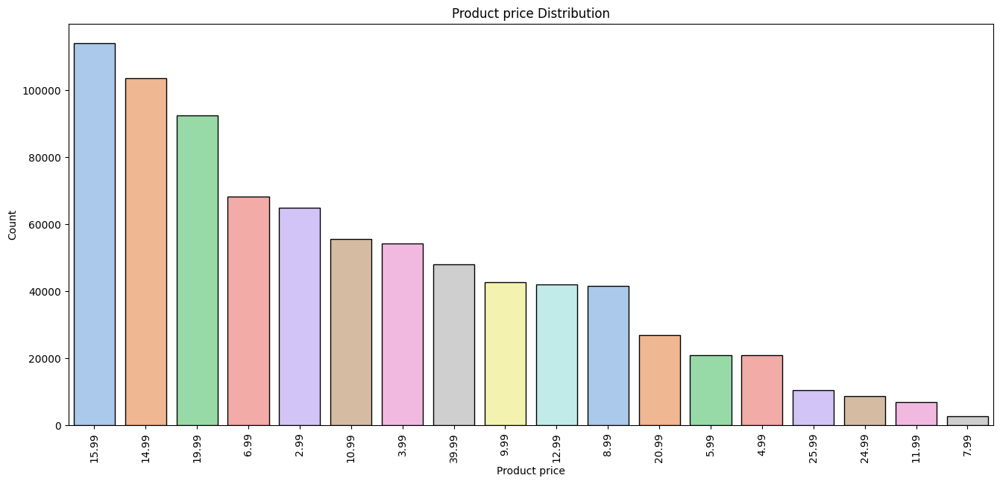

In [35]:
# Visualizing the product price distributions

plt.figure(figsize = (16,7))
sns.barplot(df['Product_Price'].value_counts() , palette = 'pastel' , edgecolor = 'black' , order = df['Product_Price'].value_counts().index)

plt.title('Product price Distribution')
plt.xlabel('Product price')
plt.ylabel('Count')
plt.xticks(rotation = 90)
plt.grid(False)
plt.show()

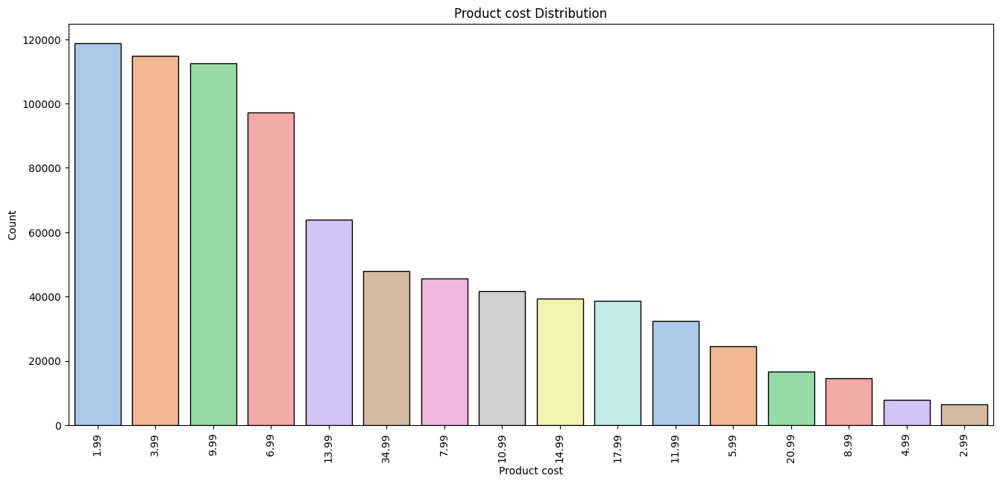

In [36]:
# Visualizing the product cost distributions

plt.figure(figsize = (16,7))
sns.barplot(df['Product_Cost'].value_counts() , palette = 'pastel' , edgecolor = 'black' , order = df['Product_Cost'].value_counts().index)

plt.title('Product cost Distribution')
plt.xlabel('Product cost')
plt.ylabel('Count')
plt.xticks(rotation = 90)
plt.grid(False)
plt.show()

# 8. Exploratory Data Analysis - Univariate Analysis of Categorical Variables

In [37]:
# Categorical Variables (Product_Name, Product_Category, Store_Name, Store_City, Store_Location)

### A. Quantitative analysis

* What are the most frequent Product_Names and Product_Categorys? What is their count/percentage?
* How many unique Store_Names, Store_Citys, and Store_Locations are there?
* What is the distribution of key categorical variables etc., in terms of counts and proportions?

In [38]:
print("--- Univariate Analysis of Categorical Columns ---")

# 1. Most frequent Product_Names and Product_Categorys (count/percentage)

print("\n1. Frequency and Percentage of 'Product_Name':")
print(df['Product_Name'].value_counts())
print("\nPercentage of 'Product_Name':")
print(df['Product_Name'].value_counts(normalize=True) * 100) # Multiply by 100 for percentage

print("\n" + "="*50)

print("\nFrequency and Percentage of 'Product_Category':")
print(df['Product_Category'].value_counts())
print("\nPercentage of 'Product_Category':")
print(df['Product_Category'].value_counts(normalize=True) * 100)

# 2. Number of unique Store_Names, Store_Citys, and Store_Locations

print("\n" + "="*50)
print("\n2. Number of Unique Values for Store-related Columns:")
print(f"   Number of unique 'Store_Name's: {df['Store_Name'].nunique()}")
print(f"   Number of unique 'Store_City's: {df['Store_City'].nunique()}")
print(f"   Number of unique 'Store_Location's: {df['Store_Location'].nunique()}")

# 3. Distribution of Workclass, Education, Marital Status, etc. (counts and proportions)

print("\n" + "="*50)
print("\n3. Distribution (Counts and Proportions) of Key Categorical Columns:")

categorical_columns = [
    'Product_Name', 'Product_Category', 'Store_Name', 'Store_City', 'Store_Location'
]

for col in categorical_columns:
    print(f"\n--- Distribution for '{col}' ---")
    print("Counts:")
    print(df[col].value_counts(dropna=False)) # dropna=False to include NaN counts
    print("\nProportions (%):")
    print(df[col].value_counts(normalize=True, dropna=False) * 100)
    print("-" * 30) # Separator for clarity between columns

--- Univariate Analysis of Categorical Columns ---

1. Frequency and Percentage of 'Product_Name':
Product_Name
Colorbuds                72988
Deck Of Cards            68083
PlayDoh Can              64834
Barrel O' Slime          54078
Action Figure            48497
Lego Bricks              48030
Splash Balls             41559
Magic Sand               39293
Rubik's Cube             38703
Animal Figures           32250
Dino Egg                 28181
Dart Gun                 26203
Glass Marbles            24507
Mini Ping Pong Set       24378
Dinosaur Figures         24311
Nerf Gun                 23709
Kids Makeup Kit          21648
Hot Wheels 5-Pack        20776
PlayDoh Toolkit          20736
Gamer Headphones         15543
Etch A Sketch            11205
Toy Robot                10494
Mr. Potatohead            7804
Foam Disk Launcher        6812
Jenga                     6370
Supersoaker Water Gun     6088
PlayDoh Playset           6067
Teddy Bear                6034
Plush Pony          

### B. Visualization using Bar Plots (Count Plots)

* Variables - Product_Name, Product_Category, Store_Name, Store_City, Store_Location
* Objective - showing the frequency distribution of each category.

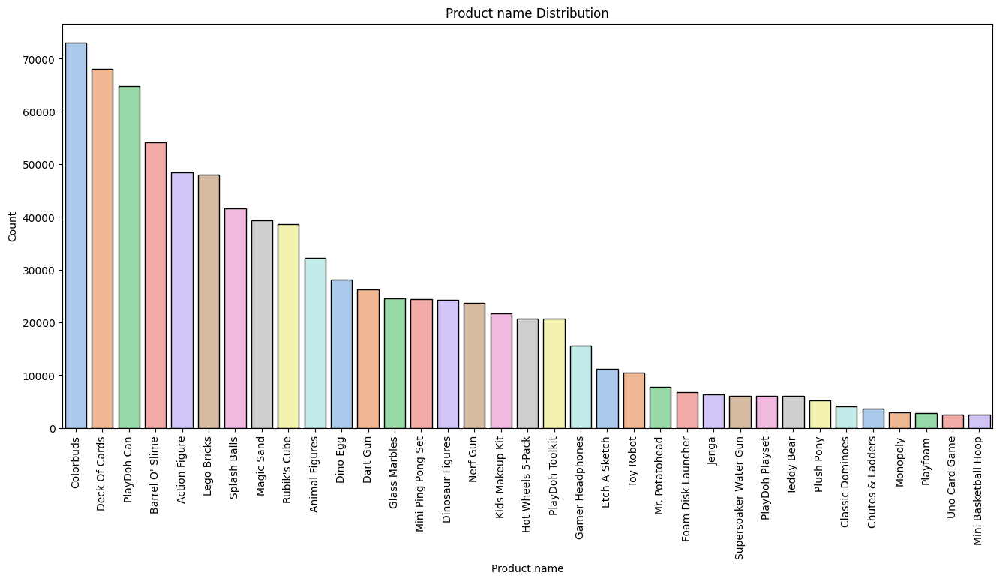

In [39]:
# Visualizing the product name distributions

plt.figure(figsize = (16,7))
sns.barplot(df['Product_Name'].value_counts() , palette = 'pastel' , edgecolor = 'black')

plt.title('Product name Distribution')
plt.xlabel('Product name')
plt.ylabel('Count')
plt.xticks(rotation = 90)
plt.grid(False)
plt.show()

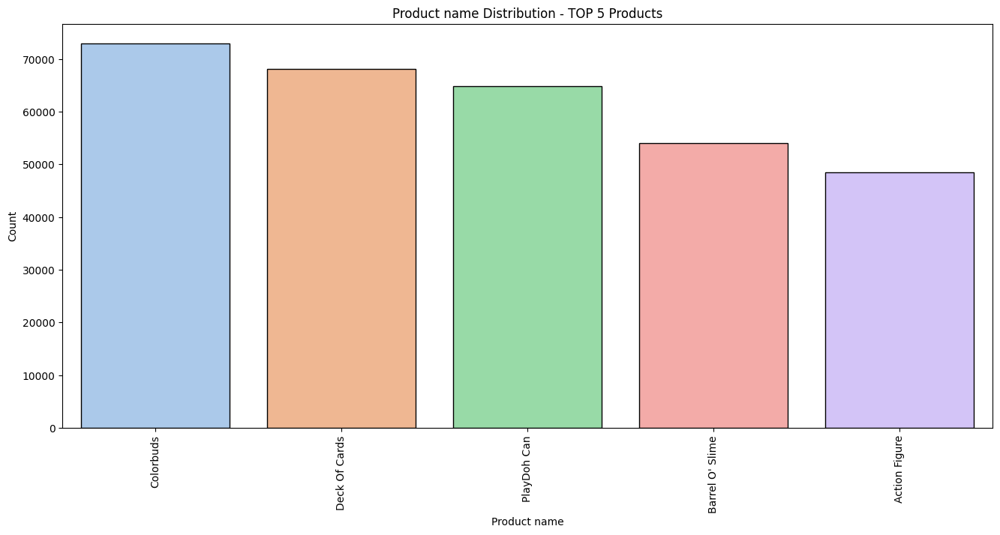

In [40]:
# Visualizing the product name distributions ( TOP 5)

plt.figure(figsize = (16,7))
sns.barplot(df['Product_Name'].value_counts().head() , palette = 'pastel' , edgecolor = 'black')

plt.title('Product name Distribution - TOP 5 Products')
plt.xlabel('Product name')
plt.ylabel('Count')
plt.xticks(rotation = 90)
plt.grid(False)
plt.show()

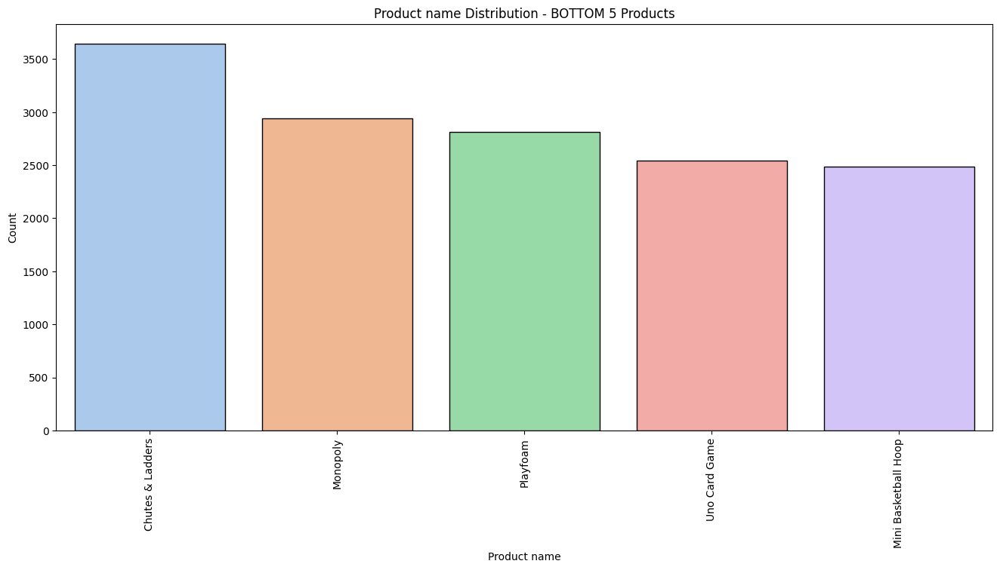

In [41]:
# Visualizing the product name distributions ( Bottom 5)

plt.figure(figsize = (16,7))
sns.barplot(df['Product_Name'].value_counts().tail() , palette = 'pastel' , edgecolor = 'black')

plt.title('Product name Distribution - BOTTOM 5 Products')
plt.xlabel('Product name')
plt.ylabel('Count')
plt.xticks(rotation = 90)
plt.grid(False)
plt.show()

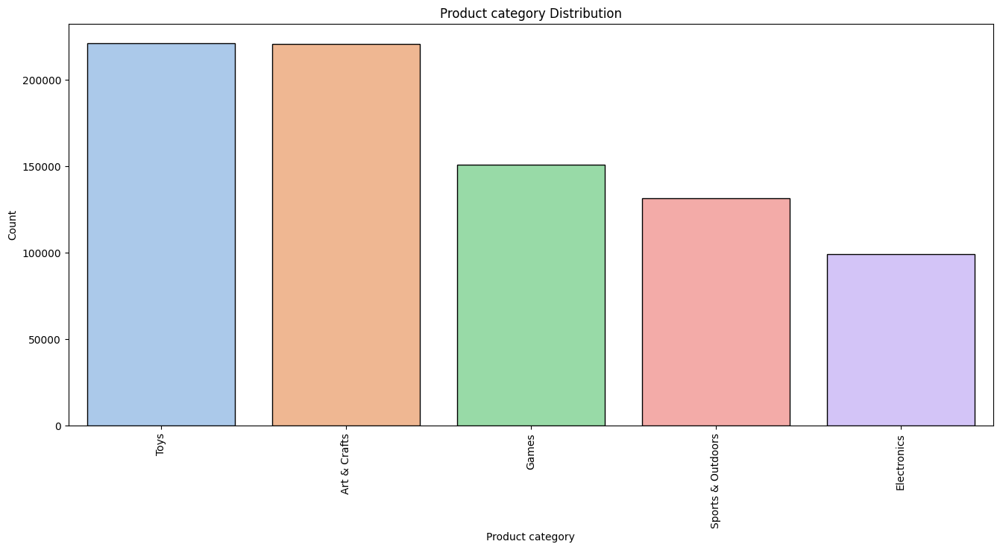

In [42]:
# Visualizing the product category distributions

plt.figure(figsize = (16,7))
sns.barplot(df['Product_Category'].value_counts() , palette = 'pastel' , edgecolor = 'black')

plt.title('Product category Distribution')
plt.xlabel('Product category')
plt.ylabel('Count')
plt.xticks(rotation = 90)
plt.grid(False)
plt.show()

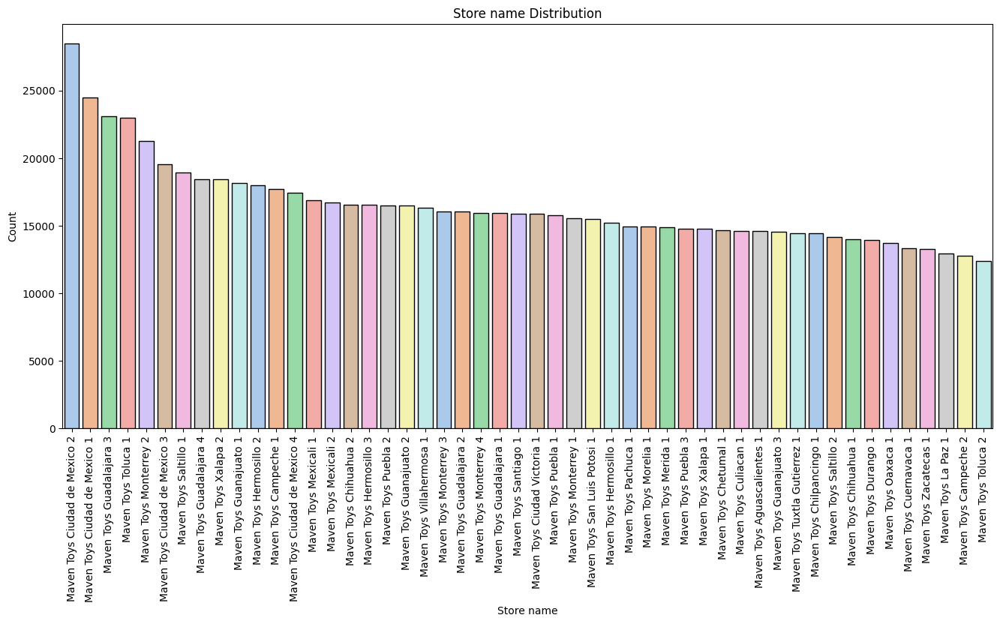

In [43]:
# Visualizing the Store Name distributions

plt.figure(figsize = (16,7))
sns.barplot(df['Store_Name'].value_counts() , palette = 'pastel' , edgecolor = 'black')

plt.title('Store name Distribution')
plt.xlabel('Store name')
plt.ylabel('Count')
plt.xticks(rotation = 90)
plt.grid(False)
plt.show()

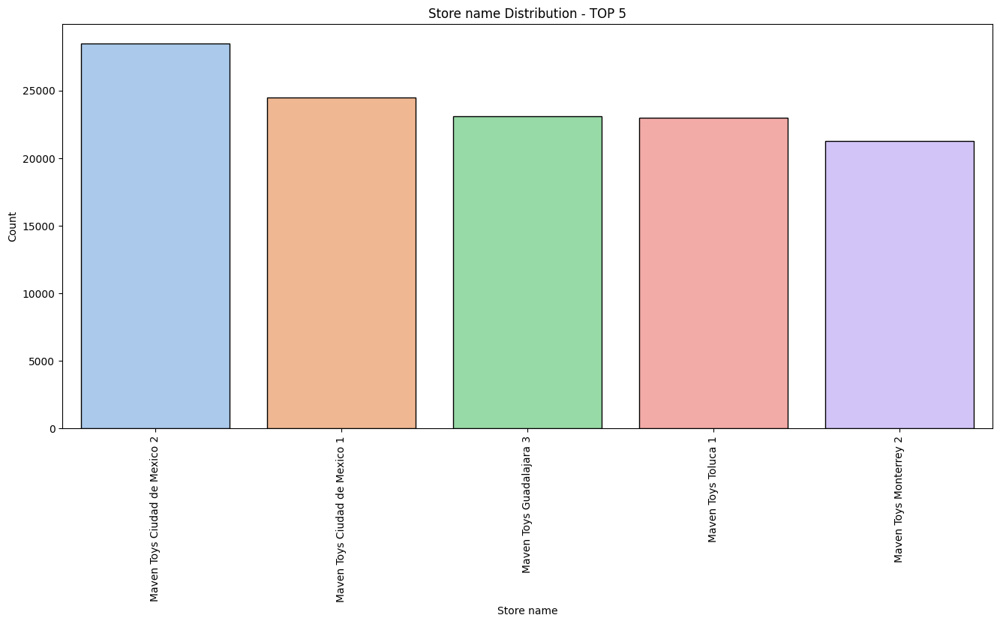

In [44]:
# Visualizing the Store Name distributions - Top 5

plt.figure(figsize = (16,7))
sns.barplot(df['Store_Name'].value_counts().head() , palette = 'pastel' , edgecolor = 'black')

plt.title('Store name Distribution - TOP 5')
plt.xlabel('Store name')
plt.ylabel('Count')
plt.xticks(rotation = 90)
plt.grid(False)
plt.show()

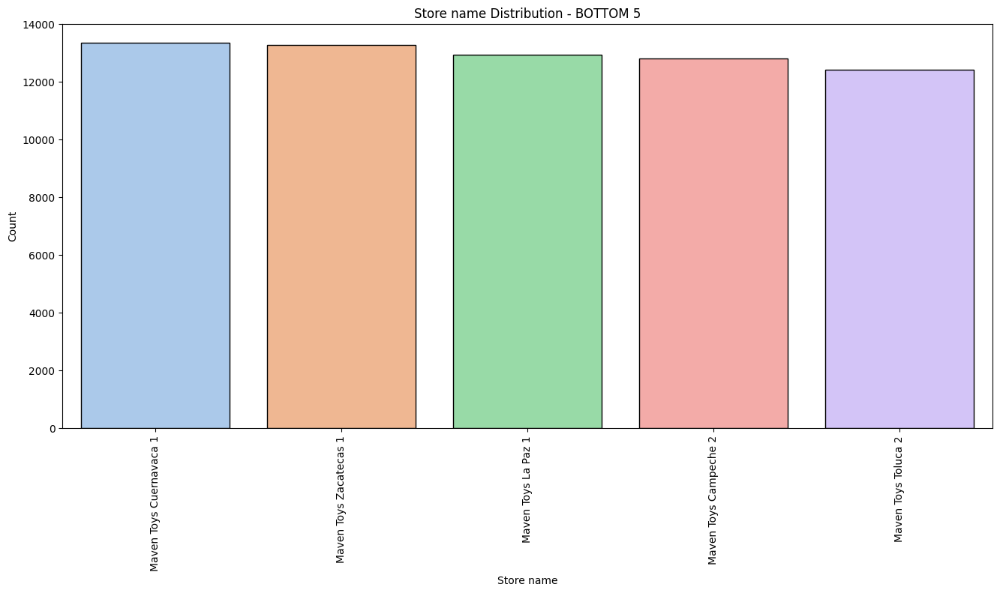

In [45]:
# Visualizing the Store Name distributions - Bottom 5

plt.figure(figsize = (16,7))
sns.barplot(df['Store_Name'].value_counts().tail() , palette = 'pastel' , edgecolor = 'black')

plt.title('Store name Distribution - BOTTOM 5')
plt.xlabel('Store name')
plt.ylabel('Count')
plt.xticks(rotation = 90)
plt.grid(False)
plt.show()

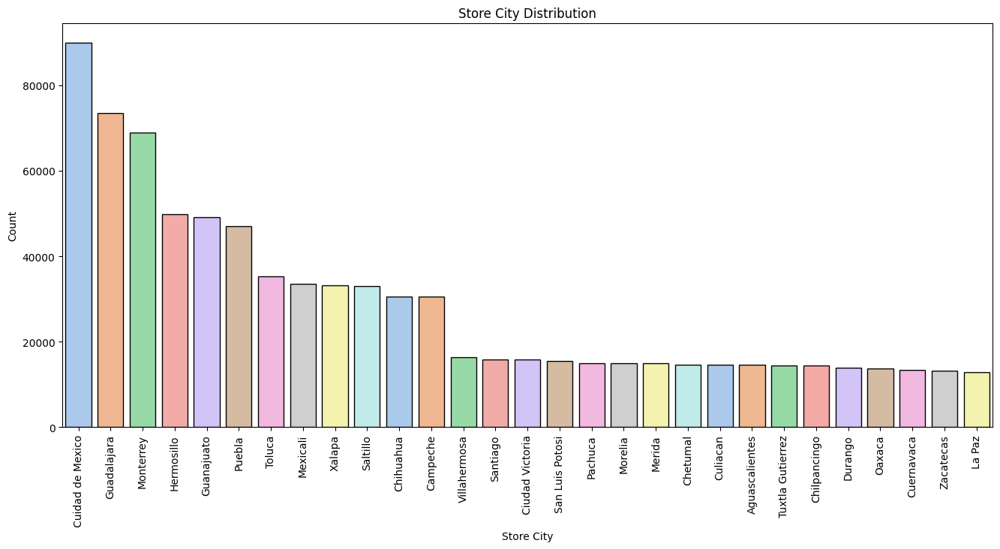

In [46]:
# Visualizing the store city distributions

plt.figure(figsize = (16,7))
sns.barplot(df['Store_City'].value_counts() , palette = 'pastel' , edgecolor = 'black')

plt.title('Store City Distribution')
plt.xlabel('Store City')
plt.ylabel('Count')
plt.xticks(rotation = 90)
plt.grid(False)
plt.show()

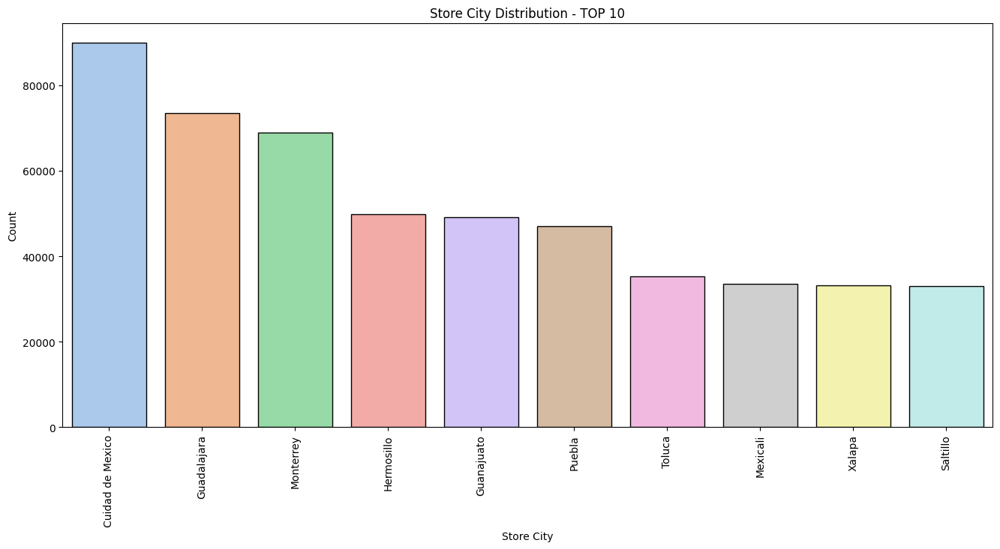

In [47]:
# Visualizing the store city distributions ( TOP 10)

plt.figure(figsize = (16,7))
sns.barplot(df['Store_City'].value_counts().head(10) , palette = 'pastel' , edgecolor = 'black')

plt.title('Store City Distribution - TOP 10')
plt.xlabel('Store City')
plt.ylabel('Count')
plt.xticks(rotation = 90)
plt.grid(False)
plt.show()

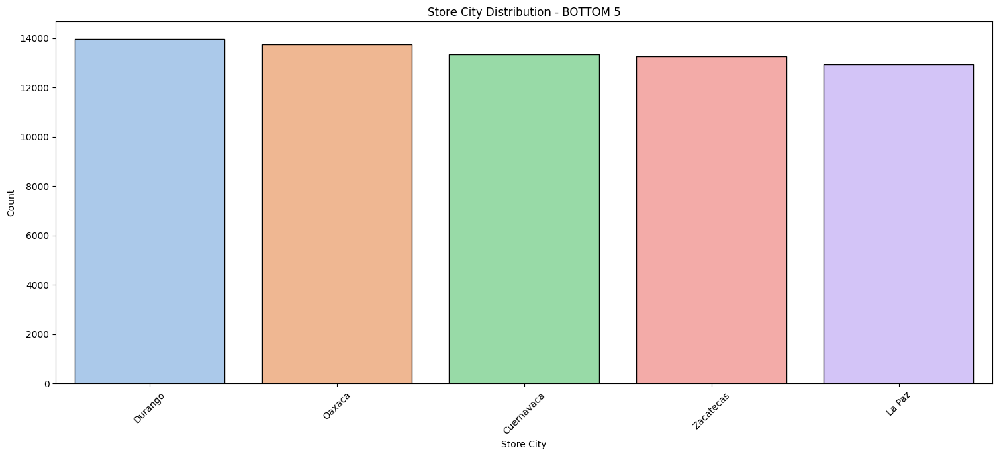

In [48]:
# Visualizing the store city distributions ( Bottom 5)

plt.figure(figsize = (18,7))
sns.barplot(df['Store_City'].value_counts().tail() , palette = 'pastel' , edgecolor = 'black')

plt.title('Store City Distribution - BOTTOM 5')
plt.xlabel('Store City')
plt.ylabel('Count')
plt.grid(False)
plt.xticks(rotation = 45)
plt.grid(False)
plt.show()

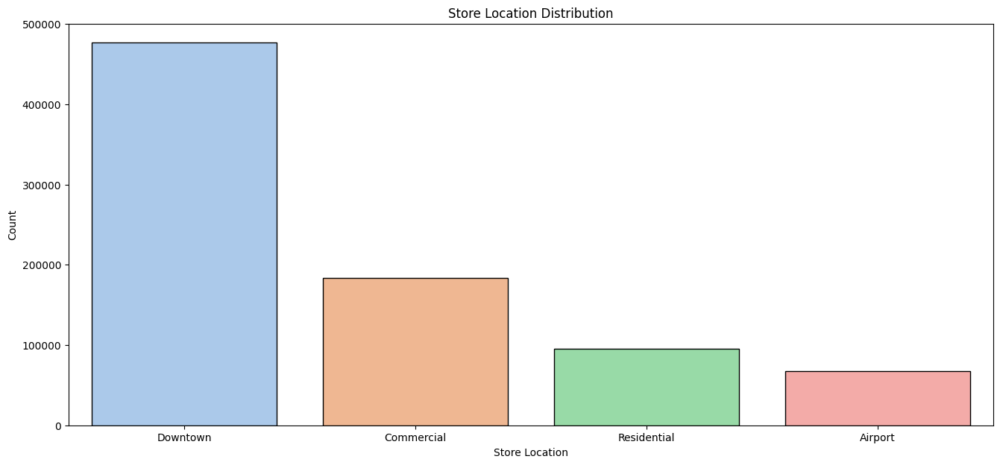

In [49]:
# Visualizing the store location distributions

plt.figure(figsize = (16,7))
sns.barplot(df['Store_Location'].value_counts() , palette = 'pastel' , edgecolor = 'black')

plt.title('Store Location Distribution')
plt.xlabel('Store Location')
plt.ylabel('Count')
plt.grid(False)
plt.show()

### C. Visualization using Donut chart

* Variables - Product_Category, Product_Name , Store_City , Store_Location
* Objective - For the top N categories show proportional representation.

In [50]:
# Define the utility function

def plot_categorical_donut(dataframe, column_name, n_categories=7, figsize=(10, 10)):
    """
    Generates and displays a donut chart for the top N categories of a specified column.

    Parameters:
    dataframe (pd.DataFrame): The input DataFrame.
    column_name (str): The name of the categorical column to plot.
    n_categories (int): The number of top categories to display explicitly.
                        Remaining categories will be grouped into 'Other'.
    figsize (tuple): A tuple (width, height) for the figure size.
    """
    if column_name not in dataframe.columns:
        print(f"Error: Column '{column_name}' not found in the DataFrame.")
        return

    # Calculate value counts
    counts = dataframe[column_name].value_counts()

    # Prepare data for plotting: select top N and sum the rest into 'Other'
    if len(counts) > n_categories:
        top_n = counts.head(n_categories)
        other_sum = counts.iloc[n_categories:].sum()
        if other_sum > 0:
            plot_data = pd.concat([top_n, pd.Series({'Other': other_sum})])
        else:
            plot_data = top_n
    else:
        plot_data = counts

    # Define colors
    colors = sns.color_palette('pastel', n_colors=len(plot_data))
    if 'Other' in plot_data.index:
        colors = sns.color_palette('pastel', n_colors=len(plot_data) - 1) + ['gray'] # Distinct color for 'Other'

    # Create figure and axis for the plot
    fig, ax = plt.subplots(figsize=figsize)

    # Plotting the donut chart
    wedges, texts, autotexts = ax.pie(
        plot_data,
        labels=plot_data.index,
        autopct='%1.1f%%',       # Format percentages
        startangle=90,           # Start at the top
        colors=colors,
        pctdistance=0.8,         # Position of percentage labels (closer to center of donut hole)
        labeldistance=1.05,      # Position of category labels (outside the donut)
        wedgeprops=dict(width=0.4, edgecolor='black', linewidth=1) # Donut hole via width
    )

    # Customize percentage labels
    for autotext in autotexts:
        autotext.set_color('black')
        autotext.set_fontsize(12)
        autotext.set_fontweight('bold')

    # Customize category labels
    for text in texts:
        text.set_fontsize(12)

    # Set title
    ax.set_title(f'Proportional Distribution of Top {n_categories} {column_name} Categories', fontsize=16, fontweight='bold')
    ax.axis('equal') # Ensure circle

    plt.tight_layout()
    plt.show()

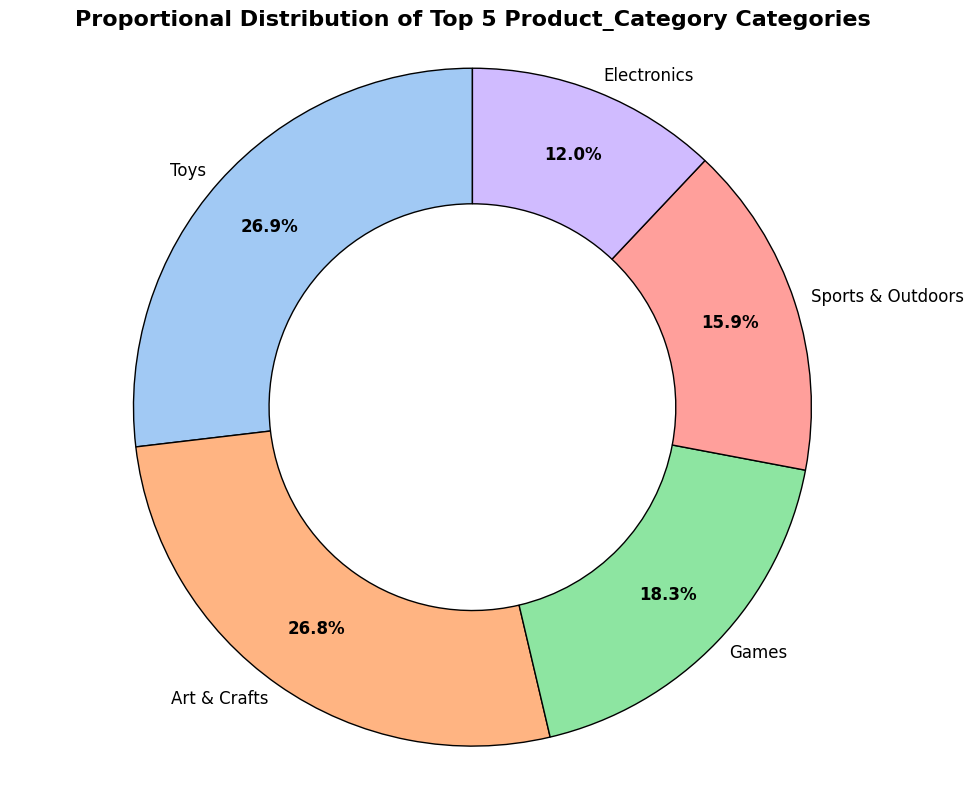

In [51]:
# Donut Chart for Product_Category (Top 5)

plot_categorical_donut(df, 'Product_Category', n_categories=5 , figsize=(10,8))

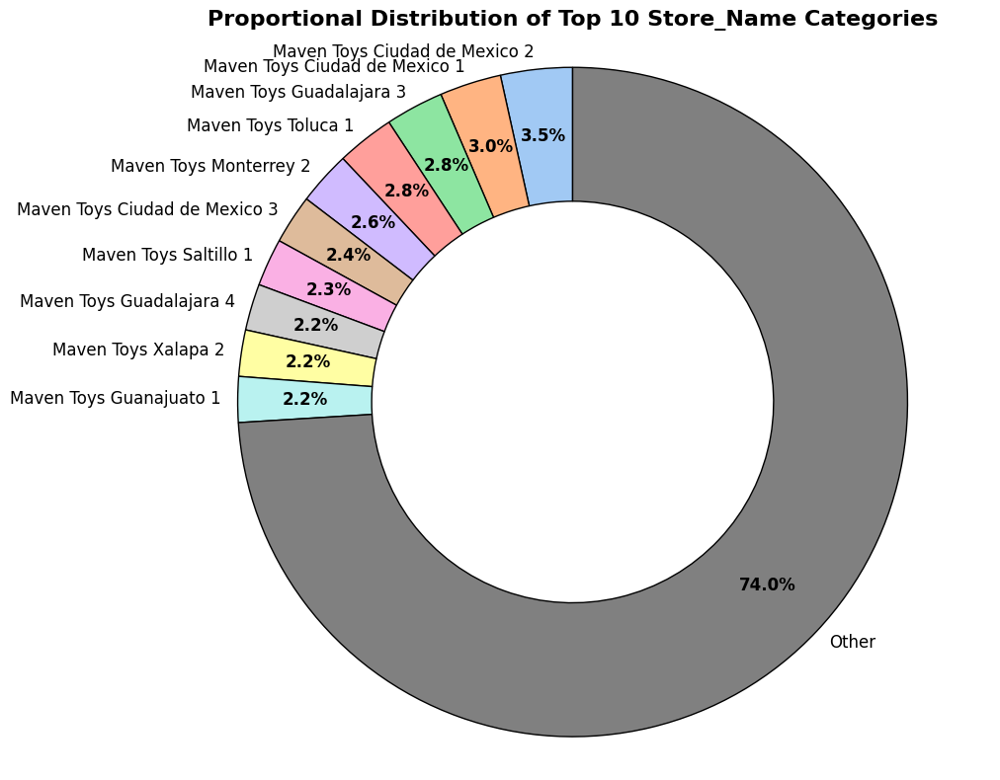

In [52]:
# Donut Chart for Store_City (Top 5)

plot_categorical_donut(df, 'Store_Name', n_categories=10, figsize=(10,8))

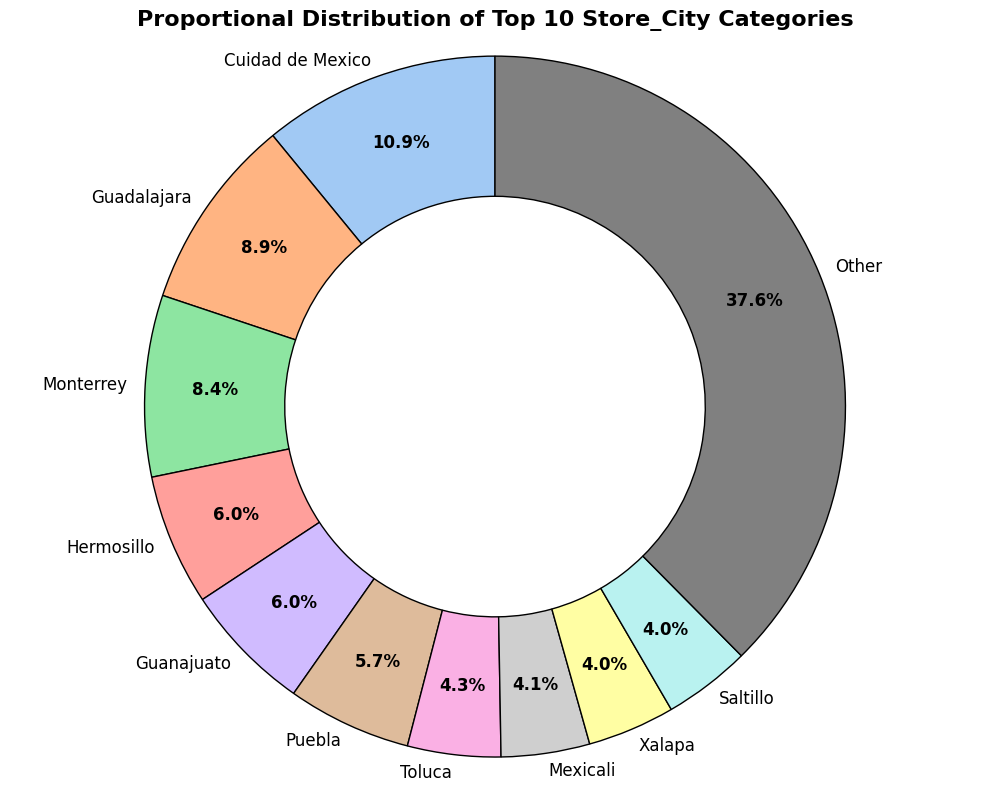

In [53]:
# Donut Chart for Store_City (Top 5)

plot_categorical_donut(df, 'Store_City', n_categories=10, figsize=(10,8))

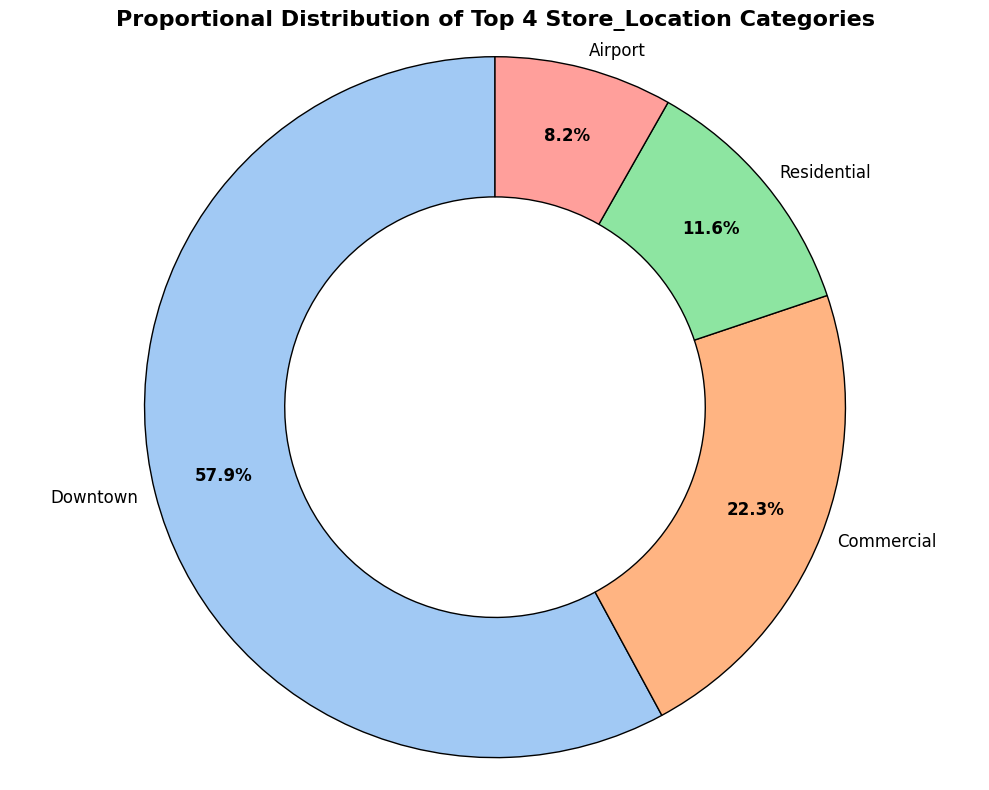

In [54]:
# Donut Chart for Store_Location (All Categories)

plot_categorical_donut(df, 'Store_Location', n_categories=df['Store_Location'].nunique() , figsize=(10,8))

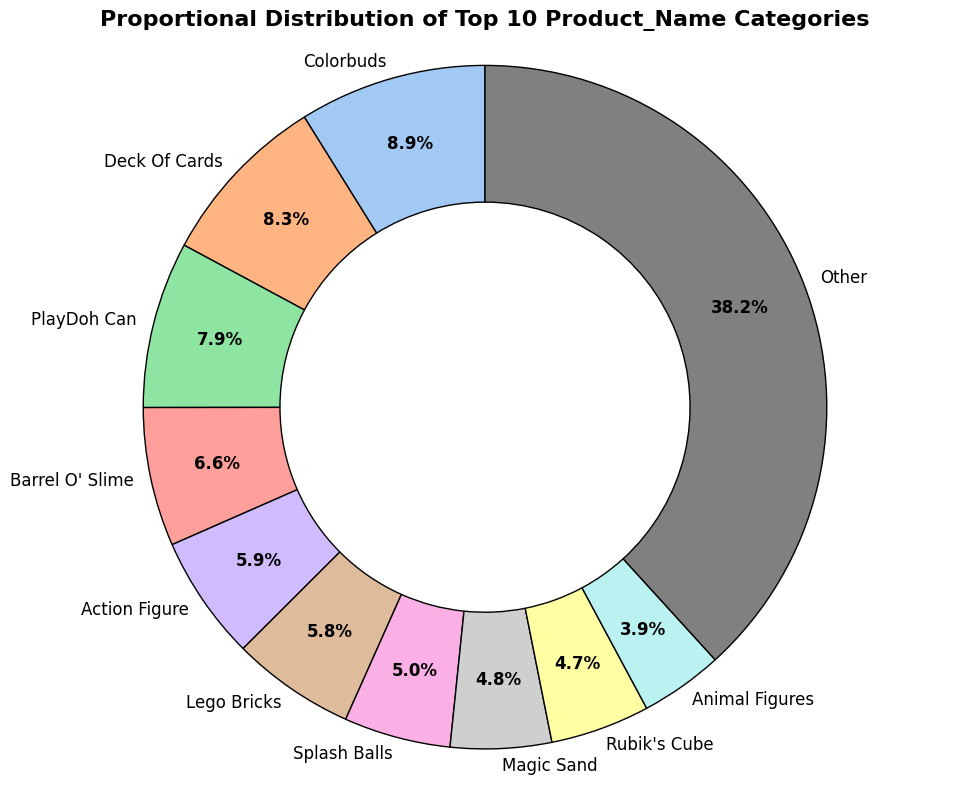

In [55]:
# Example for a column with many unique values, showing only top 10
# Donut Chart for Product_Name (Top 10)

plot_categorical_donut(df, 'Product_Name', n_categories=10, figsize=(10,8))

# 9. Exploratory Data Analysis - Timeseries Analysis - Absolute Values of the KPI's

* What is the date range of the dataset?
* Utility function to aggregate KPI's ( Units , Revenue and Profit ) at different frequency ( Weekly , Monthly and Quarterly )
* Execute the aggregation function - Weekly aggregation of KPI's ( Units , Revenue and Profit )
* Execute the aggregation function - Monthly aggregation of KPI's ( Units , Revenue and Profit )
* Execute the aggregation function - Quarterly aggregation of KPI's ( Units , Revenue and Profit )
* Utility function for data visualization of timeseries data at different frequency
* Timeseries visualization of Weekly aggregated KPI's
* Timeseries visualization of Monthly aggregated KPI's
* Timeseries visualization of Quarterly aggregated KPI's


In [56]:
# Temporal variables - Date , Store_Open_Date

In [57]:
df.head()

,Sale_ID,Date,Store_ID,Product_ID,Units,Product_Name,Product_Category,Product_Cost,Product_Price,Store_Name,Store_City,Store_Location,Store_Open_Date,Stock_On_Hand,Revenue,Profit
0,1,2022-01-01,24,4,1,Chutes & Ladders,Games,9.99,12.99,Maven Toys Aguascalientes 1,Aguascalientes,Downtown,2010-07-31,1,12.99,3.0
1,2,2022-01-01,28,1,1,Action Figure,Toys,9.99,15.99,Maven Toys Puebla 2,Puebla,Downtown,2011-04-01,6,15.99,6.0
2,3,2022-01-01,6,8,1,Deck Of Cards,Games,3.99,6.99,Maven Toys Mexicali 1,Mexicali,Commercial,2003-12-13,50,6.99,3.0
3,4,2022-01-01,48,7,1,Dart Gun,Sports & Outdoors,11.99,15.99,Maven Toys Saltillo 2,Saltillo,Commercial,2016-03-23,28,15.99,4.0
4,5,2022-01-01,44,18,1,Lego Bricks,Toys,34.99,39.99,Maven Toys Puebla 3,Puebla,Residential,2014-12-27,117,39.99,5.0


### A. What is the date range of the dataset?

In [58]:
# Assume 'df' DataFrame is already loaded and contains the specified columns,
# especially the 'Date' column as datetime64[ns].

# --- 1. What is the date range of the dataset? ---
print("--- 1. Date Range of the Dataset ---")
min_date = df['Date'].min()
max_date = df['Date'].max()

print(f"  Start Date: {min_date.strftime('%Y-%m-%d')}")
print(f"  End Date:   {max_date.strftime('%Y-%m-%d')}")

--- 1. Date Range of the Dataset ---
  Start Date: 2022-01-01
  End Date:   2023-09-30


In [59]:
df.shape

(823030, 16)

### B. Utility function to aggregate KPI's ( Units , Revenue and Profit ) at different frequency ( Weekly , Monthly and Quarterly )

In [60]:
# Define the Utility function to aggregate the data

def aggregate_kpis_by_frequency(
    df: pd.DataFrame,
    date_column: str,
    aggregation_frequency: str,
    kpis: list
):
    """
    Aggregates specified KPIs by a given time frequency (Week, Month, Quarter, Half-Year, Year).

    Args:
        df (pd.DataFrame): The input DataFrame.
        date_column (str): The name of the date column (must be datetime64[ns]).
        aggregation_frequency (str): The frequency for aggregation.
                                     Accepted values: 'W' (Weekly), 'M' (Monthly),
                                     'Q' (Quarterly)
        kpis (list): A list of KPI column names to aggregate (e.g., ['Units', 'Revenue', 'Profit']).

    Returns:
        pd.DataFrame: A DataFrame aggregated by the specified frequency, containing the sum
                      of the specified KPIs. Returns an empty DataFrame if inputs are invalid.
    """

    # --- Input Validation ---
    if not pd.api.types.is_datetime64_any_dtype(df[date_column]):
        print(f"Error: '{date_column}' column is not in datetime format. Please convert it first.")
        return pd.DataFrame()

    for kpi in kpis:
        if kpi not in df.columns:
            print(f"Error: KPI column '{kpi}' not found in DataFrame.")
            return pd.DataFrame()

    valid_frequencies = {'W', 'M', 'Q'}
    if aggregation_frequency.upper() not in valid_frequencies:
        print(f"Error: Invalid aggregation_frequency '{aggregation_frequency}'. "
              f"Accepted values are {', '.join(valid_frequencies)}.")
        return pd.DataFrame()

    # --- Data Preparation ---
    df_selected = df[[date_column] + kpis].copy()
    daily_agg_df = df_selected.groupby(df_selected[date_column].dt.date)[kpis].sum().reset_index()
    daily_agg_df[date_column] = pd.to_datetime(daily_agg_df[date_column])
    daily_agg_df = daily_agg_df.set_index(date_column)

    # --- Resampling and Aggregation ---
    if aggregation_frequency.upper() == 'W':
        resampled_df = daily_agg_df.resample('W')[kpis].sum()
        date_col_name = 'Week_End_Date'
    elif aggregation_frequency.upper() == 'M':
        resampled_df = daily_agg_df.resample('M')[kpis].sum()
        date_col_name = 'Month_End_Date'
    elif aggregation_frequency.upper() == 'Q':
        resampled_df = daily_agg_df.resample('Q')[kpis].sum()
        date_col_name = 'Quarter_End_Date'
    else:
        print(f"Internal Error: Unhandled aggregation_frequency '{aggregation_frequency}'.")
        return pd.DataFrame()

    resampled_df = resampled_df.reset_index()
    resampled_df.rename(columns={date_column: date_col_name}, inplace=True)

    return resampled_df

### C. Execute the aggregation function - Weekly aggregation of KPI's ( Units , Revenue and Profit )

In [61]:
# Define KPIs to aggregate

kpis_to_aggregate = ['Units', 'Revenue', 'Profit']

In [62]:
df.head()

,Sale_ID,Date,Store_ID,Product_ID,Units,Product_Name,Product_Category,Product_Cost,Product_Price,Store_Name,Store_City,Store_Location,Store_Open_Date,Stock_On_Hand,Revenue,Profit
0,1,2022-01-01,24,4,1,Chutes & Ladders,Games,9.99,12.99,Maven Toys Aguascalientes 1,Aguascalientes,Downtown,2010-07-31,1,12.99,3.0
1,2,2022-01-01,28,1,1,Action Figure,Toys,9.99,15.99,Maven Toys Puebla 2,Puebla,Downtown,2011-04-01,6,15.99,6.0
2,3,2022-01-01,6,8,1,Deck Of Cards,Games,3.99,6.99,Maven Toys Mexicali 1,Mexicali,Commercial,2003-12-13,50,6.99,3.0
3,4,2022-01-01,48,7,1,Dart Gun,Sports & Outdoors,11.99,15.99,Maven Toys Saltillo 2,Saltillo,Commercial,2016-03-23,28,15.99,4.0
4,5,2022-01-01,44,18,1,Lego Bricks,Toys,34.99,39.99,Maven Toys Puebla 3,Puebla,Residential,2014-12-27,117,39.99,5.0


In [63]:
# --- Aggregate Weekly output ---

print("\n--- Weekly Aggregation (Units, Revenue, Profit) ---")
weekly_agg_df = aggregate_kpis_by_frequency(df.copy(), 'Date', 'W', kpis_to_aggregate)
print(weekly_agg_df)
print(f"Total weeks: {len(weekly_agg_df)}")


--- Weekly Aggregation (Units, Revenue, Profit) ---
   Week_End_Date  Units    Revenue   Profit
0     2022-01-02   2891   40827.09  12843.0
1     2022-01-09   8827  128218.73  39223.0
2     2022-01-16   8089  112999.11  35413.0
3     2022-01-23   8184  120047.16  35805.0
4     2022-01-30   9013  125938.87  38881.0
..           ...    ...        ...      ...
87    2023-09-03  11958  157664.42  43081.0
88    2023-09-10  10645  136453.55  37936.0
89    2023-09-17  11892  148422.08  41638.0
90    2023-09-24  11817  148564.83  40692.0
91    2023-10-01  11375  140443.25  37605.0

[92 rows x 4 columns]
Total weeks: 92


### D. Execute the aggregation function - Monthly aggregation of KPI's ( Units , Revenue and Profit )

In [64]:
# --- Aggregate Monthly Output ---

print("\n--- Monthly Aggregation (Units, Revenue, Profit) ---")
monthly_agg_df = aggregate_kpis_by_frequency(df.copy(), 'Date', 'M', kpis_to_aggregate)
print(monthly_agg_df)
print(f"Total months: {len(monthly_agg_df)}")


--- Monthly Aggregation (Units, Revenue, Profit) ---
   Month_End_Date  Units    Revenue    Profit
0      2022-01-31  37971  541800.29  166700.0
1      2022-02-28  36894  540867.06  161709.0
2      2022-03-31  39970  589375.30  173970.0
3      2022-04-30  47097  681033.03  190079.0
4      2022-05-31  46524  668055.76  184017.0
5      2022-06-30  46659  656675.41  186120.0
6      2022-07-31  45469  548981.31  171996.0
7      2022-08-31  39243  482599.57  154283.0
8      2022-09-30  41747  581358.53  163254.0
9      2022-10-31  47351  618680.49  175216.0
10     2022-11-30  50902  658413.98  190939.0
11     2022-12-31  65472  870680.28  242133.0
12     2023-01-31  56032  742536.68  202037.0
13     2023-02-28  54330  720125.70  187618.0
14     2023-03-31  68990  879709.10  229379.0
15     2023-04-30  65242  824184.58  212639.0
16     2023-05-31  63504  821852.96  207918.0
17     2023-06-30  63911  804662.89  204664.0
18     2023-07-31  63357  825781.43  208008.0
19     2023-08-31  51104  

### E. Execute the aggregation function - Quarterly aggregation of KPI's ( Units , Revenue and Profit )

In [65]:
# --- Aggregate Quarterly Output ---

print("\n--- Quarterly Aggregation (Units, Revenue, Profit) ---")
quarterly_agg_df = aggregate_kpis_by_frequency(df.copy(), 'Date', 'Q', kpis_to_aggregate)
print(quarterly_agg_df) # Print all for quarterly as it's a smaller dataset
print(f"Total quarters: {len(quarterly_agg_df)}")


--- Quarterly Aggregation (Units, Revenue, Profit) ---
  Quarter_End_Date   Units     Revenue    Profit
0       2022-03-31  114835  1672042.65  502379.0
1       2022-06-30  140280  2005764.20  560216.0
2       2022-09-30  126459  1612939.41  489533.0
3       2022-12-31  163725  2147774.75  608288.0
4       2023-03-31  179352  2342371.48  619034.0
5       2023-06-30  192657  2450700.43  625221.0
6       2023-09-30  166583  2143664.17  562658.0
Total quarters: 7


### F. Utility function for data visualization of timeseries data at different frequency

In [66]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from typing import List

def plot_kpi_multiline_chart(
    df: pd.DataFrame,
    x_column: str,
    kpi_columns: List[str],
    title: str = "KPI Trends Over Time",
    y_label: str = "Value",
    colors: dict = None,
    add_zero_line: bool = False,
    y_lim: tuple = None,
    marker_style: str = 'o',
    line_width: float = 2.5
):
    """
    Creates a multiline chart to visualize trends of multiple KPIs over time.

    Args:
        df (pd.DataFrame): The DataFrame containing the time-series data and KPIs.
                           Assumes the DataFrame is already aggregated (e.g., weekly, monthly).
        x_column (str): The name of the column to use for the x-axis (e.g., 'Week_End_Date', 'Month_End_Date').
                        This column should be in datetime format or suitable for plotting on an axis.
        kpi_columns (List[str]): A list of KPI column names to plot as separate lines.
                                 (e.g., ['Units', 'Revenue', 'Profit']).
        title (str, optional): The main title of the chart. Defaults to "KPI Trends Over Time".
        y_label (str, optional): The label for the y-axis. Defaults to "Value".
        colors (dict, optional): A dictionary mapping KPI column names to desired colors.
                                 If None, seaborn's default color palette will be used.
                                 Example: {'Units': 'blue', 'Revenue': 'green', 'Profit': 'orange'}.
        add_zero_line (bool, optional): If True, adds a horizontal line at y=0. Useful for growth plots.
                                        Defaults to False.
        y_lim (tuple, optional): A tuple (min_val, max_val) to set explicit y-axis limits.
                                 If None, limits are automatically determined.
        marker_style (str, optional): Matplotlib marker style for data points. Defaults to 'o'.
        line_width (float, optional): Line width for the plots. Defaults to 2.5.
    """

    if not all(col in df.columns for col in kpi_columns):
        missing_kpis = [col for col in kpi_columns if col not in df.columns]
        print(f"Error: The following KPI columns were not found in the DataFrame: {missing_kpis}")
        return
    if x_column not in df.columns:
        print(f"Error: X-axis column '{x_column}' not found in the DataFrame.")
        return

    # Ensure x_column is treated as datetime for proper plotting if it's date-like string
    if pd.api.types.is_object_dtype(df[x_column]) or pd.api.types.is_string_dtype(df[x_column]):
        try:
            df[x_column] = pd.to_datetime(df[x_column])
        except Exception as e:
            print(f"Warning: Could not convert '{x_column}' to datetime. Plotting as is. Error: {e}")

    # Set a nice seaborn style
    sns.set_style("whitegrid")

    # Create the figure and axes
    fig, ax = plt.subplots(figsize=(20, 8)) # Adjusted size for better visibility

    # Plot each KPI
    for i, kpi in enumerate(kpi_columns):
        if colors and kpi in colors:
            line_color = colors[kpi]
        else:
            # Use seaborn's default palette if no custom colors are provided
            line_color = sns.color_palette()[i % len(sns.color_palette())]

        ax.plot(df[x_column], df[kpi], marker=marker_style, color=line_color,
                label=kpi, linewidth=line_width)

    # Add labels and title
    ax.set_xlabel(x_column.replace('_', ' ').title(), fontsize=14) # Auto-format label
    ax.set_ylabel(y_label, fontsize=14)
    ax.set_title(title, fontsize=18, weight='bold')

    # Add horizontal line at y=0 if requested (useful for growth percentages)
    if add_zero_line:
        ax.axhline(0, color='gray', linestyle='--', linewidth=0.8)

    # Set y-axis limits if provided
    if y_lim:
        ax.set_ylim(y_lim)
        # Optional: set y-ticks based on y_lim, can make more generic or remove
        # if y_label includes "%", format ticks as percentages
        if '%' in y_label:
            ax.set_yticks(np.arange(y_lim[0], y_lim[1] + 1, (y_lim[1] - y_lim[0]) / 4)) # Example for 4 ticks
            ax.set_yticklabels([f'{int(y)}%' for y in ax.get_yticks()])


    # Customize plot appearance
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.tick_params(axis='x', labelsize=12, rotation=45) # Rotate x-labels
    ax.tick_params(axis='y', labelsize=12)
    ax.grid(False) # Ensure grid is visible

    # Add legend
    # Place legend outside the plot to avoid obscuring lines, or adjust its position.
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=12, frameon=False)

    plt.tight_layout(rect=[0, 0, 0.85, 1]) # Adjust layout to prevent legend from overlapping
    plt.show()

### G. Timeseries visualization of Weekly aggregated KPI's

* Example 1: Plotting Weekly Units, Revenue, and Profit
* Example2 : Plotting Weekly Unit Sales
* Example3 : Plotting Weekly Revenue
* Example4 : Plotting Weekly Profit

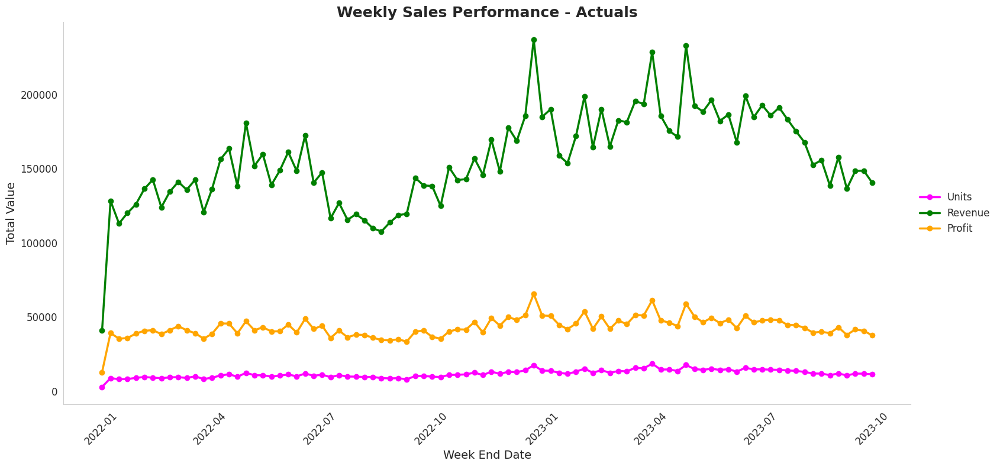

In [67]:
# Example 1: Plotting Weekly Units, Revenue, and Profit


plot_kpi_multiline_chart(
    df=weekly_agg_df,
    x_column='Week_End_Date',
    kpi_columns=['Units', 'Revenue', 'Profit'],
    title='Weekly Sales Performance - Actuals',
    y_label='Total Value',
    colors={'Units': 'magenta', 'Revenue': 'green', 'Profit': 'orange'}
)

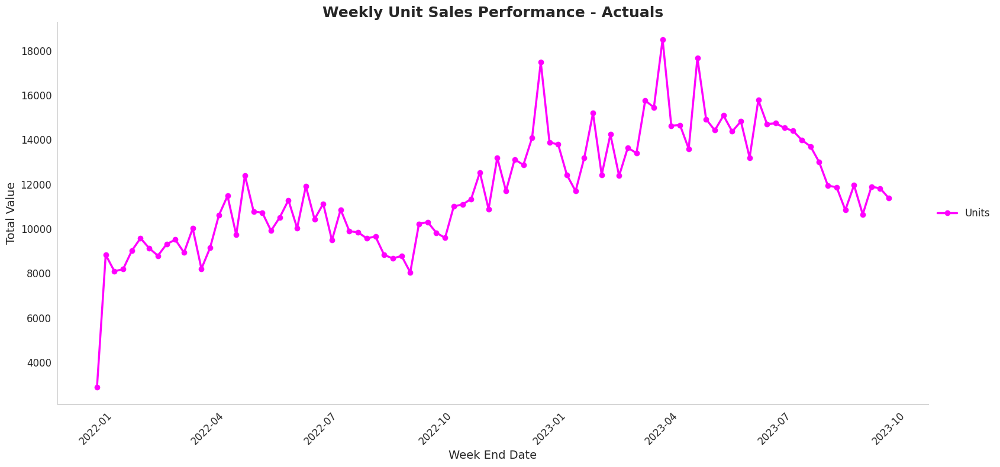

In [68]:
# Example2 : Plotting Weekly Unit Sales


plot_kpi_multiline_chart(
    df=weekly_agg_df,
    x_column='Week_End_Date',
    kpi_columns=['Units'],
    title='Weekly Unit Sales Performance - Actuals',
    y_label='Total Value',
    colors={'Units': 'magenta'}
)

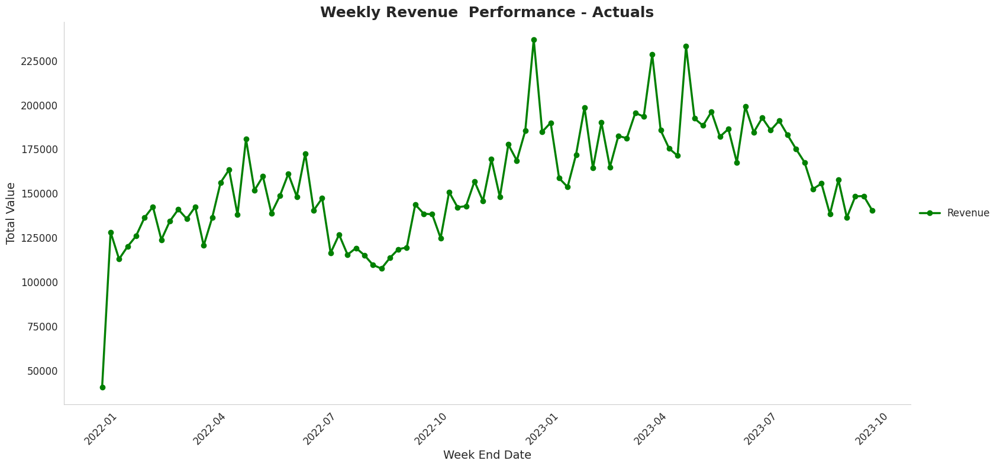

In [69]:
# Example3 : Plotting Weekly Revenue


plot_kpi_multiline_chart(
    df=weekly_agg_df,
    x_column='Week_End_Date',
    kpi_columns=['Revenue'],
    title='Weekly Revenue  Performance - Actuals',
    y_label='Total Value',
    colors={'Revenue': 'green'}
)

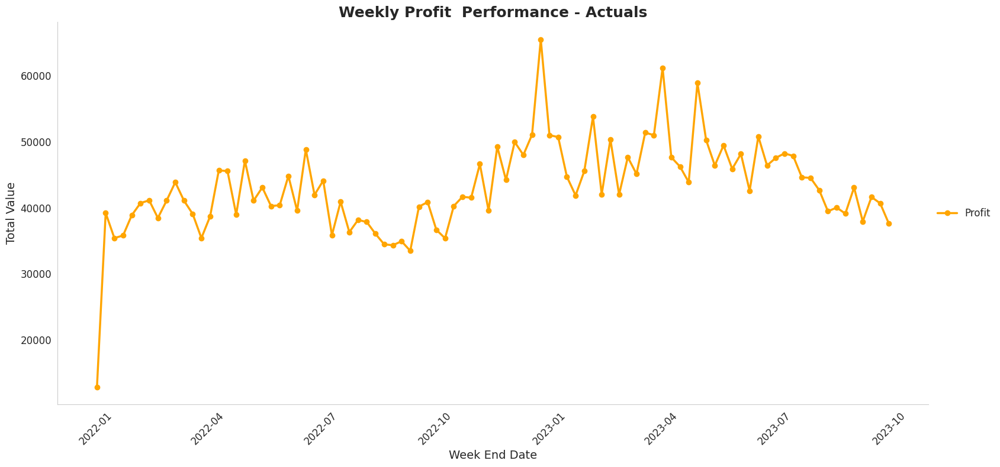

In [70]:
# Example4 : Plotting Weekly Profit


plot_kpi_multiline_chart(
    df=weekly_agg_df,
    x_column='Week_End_Date',
    kpi_columns=['Profit'],
    title='Weekly Profit  Performance - Actuals',
    y_label='Total Value',
    colors={'Profit': 'orange'}
)

# Interpretation

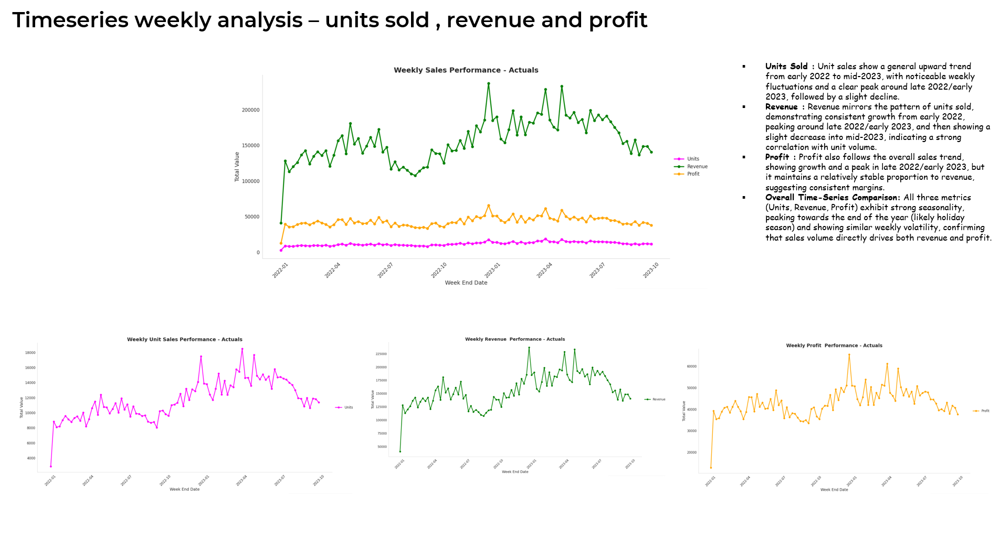


### H. Timeseries visualization of Monthly aggregated KPI's

* Example 1: Plotting Monthly Units, Revenue, and Profit
* Example2 : Plotting Monthly Unit Sales
* Example3 : Plotting Monthly Revenue
* Example4 : Plotting Monthly Profit

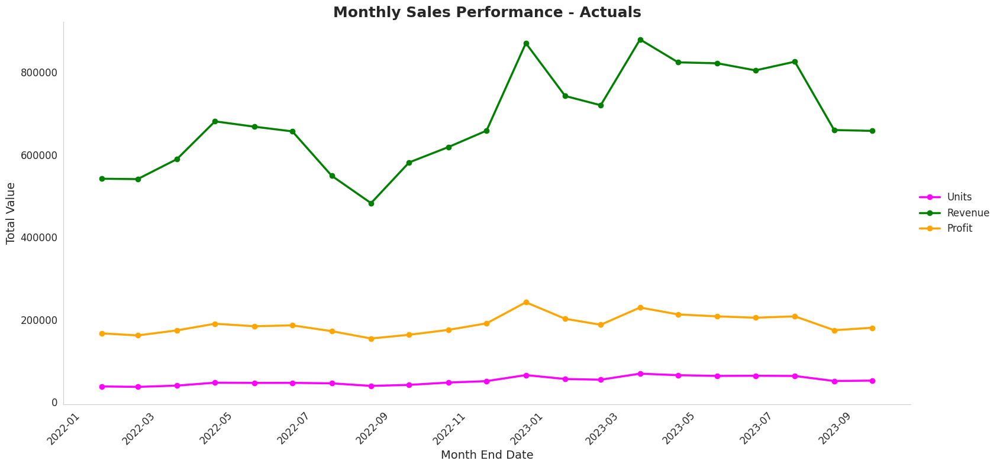

In [71]:
# Example1 : Plotting Monthly Units, Revenue, and Profit


plot_kpi_multiline_chart(
    df=monthly_agg_df,
    x_column='Month_End_Date',
    kpi_columns=['Units', 'Revenue', 'Profit'],
    title='Monthly Sales Performance - Actuals',
    y_label='Total Value',
    colors={'Units': 'magenta', 'Revenue': 'green', 'Profit': 'orange'}
)

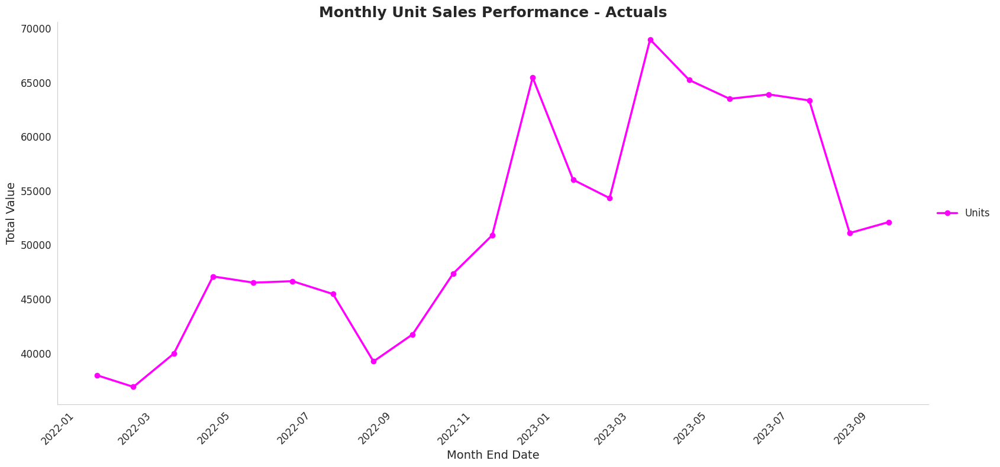

In [72]:
# Example 2: Plotting Monthly Units


plot_kpi_multiline_chart(
    df=monthly_agg_df,
    x_column='Month_End_Date',
    kpi_columns=['Units'],
    title='Monthly Unit Sales Performance - Actuals',
    y_label='Total Value',
    colors={'Units': 'magenta'}
)

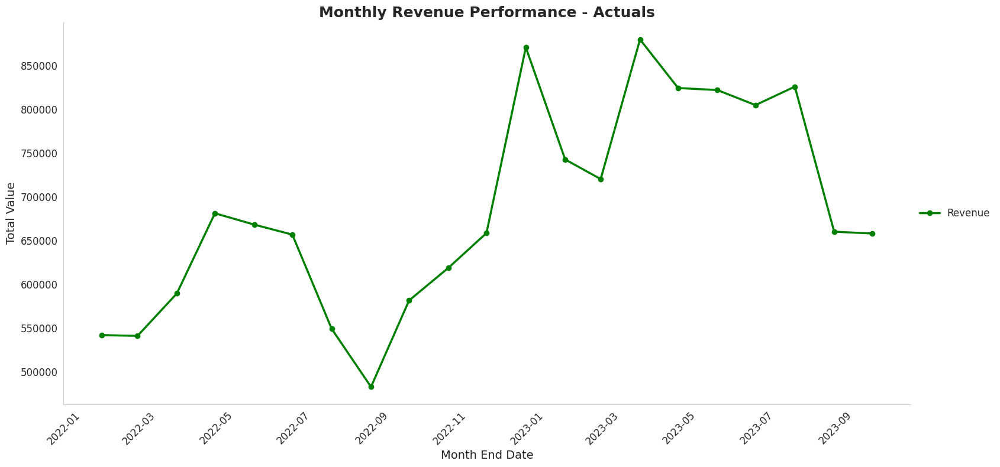

In [73]:
# Example 3: Plotting Monthly Revenue


plot_kpi_multiline_chart(
    df=monthly_agg_df,
    x_column='Month_End_Date',
    kpi_columns=['Revenue'],
    title='Monthly Revenue Performance - Actuals',
    y_label='Total Value',
    colors={'Revenue': 'green'}
)

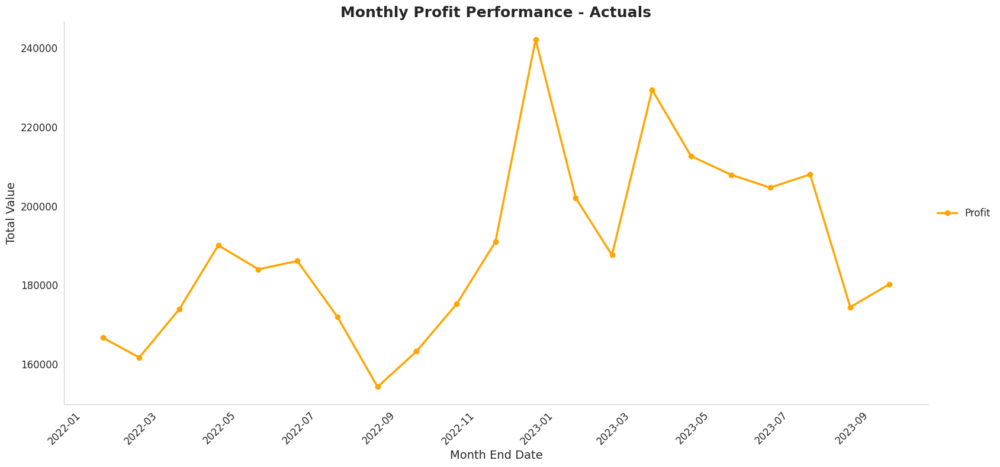

In [74]:
# Example 4: Plotting Monthly Profit


plot_kpi_multiline_chart(
    df=monthly_agg_df,
    x_column='Month_End_Date',
    kpi_columns=['Profit'],
    title='Monthly Profit Performance - Actuals',
    y_label='Total Value',
    colors={'Profit': 'orange'}
)

# Interpretation

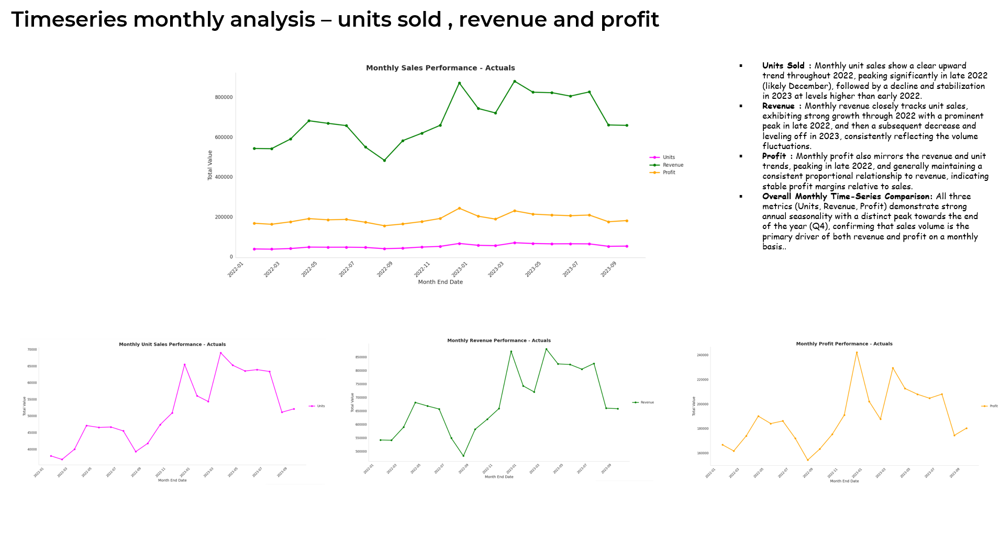

### I. Timeseries visualization of Quarterly aggregated KPI's
* Example 1: Plotting Quarterly Units, Revenue, and Profit
* Example2 : Plotting Quarterly Unit Sales
* Example3 : Plotting Quarterly Revenue
* Example4 : Plotting Quarterly Profit

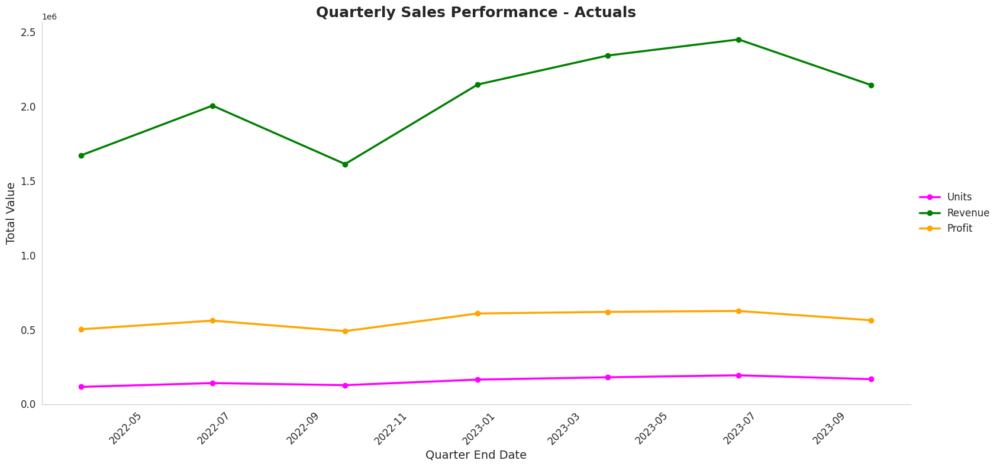

In [75]:
# Example 1: Plotting Quarterly Units, Revenue, and Profit


plot_kpi_multiline_chart(
    df=quarterly_agg_df,
    x_column='Quarter_End_Date',
    kpi_columns=['Units', 'Revenue', 'Profit'],
    title='Quarterly Sales Performance - Actuals',
    y_label='Total Value',
    colors={'Units': 'magenta', 'Revenue': 'green', 'Profit': 'orange'}
)

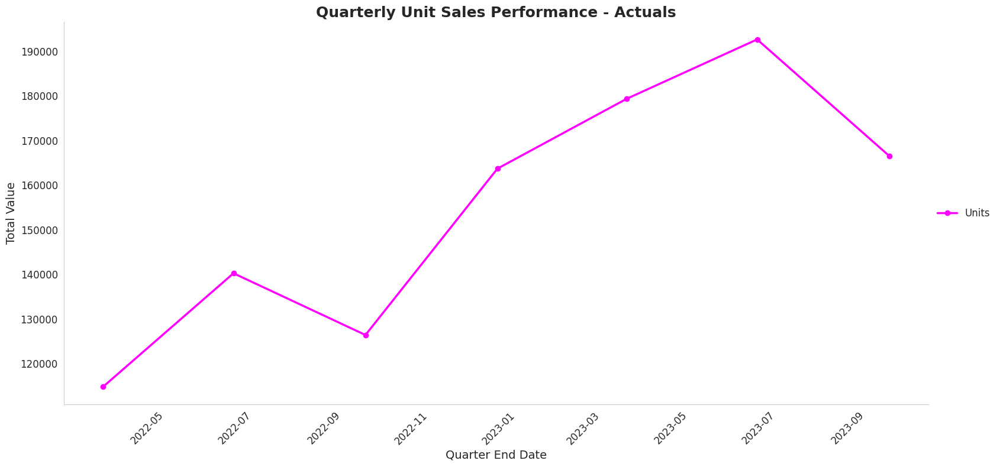

In [76]:
# Example 2: Plotting Quarterly Units


plot_kpi_multiline_chart(
    df=quarterly_agg_df,
    x_column='Quarter_End_Date',
    kpi_columns=['Units'],
    title='Quarterly Unit Sales Performance - Actuals',
    y_label='Total Value',
    colors={'Units': 'magenta'}
)

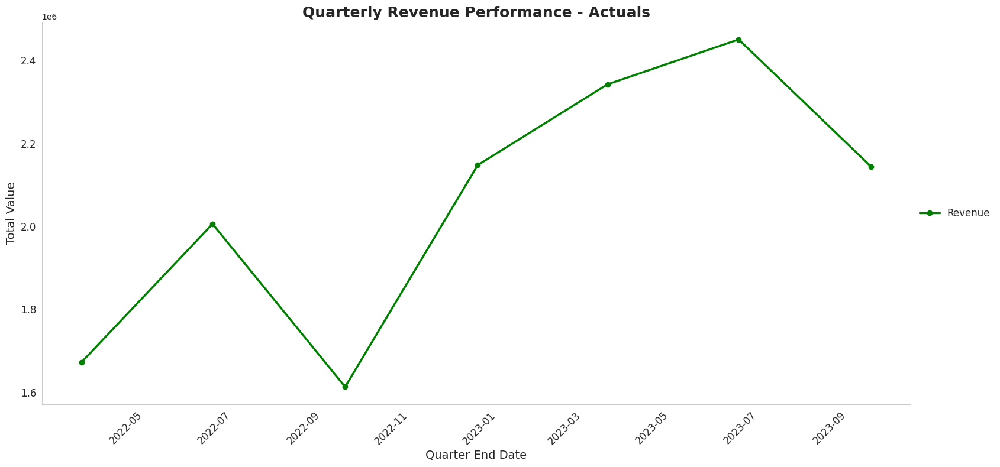

In [77]:
# Example 3: Plotting Quarterly Revenue


plot_kpi_multiline_chart(
    df=quarterly_agg_df,
    x_column='Quarter_End_Date',
    kpi_columns=['Revenue'],
    title='Quarterly Revenue Performance - Actuals',
    y_label='Total Value',
    colors={'Revenue': 'green'}
)

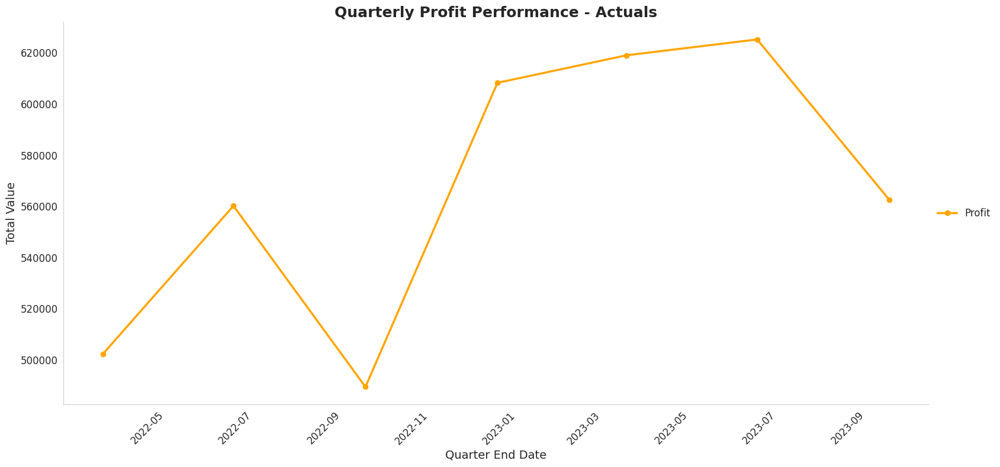

In [78]:
# Example 4: Plotting Quarterly Revenue


plot_kpi_multiline_chart(
    df=quarterly_agg_df,
    x_column='Quarter_End_Date',
    kpi_columns=['Profit'],
    title='Quarterly Profit Performance - Actuals',
    y_label='Total Value',
    colors={'Profit': 'orange'}
)

# Interpretation

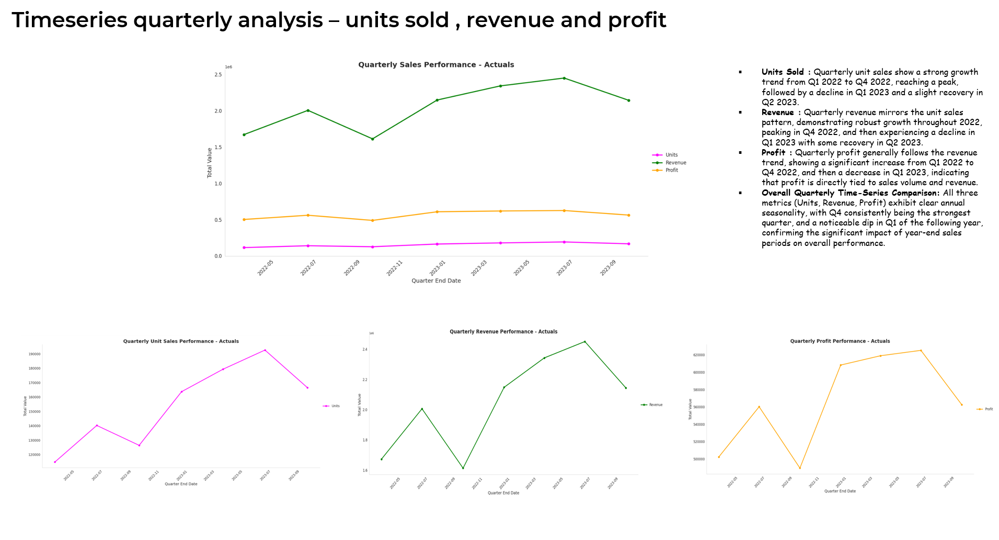

# 10. Exploratory Data Analysis - Timeseries Analysis - Growth of the KPI's

* Define the utility function to calculate the growth at different frequency ( wow , mom and qoq )
* Execute the growth function - Weekly growth of KPI's ( Units , Revenue and Profit )
* Execute the growth function - Monthly growth of KPI's ( Units , Revenue and Profit )
* Execute the growth function - Quarterly growth of KPI's ( Units , Revenue and Profit )
* Timeseries visualization of Quarterly growth KPI's
* Timeseries visualization of Monthly growth KPI's
* Timeseries visualization of Weekly growth KPI's

### A. Define the utility function to calculate the growth at different frequency ( wow , mom and qoq )

In [79]:
def calculate_period_over_period_growth(
    aggregated_df: pd.DataFrame,
    date_column: str,
    kpis: List[str],
    period_name: str # e.g., 'WoW', 'MoM', 'QoQ'
) -> pd.DataFrame:
    """
    Calculates period-over-period growth for specified KPIs in an already aggregated DataFrame.

    Args:
        aggregated_df (pd.DataFrame): The DataFrame already aggregated by week, month, or quarter.
                                      Must contain the date_column and all kpis.
        date_column (str): The name of the date column in the aggregated_df (e.g., 'Week_End_Date').
                           Must be in datetime format.
        kpis (List[str]): A list of KPI column names for which to calculate growth.
        period_name (str): A string indicating the period type (e.g., 'WoW', 'MoM', 'QoQ').
                           Used for naming the new growth columns.

    Returns:
        pd.DataFrame: A new DataFrame containing the date column, the original KPI values,
                      and the calculated growth percentages for each KPI.
                      Returns an empty DataFrame if inputs are invalid.
    """
    if not pd.api.types.is_datetime64_any_dtype(aggregated_df[date_column]):
        print(f"Error: '{date_column}' column in aggregated_df is not in datetime format. Please ensure it is.")
        return pd.DataFrame()

    for kpi in kpis:
        if kpi not in aggregated_df.columns:
            print(f"Error: KPI column '{kpi}' not found in the aggregated DataFrame.")
            return pd.DataFrame()

    # Create a copy to avoid modifying the original aggregated_df
    growth_df = aggregated_df.copy()

    # Sort by date column to ensure correct pct_change calculation
    growth_df = growth_df.sort_values(by=date_column).reset_index(drop=True)

    # Calculate growth for each KPI
    for kpi in kpis:
        growth_column_name = f'{kpi}_{period_name}_Growth_pct'
        growth_df[growth_column_name] = growth_df[kpi].pct_change() * 100

    # Drop rows where any of the new growth columns are NaN (typically the very first period)
    # This ensures that incomplete first periods don't show NaN growth.
    growth_columns_to_drop_na = [f'{kpi}_{period_name}_Growth_pct' for kpi in kpis]
    growth_df = growth_df.dropna(subset=growth_columns_to_drop_na).reset_index(drop=True)

    # Select and return relevant columns: date, original KPIs, and new growth KPIs
    output_columns = [date_column] + kpis + growth_columns_to_drop_na
    return growth_df[output_columns]

### B. Execute the growth function - Weekly growth of KPI's ( Units , Revenue and Profit )

In [80]:
# Define common KPIs

kpis_to_analyze = ['Units', 'Revenue', 'Profit']

In [81]:
# 2. Calculate WoW Growth

wow_growth_df = calculate_period_over_period_growth(
    aggregated_df=weekly_agg_df,
    date_column='Week_End_Date',
    kpis=kpis_to_analyze,
    period_name='WoW'
)
print(wow_growth_df)
print(f"Total rows: {len(wow_growth_df)}")

   Week_End_Date  Units    Revenue   Profit  Units_WoW_Growth_pct  \
0     2022-01-09   8827  128218.73  39223.0            205.326877   
1     2022-01-16   8089  112999.11  35413.0             -8.360711   
2     2022-01-23   8184  120047.16  35805.0              1.174434   
3     2022-01-30   9013  125938.87  38881.0             10.129521   
4     2022-02-06   9577  136330.23  40724.0              6.257628   
..           ...    ...        ...      ...                   ...   
86    2023-09-03  11958  157664.42  43081.0             10.323831   
87    2023-09-10  10645  136453.55  37936.0            -10.980097   
88    2023-09-17  11892  148422.08  41638.0             11.714420   
89    2023-09-24  11817  148564.83  40692.0             -0.630676   
90    2023-10-01  11375  140443.25  37605.0             -3.740374   

    Revenue_WoW_Growth_pct  Profit_WoW_Growth_pct  
0               214.053071             205.403722  
1               -11.870044              -9.713688  
2              

### C. Execute the growth function - Monthly growth of KPI's ( Units , Revenue and Profit )

In [82]:
# 2. Calculate MoM Growth


mom_growth_df = calculate_period_over_period_growth(
    aggregated_df=monthly_agg_df,
    date_column='Month_End_Date',
    kpis=kpis_to_analyze,
    period_name='MoM'
)
print(mom_growth_df)
print(f"Total rows: {len(mom_growth_df)}")

   Month_End_Date  Units    Revenue    Profit  Units_MoM_Growth_pct  \
0      2022-02-28  36894  540867.06  161709.0             -2.836375   
1      2022-03-31  39970  589375.30  173970.0              8.337399   
2      2022-04-30  47097  681033.03  190079.0             17.830873   
3      2022-05-31  46524  668055.76  184017.0             -1.216638   
4      2022-06-30  46659  656675.41  186120.0              0.290173   
5      2022-07-31  45469  548981.31  171996.0             -2.550419   
6      2022-08-31  39243  482599.57  154283.0            -13.692846   
7      2022-09-30  41747  581358.53  163254.0              6.380756   
8      2022-10-31  47351  618680.49  175216.0             13.423719   
9      2022-11-30  50902  658413.98  190939.0              7.499314   
10     2022-12-31  65472  870680.28  242133.0             28.623630   
11     2023-01-31  56032  742536.68  202037.0            -14.418377   
12     2023-02-28  54330  720125.70  187618.0             -3.037550   
13    

### D. Execute the growth function - Quarterly growth of KPI's ( Units , Revenue and Profit )

In [83]:
# 3. Calculate QoQ Growth

qoq_growth_df = calculate_period_over_period_growth(
    aggregated_df=quarterly_agg_df,
    date_column='Quarter_End_Date',
    kpis=kpis_to_analyze,
    period_name='QoQ'
)
print(qoq_growth_df) # Print all for quarterly as it's typically fewer rows
print(f"Total rows: {len(qoq_growth_df)}")

  Quarter_End_Date   Units     Revenue    Profit  Units_QoQ_Growth_pct  \
0       2022-06-30  140280  2005764.20  560216.0             22.157879   
1       2022-09-30  126459  1612939.41  489533.0             -9.852438   
2       2022-12-31  163725  2147774.75  608288.0             29.468840   
3       2023-03-31  179352  2342371.48  619034.0              9.544663   
4       2023-06-30  192657  2450700.43  625221.0              7.418373   
5       2023-09-30  166583  2143664.17  562658.0            -13.533897   

   Revenue_QoQ_Growth_pct  Profit_QoQ_Growth_pct  
0               19.958914              11.512623  
1              -19.584794             -12.617098  
2               33.159047              24.258834  
3                9.060388               1.766597  
4                4.624755               0.999460  
5              -12.528510             -10.006542  
Total rows: 6


### E. Timeseries visualization of Quarterly growth KPI's

* Example 1: Plotting Quarterly growth of  Units, Revenue, and Profit
* Example2 : Plotting Quarterly growth of Unit Sales
* Example3 : Plotting Quarterly growth of Revenue
* Example4 : Plotting Quarterly growth of Profit

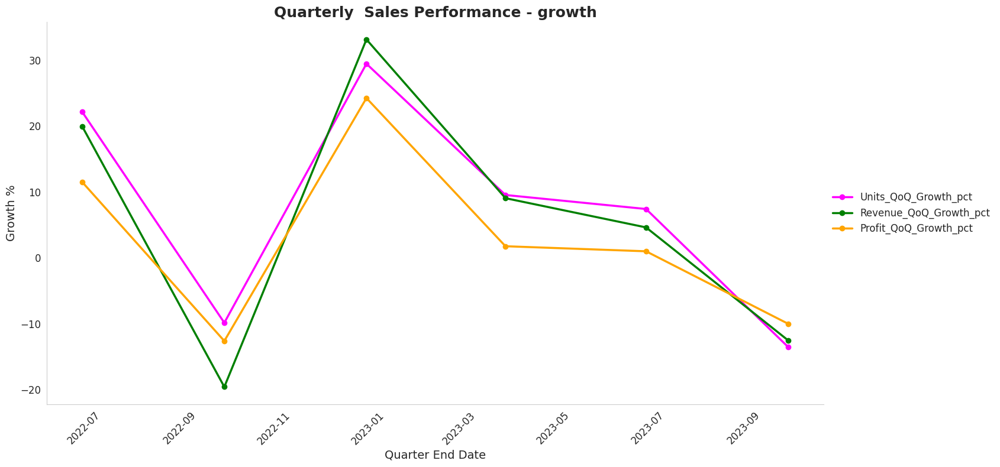

In [84]:
# Example 1: Plotting Quarterly Units, Revenue, and Profit growth


plot_kpi_multiline_chart(
    df=qoq_growth_df,
    x_column='Quarter_End_Date',
    kpi_columns=['Units_QoQ_Growth_pct' , 'Revenue_QoQ_Growth_pct' , 'Profit_QoQ_Growth_pct'],
    title='Quarterly  Sales Performance - growth',
    y_label='Growth %',
    colors={'Units_QoQ_Growth_pct': 'magenta' , 'Revenue_QoQ_Growth_pct': 'green' , 'Profit_QoQ_Growth_pct': 'orange'}
)

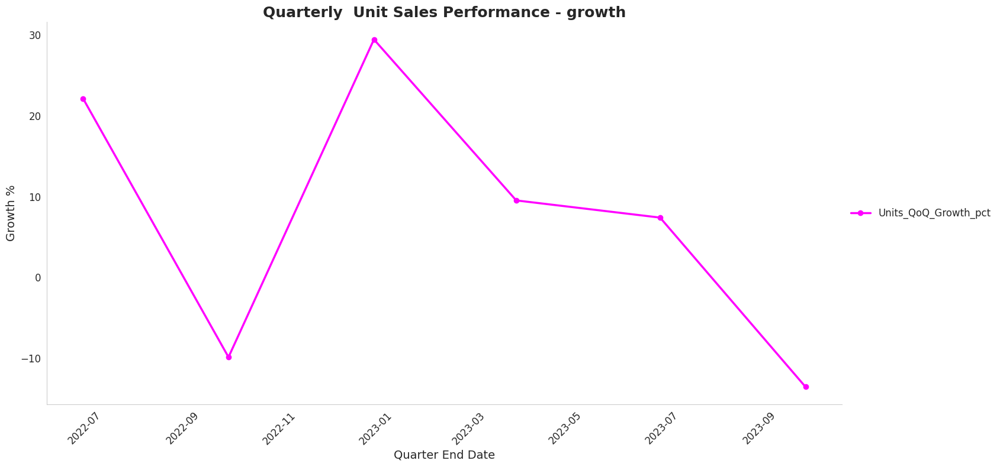

In [85]:
# Example 2: Plotting Quarterly Units growth


plot_kpi_multiline_chart(
    df=qoq_growth_df,
    x_column='Quarter_End_Date',
    kpi_columns=['Units_QoQ_Growth_pct'],
    title='Quarterly  Unit Sales Performance - growth',
    y_label='Growth %',
    colors={'Units_QoQ_Growth_pct': 'magenta' }
)

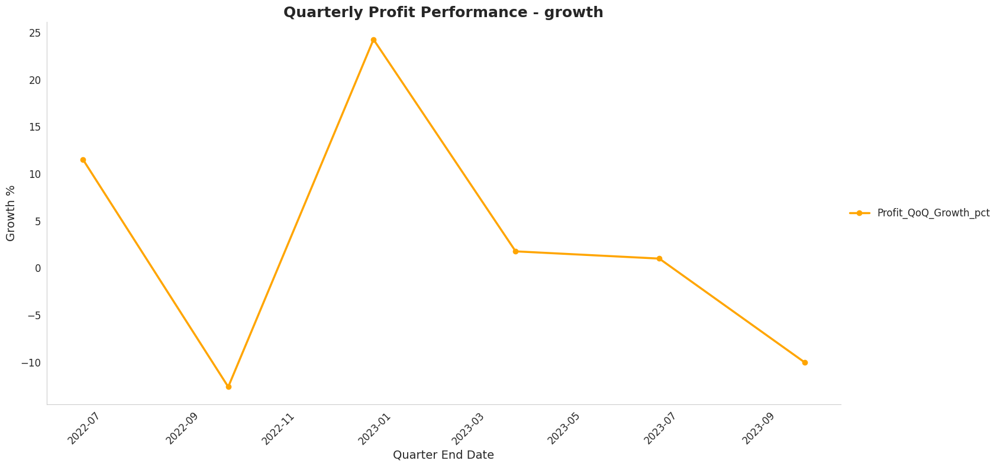

In [86]:
# Example 3: Plotting Quarterly Profit growth


plot_kpi_multiline_chart(
    df=qoq_growth_df,
    x_column='Quarter_End_Date',
    kpi_columns=['Profit_QoQ_Growth_pct'],
    title='Quarterly Profit Performance - growth',
    y_label='Growth %',
    colors={'Profit_QoQ_Growth_pct': 'orange'}
)

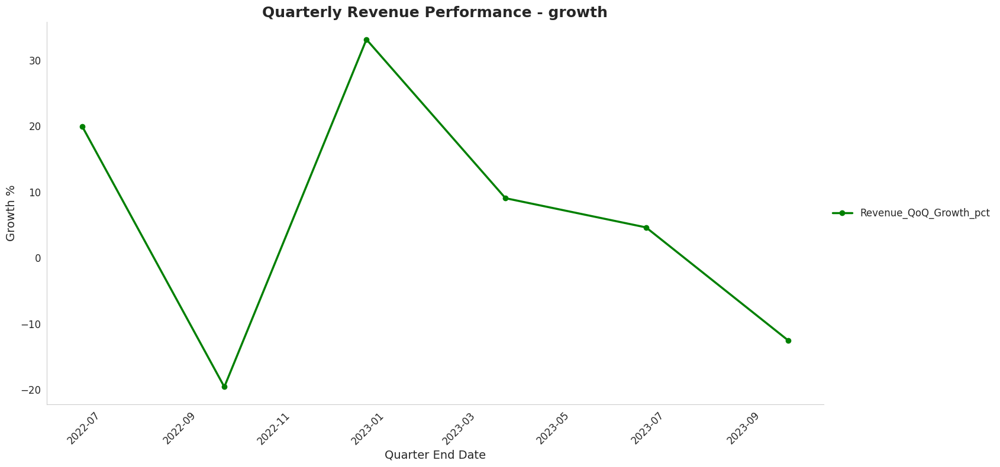

In [87]:
# Example 4: Plotting Quarterly Revenue growth


plot_kpi_multiline_chart(
    df=qoq_growth_df,
    x_column='Quarter_End_Date',
    kpi_columns=['Revenue_QoQ_Growth_pct'],
    title='Quarterly Revenue Performance - growth',
    y_label='Growth %',
    colors={'Revenue_QoQ_Growth_pct': 'green'}
)

# Interpretation

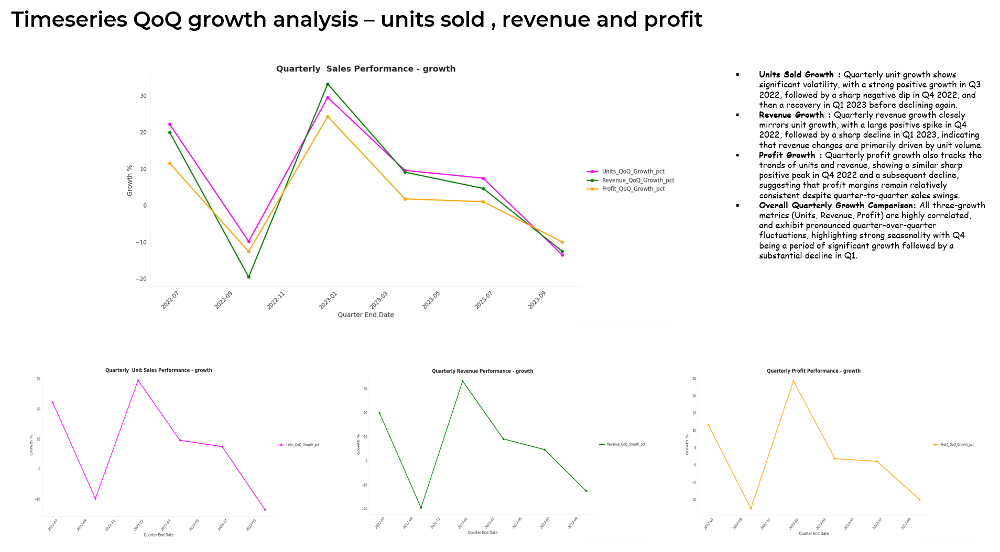

### F. Timeseries visualization of Monthly growth KPI's

* Example 1: Plotting Monthly growth of  Units, Revenue, and Profit
* Example2 : Plotting Monthly growth of Unit Sales
* Example3 : Plotting Monthly growth of Revenue
* Example4 : Plotting Monthly growth of Profit

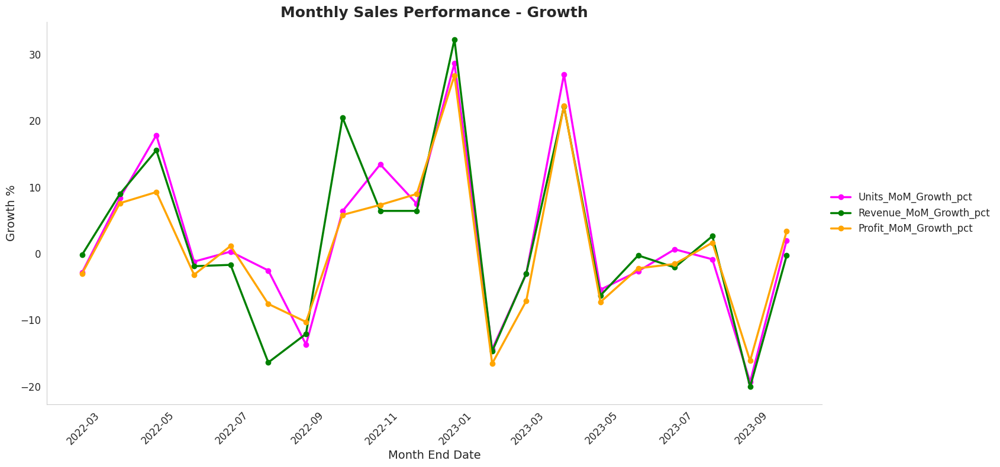

In [88]:
# Example 1: Plotting Monthly Units, Revenue, and Profit growth


plot_kpi_multiline_chart(
    df=mom_growth_df,
    x_column='Month_End_Date',
    kpi_columns=['Units_MoM_Growth_pct', 'Revenue_MoM_Growth_pct', 'Profit_MoM_Growth_pct'],
    title='Monthly Sales Performance - Growth',
    y_label='Growth %',
    colors={'Units_MoM_Growth_pct': 'magenta', 'Revenue_MoM_Growth_pct': 'green', 'Profit_MoM_Growth_pct': 'orange'}
)

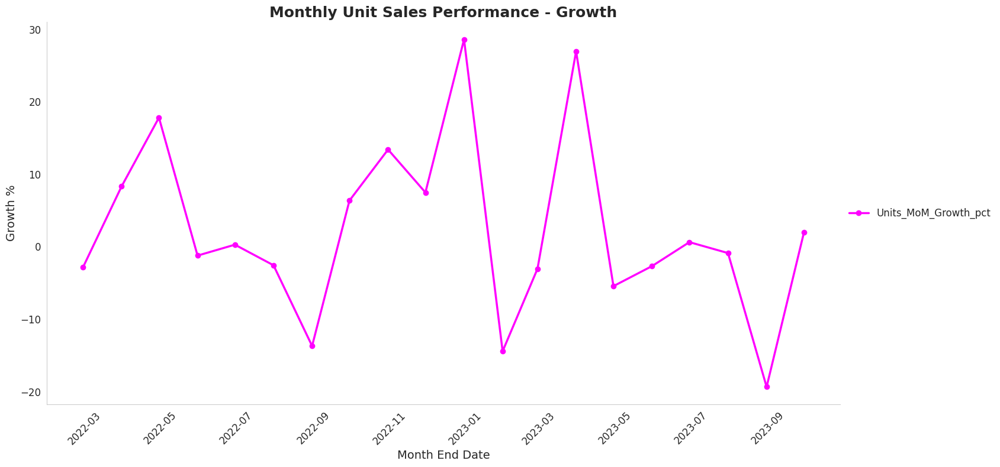

In [89]:
# Example 2: Plotting Monthly Units growth


plot_kpi_multiline_chart(
    df=mom_growth_df,
    x_column='Month_End_Date',
    kpi_columns=['Units_MoM_Growth_pct'],
    title='Monthly Unit Sales Performance - Growth',
    y_label='Growth %',
    colors={'Units_MoM_Growth_pct': 'magenta'}
)

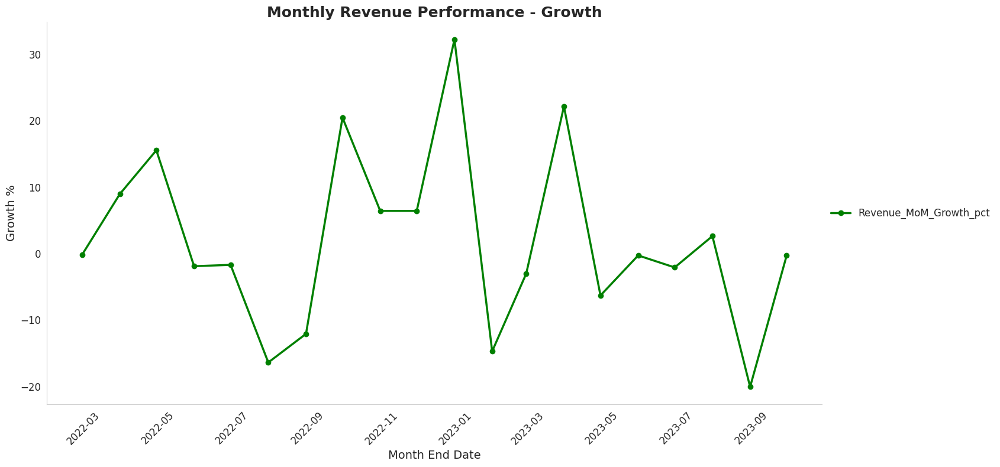

In [90]:
# Example 3: Plotting Monthly Revenue growth


plot_kpi_multiline_chart(
    df=mom_growth_df,
    x_column='Month_End_Date',
    kpi_columns=['Revenue_MoM_Growth_pct'],
    title='Monthly Revenue Performance - Growth',
    y_label='Growth %',
    colors={ 'Revenue_MoM_Growth_pct': 'green'}
)

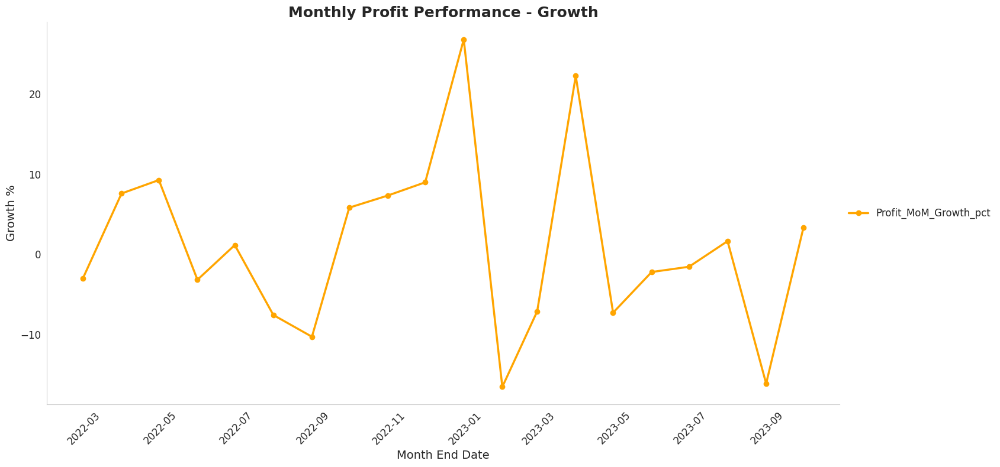

In [91]:
# Example 4: Plotting Monthly Profit growth


plot_kpi_multiline_chart(
    df=mom_growth_df,
    x_column='Month_End_Date',
    kpi_columns=['Profit_MoM_Growth_pct'],
    title='Monthly Profit Performance - Growth',
    y_label='Growth %',
    colors={'Profit_MoM_Growth_pct': 'orange'}
)

# Interpretation

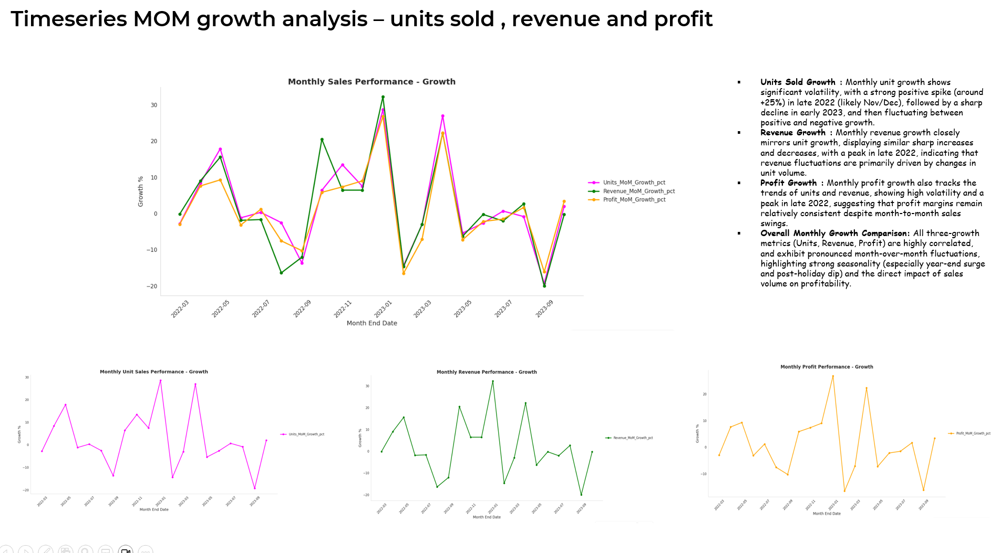

### G. Timeseries visualization of Weekly growth KPI's

* Example 1: Plotting Weekly growth of  Units, Revenue, and Profit
* Example2 : Plotting Weekly growth of Unit Sales
* Example3 : Plotting Weekly growth of Revenue
* Example4 : Plotting Weekly growth of Profit

In [ ]:
# Since the 1st week in 2022 ends on 2nd jan we are removing the 1st growth since its comparison between 2 days and 7 days

wow_growth_df_modified = wow_growth_df.iloc[1:].copy()

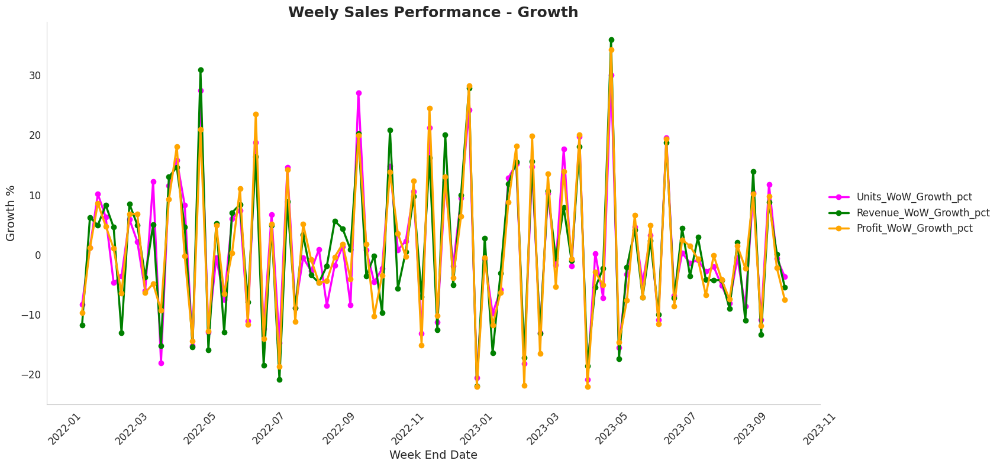

In [ ]:
# Example 1: Plotting Weekly Units, Revenue, and Profit growth


plot_kpi_multiline_chart(
    df=wow_growth_df_modified,
    x_column='Week_End_Date',
    kpi_columns=['Units_WoW_Growth_pct', 'Revenue_WoW_Growth_pct', 'Profit_WoW_Growth_pct'],
    title='Weely Sales Performance - Growth',
    y_label='Growth %',
    colors={'Units_WoW_Growth_pct': 'magenta', 'Revenue_WoW_Growth_pct': 'green', 'Profit_WoW_Growth_pct': 'orange'}
)

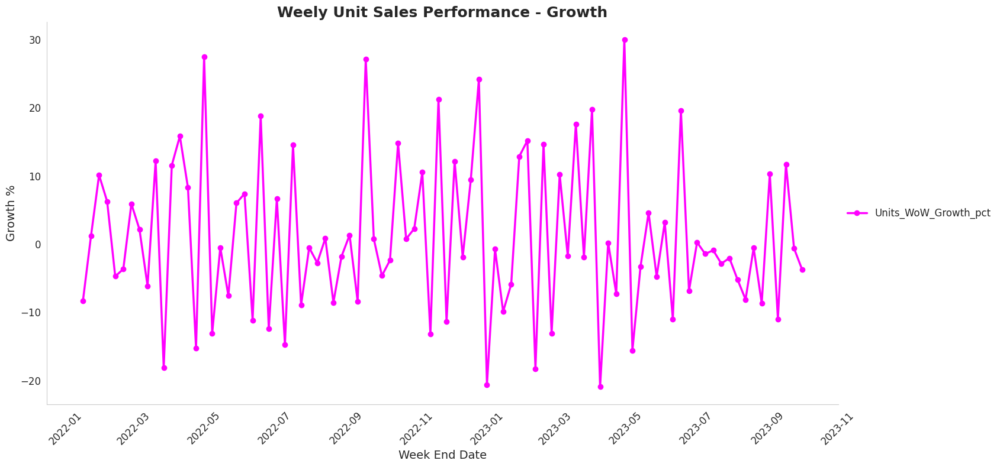

In [ ]:
# Example 2: Plotting Weekly Units growth


plot_kpi_multiline_chart(
    df=wow_growth_df_modified,
    x_column='Week_End_Date',
    kpi_columns=['Units_WoW_Growth_pct'],
    title='Weely Unit Sales Performance - Growth',
    y_label='Growth %',
    colors={'Units_WoW_Growth_pct': 'magenta'}
)

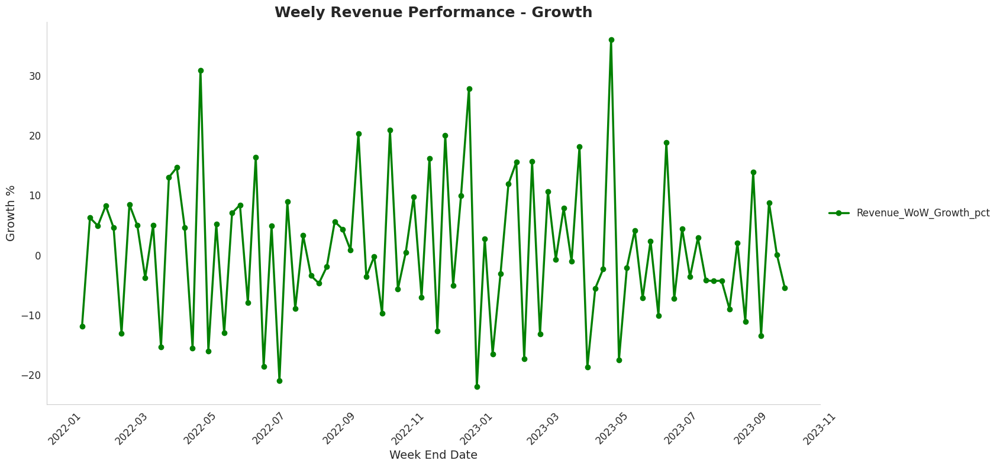

In [ ]:
# Example 3: Plotting Weekly Revenue growth


plot_kpi_multiline_chart(
    df=wow_growth_df_modified,
    x_column='Week_End_Date',
    kpi_columns=['Revenue_WoW_Growth_pct'],
    title='Weely Revenue Performance - Growth',
    y_label='Growth %',
    colors={'Revenue_WoW_Growth_pct': 'green'}
)

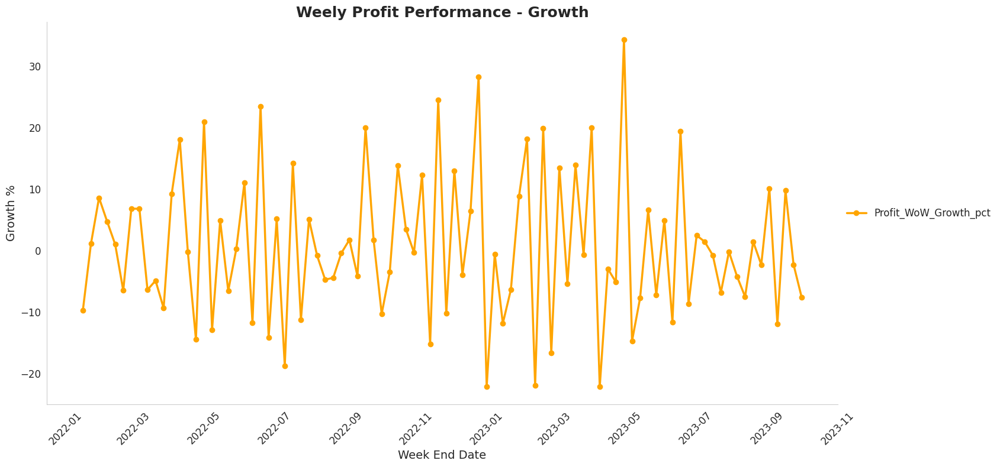

In [ ]:
# Example 4: Plotting Weekly Profit growth


plot_kpi_multiline_chart(
    df=wow_growth_df_modified,
    x_column='Week_End_Date',
    kpi_columns=['Profit_WoW_Growth_pct'],
    title='Weely Profit Performance - Growth',
    y_label='Growth %',
    colors={'Profit_WoW_Growth_pct': 'orange'}
)

# Interpretation

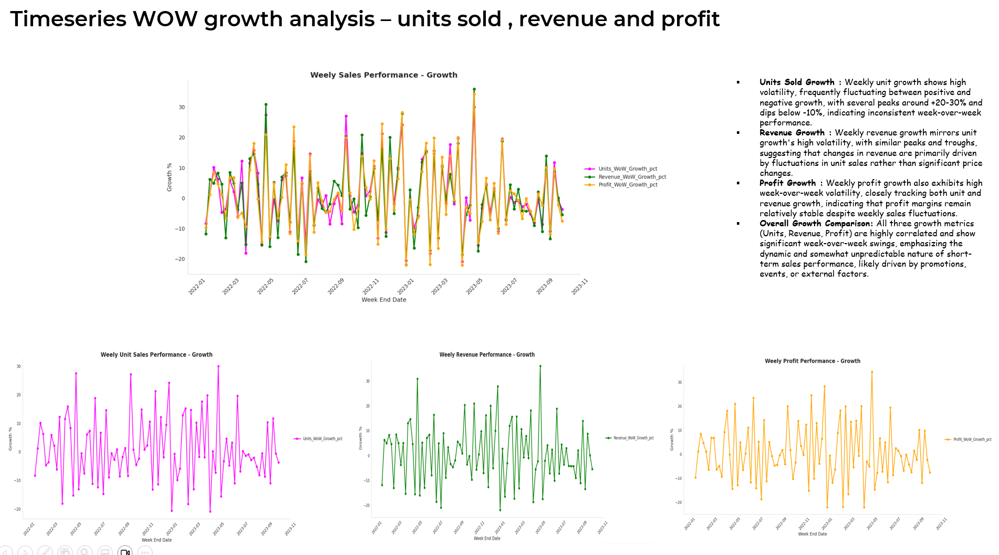

# 11. Bivariate analysis - Numerical Vs Categorical variable

* Top 10 and Bottom 10 Products based on sum of different KPI's ( Units , Revenue , Profit)
* Aggregated ordering of Product category on sum of different KPI's ( Units , Revenue , Profit )
* Top 10 and Bottom 10 Stores based on sum of different KPI's ( Units , Revenue , Profit)
* Top 10 and Bottom 10 City based on sum of different KPI's ( Units , Revenue , Profit)
* Aggregated ordering of Store Location on sum of different KPI's ( Units , Revenue , Profit )
* Utility function for Top N and Bottom N plotting post aggregation
* Data visualization for Top N and Bottom N Products based on aggregation of different KPI's ( Units , Revenue , Profit )
* Data Visualization for Top 10 and Bottom 10 Stores based on sum of different KPI's ( Units , Revenue , Profit)
* Data visualization for Top 10 and Bottom 10 City based on sum of different KPI's ( Units , Revenue , Profit)


In [92]:
# Product_Name , Product_Category , Store_Name , Store_City , Store_Location

### A. Top 10 and Bottom 10 Products based on sum of different KPI's ( Units , Revenue , Profit)

In [93]:
print((df.groupby('Product_Name').agg({'Units':'sum'}).sort_values(by='Units', ascending=False)).head(10))
print((df.groupby('Product_Name').agg({'Revenue':'sum'}).sort_values(by='Revenue', ascending=False)).head(10))
print((df.groupby('Product_Name').agg({'Profit':'sum'}).sort_values(by='Profit', ascending=False)).head(10))
print((df.groupby('Product_Name').agg({'Units':'sum'}).sort_values(by='Units', ascending=False)).tail(10))
print((df.groupby('Product_Name').agg({'Revenue':'sum'}).sort_values(by='Revenue', ascending=False)).tail(10))
print((df.groupby('Product_Name').agg({'Profit':'sum'}).sort_values(by='Profit', ascending=False)).tail(10))

                  Units
Product_Name           
Colorbuds        104368
PlayDoh Can      103128
Barrel O' Slime   91663
Deck Of Cards     84034
Magic Sand        60598
Splash Balls      60248
Lego Bricks       59737
Action Figure     57958
Rubik's Cube      45672
Animal Figures    39089
                   Revenue
Product_Name              
Lego Bricks     2388882.63
Colorbuds       1564476.32
Magic Sand       968962.02
Action Figure    926748.42
Rubik's Cube     912983.28
Deck Of Cards    587397.66
Splash Balls     541629.52
Nerf Gun         530594.57
Animal Figures   507766.11
Dart Gun         505092.12
                   Profit
Product_Name             
Colorbuds        834944.0
Action Figure    347748.0
Lego Bricks      298685.0
Deck Of Cards    252102.0
Glass Marbles    187590.0
Barrel O' Slime  183326.0
Kids Makeup Kit  146598.0
Nerf Gun         132715.0
Dart Gun         126352.0
Etch A Sketch    121680.0
                       Units
Product_Name                
Supersoaker Water 

### B. Aggregated ordering of Product category on sum of different KPI's ( Units , Revenue , Profit )

In [94]:
print(df.groupby('Product_Category').agg({'Units':'sum'}).sort_values(by='Units', ascending=False))
print(df.groupby('Product_Category').agg({'Revenue':'sum'}).sort_values(by='Revenue', ascending=False))
print(df.groupby('Product_Category').agg({'Profit':'sum'}).sort_values(by='Profit', ascending=False))

                    Units
Product_Category         
Art & Crafts       325574
Toys               267134
Games              188162
Sports & Outdoors  168946
Electronics        134075
                      Revenue
Product_Category             
Toys               5092081.66
Art & Crafts       2705364.26
Electronics        2246771.25
Sports & Outdoors  2169935.54
Games              2161104.38
                      Profit
Product_Category            
Toys               1078897.0
Electronics        1001437.0
Art & Crafts        753354.0
Games               629475.0
Sports & Outdoors   504166.0


### C. Top 10 and Bottom 10 Stores based on sum of different KPI's ( Units , Revenue , Profit)

In [95]:
print((df.groupby('Store_Name').agg({'Units':'sum'}).sort_values(by='Units', ascending=False).head(10)))
print((df.groupby('Store_Name').agg({'Revenue':'sum'}).sort_values(by='Revenue', ascending=False).head(10)))
print((df.groupby('Store_Name').agg({'Profit':'sum'}).sort_values(by='Profit', ascending=False).head(10)))
print((df.groupby('Store_Name').agg({'Units':'sum'}).sort_values(by='Units', ascending=False).tail(10)))
print((df.groupby('Store_Name').agg({'Revenue':'sum'}).sort_values(by='Revenue', ascending=False).tail(10)))
print((df.groupby('Store_Name').agg({'Profit':'sum'}).sort_values(by='Profit', ascending=False).tail(10)))

                               Units
Store_Name                          
Maven Toys Ciudad de Mexico 2  42086
Maven Toys Ciudad de Mexico 1  33479
Maven Toys Toluca 1            32066
Maven Toys Guadalajara 3       31299
Maven Toys Monterrey 2         28318
Maven Toys Ciudad de Mexico 3  26634
Maven Toys Xalapa 2            24869
Maven Toys Guanajuato 1        24722
Maven Toys Campeche 1          24556
Maven Toys Saltillo 1          24010
                                 Revenue
Store_Name                              
Maven Toys Ciudad de Mexico 2  547850.14
Maven Toys Guadalajara 3       446258.01
Maven Toys Ciudad de Mexico 1  433556.21
Maven Toys Toluca 1            405143.34
Maven Toys Monterrey 2         372998.82
Maven Toys Guadalajara 4       345729.38
Maven Toys Hermosillo 3        344846.64
Maven Toys Xalapa 2            340041.31
Maven Toys Ciudad de Mexico 3  337424.66
Maven Toys Saltillo 1          330408.90
                                 Profit
Store_Name              

### D. Top 10 and Bottom 10 City based on sum of different KPI's ( Units , Revenue , Profit)

In [96]:
print(df.groupby('Store_City').agg({'Units':'sum'}).sort_values(by='Units', ascending=False).head(10))
print(df.groupby('Store_City').agg({'Revenue':'sum'}).sort_values(by='Revenue', ascending=False).head(10))
print(df.groupby('Store_City').agg({'Profit':'sum'}).sort_values(by='Profit', ascending=False).head(10))
print(df.groupby('Store_City').agg({'Units':'sum'}).sort_values(by='Units', ascending=False).tail(10))
print(df.groupby('Store_City').agg({'Revenue':'sum'}).sort_values(by='Revenue', ascending=False).tail(10))
print(df.groupby('Store_City').agg({'Profit':'sum'}).sort_values(by='Profit', ascending=False).tail(10))

                   Units
Store_City              
Cuidad de Mexico  124684
Guadalajara        95568
Monterrey          93229
Hermosillo         66754
Guanajuato         64299
Puebla             60808
Toluca             47634
Mexicali           44156
Xalapa             43567
Saltillo           42903
                     Revenue
Store_City                  
Cuidad de Mexico  1640351.16
Guadalajara       1313248.32
Monterrey         1256741.71
Hermosillo         902769.46
Guanajuato         868876.01
Puebla             804583.92
Toluca             622496.66
Xalapa             603566.33
Mexicali           583588.44
Saltillo           579514.97
                    Profit
Store_City                
Cuidad de Mexico  459153.0
Guadalajara       362728.0
Monterrey         343209.0
Hermosillo        263174.0
Guanajuato        234921.0
Puebla            226985.0
Mexicali          173235.0
Saltillo          163248.0
Xalapa            159128.0
Toluca            155937.0
                Units
Store_

### E. Aggregated ordering of Store Location on sum of different KPI's ( Units , Revenue , Profit )

In [97]:
print(df.groupby('Store_Location').agg({'Units':'sum'}).sort_values(by='Units', ascending=False))
print(df.groupby('Store_Location').agg({'Revenue':'sum'}).sort_values(by='Revenue', ascending=False))
print(df.groupby('Store_Location').agg({'Profit':'sum'}).sort_values(by='Profit', ascending=False))

                 Units
Store_Location        
Downtown        624180
Commercial      239103
Residential     125147
Airport          95461
                   Revenue
Store_Location            
Downtown        8179717.20
Commercial      3262550.97
Residential     1653066.53
Airport         1279922.39
                   Profit
Store_Location           
Downtown        2221455.0
Commercial       916257.0
Residential      458435.0
Airport          371182.0


### F. Utility function for Top N and Bottom N plotting post aggregation

In [98]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from typing import Literal

def plot_aggregated_barplot(
    df: pd.DataFrame,
    aggregation_kpi: str,
    groupby_column: str,
    n: int = 10,
    top_or_bottom: Literal['top', 'bottom'] = 'top',
    agg_type: Literal['sum', 'mean', 'median', 'count', 'min', 'max'] = 'sum',
    title: str = None,
    x_label: str = None,
    y_label: str = None,
    palette: str = 'viridis', # or 'coolwarm', 'magma', 'plasma', 'cividis', 'rocket', 'mako'
    figsize: tuple = (14, 7)
):
    """
    Generates a bar plot for a specified aggregation KPI, grouped by a chosen column,
    showing top N or bottom N entries.

    Args:
        df (pd.DataFrame): The input DataFrame.
        aggregation_kpi (str): The name of the KPI column to aggregate (e.g., 'Units', 'Revenue', 'Profit').
        groupby_column (str): The name of the column to group by (e.g., 'Product_Name', 'Store_Name').
        n (int, optional): The number of top or bottom entries to display. Defaults to 10.
        top_or_bottom (Literal['top', 'bottom'], optional): Whether to show 'top' N or 'bottom' N.
                                                            Defaults to 'top'.
        agg_type (Literal['sum', 'mean', 'median', 'count', 'min', 'max'], optional):
                  The type of aggregation to perform. Defaults to 'sum'.
        title (str, optional): Custom title for the plot. If None, a default title is generated.
        x_label (str, optional): Custom label for the x-axis. If None, a default label is generated.
        y_label (str, optional): Custom label for the y-axis. If None, a default label is generated.
        palette (str, optional): Seaborn color palette to use. Defaults to 'viridis'.
        figsize (tuple, optional): Figure size (width, height) in inches. Defaults to (14, 7).
    """

    # --- Input Validation ---
    if aggregation_kpi not in df.columns:
        print(f"Error: Aggregation KPI column '{aggregation_kpi}' not found in DataFrame.")
        return
    if groupby_column not in df.columns:
        print(f"Error: Groupby column '{groupby_column}' not found in DataFrame.")
        return
    if top_or_bottom not in ['top', 'bottom']:
        print("Error: 'top_or_bottom' must be 'top' or 'bottom'.")
        return
    if agg_type not in ['sum', 'mean', 'median', 'count', 'min', 'max']:
        print(f"Error: Invalid 'agg_type'. Must be one of: 'sum', 'mean', 'median', 'count', 'min', 'max'.")
        return

    # --- Perform Aggregation ---
    try:
        aggregated_data = df.groupby(groupby_column)[aggregation_kpi].agg(agg_type)
    except Exception as e:
        print(f"Error during aggregation: {e}")
        print(f"Please ensure '{aggregation_kpi}' is a numeric column and '{agg_type}' is applicable.")
        return

    # --- Sort and Select Top/Bottom N ---
    if top_or_bottom == 'top':
        sorted_data = aggregated_data.sort_values(ascending=False).head(n)
    else: # 'bottom'
        sorted_data = aggregated_data.sort_values(ascending=False).tail(n) # head(n) after ascending sort gives bottom n

    # --- Plotting ---
    sns.set_style("whitegrid") # Apply a clean Seaborn style

    plt.figure(figsize=figsize)

    # Use seaborn.barplot directly with the Series
    # The index of the Series becomes the x-axis, and values become the y-axis
    sns.barplot(x=sorted_data.index, y=sorted_data.values, palette=palette, edgecolor='black')

    # --- Set Titles and Labels ---
    if title is None:
        title = f'{top_or_bottom.title()} {n} {groupby_column.replace("_", " ").title()} by {aggregation_kpi.replace("_", " ").title()}({agg_type.title()})'
    plt.title(title, fontsize=16, fontweight='bold')

    if x_label is None:
        x_label = groupby_column.replace("_", " ").title()
    plt.xlabel(x_label, fontsize=12)

    if y_label is None:
        y_label = f'{agg_type.title()} {aggregation_kpi.replace("_", " ").title()}'
    plt.ylabel(y_label, fontsize=12)

    # Rotate x-axis labels for readability if they are long
    plt.xticks(rotation=90, ha='right', fontsize=10) # 'ha' for horizontal alignment after rotation

    # Customize plot appearance
    plt.grid(False) # Turn off grid as requested in your example
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    plt.tick_params(axis='y', labelsize=10)

    plt.tight_layout() # Adjust layout to prevent labels from overlapping
    plt.show()

### G. Data visualization for Top N and Bottom N Products based on aggregation of different KPI's ( Units , Revenue , Profit )

* Example 1: Top 10 Products by Sum of Units Sold
* Example 2: Top 10 Products by count of Units Sold
* Example 3: Top 10 Products by average of Units Sold
* Example 4: Top 10 Products by max of Units Sold
* Example 5: Top 10 Products by Sum of Revenue
* Example 6: Top 10 Products by Sum of Profits
* Example 7: Bottom 10 products by Sum of Units Sold
* Example 8: Bottom 10 products by Sum of revenue
* Example 9: Bottom 10 products by Sum of profit

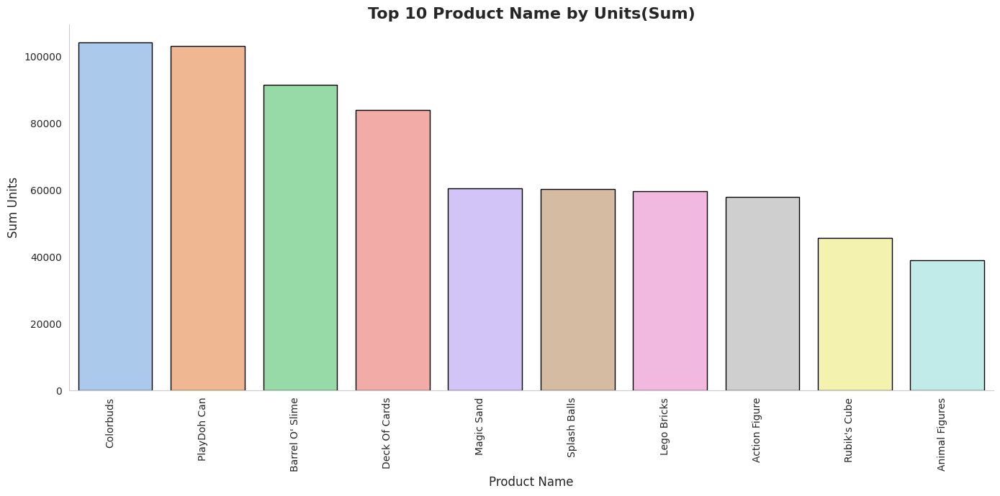

In [ ]:
# --- Example 1: Top 10 Products by Sum of Units Sold ---

plot_aggregated_barplot(
    df=df.copy(),
    aggregation_kpi='Units',
    groupby_column='Product_Name',
    n=10, # Showing top 5 for brevity in output
    top_or_bottom='top',
    agg_type='sum',
    palette='pastel'
)

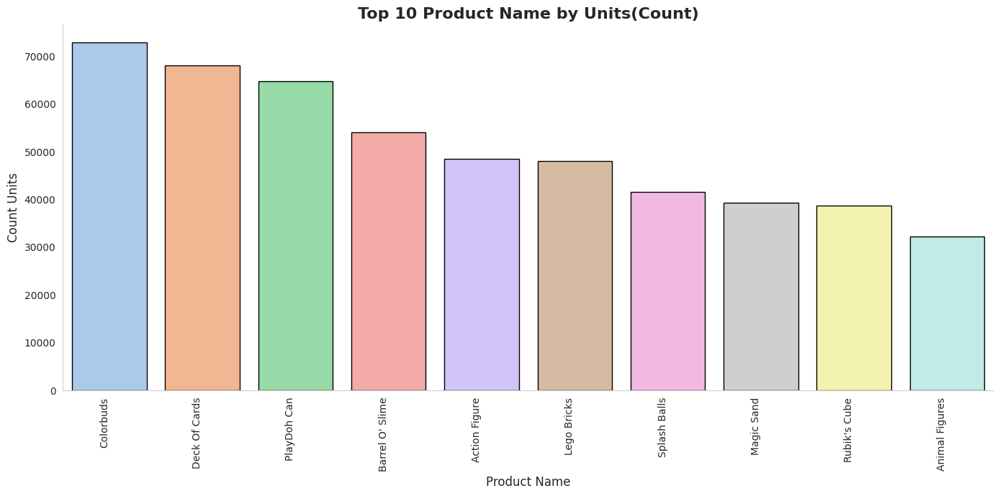

In [ ]:
# --- Example 2: Top 10 Products by count of Units Sold ---

plot_aggregated_barplot(
    df=df.copy(),
    aggregation_kpi='Units',
    groupby_column='Product_Name',
    n=10, # Showing top 5 for brevity in output
    top_or_bottom='top',
    agg_type='count',
    palette='pastel'
)

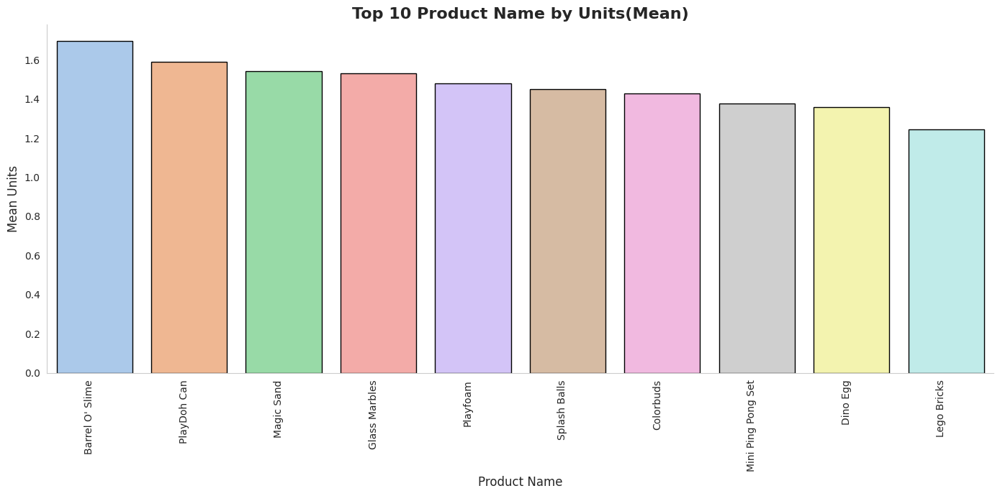

In [ ]:
# --- Example 3: Top 10 Products by average of Units Sold ---

plot_aggregated_barplot(
    df=df.copy(),
    aggregation_kpi='Units',
    groupby_column='Product_Name',
    n=10, # Showing top 5 for brevity in output
    top_or_bottom='top',
    agg_type='mean',
    palette='pastel'
)

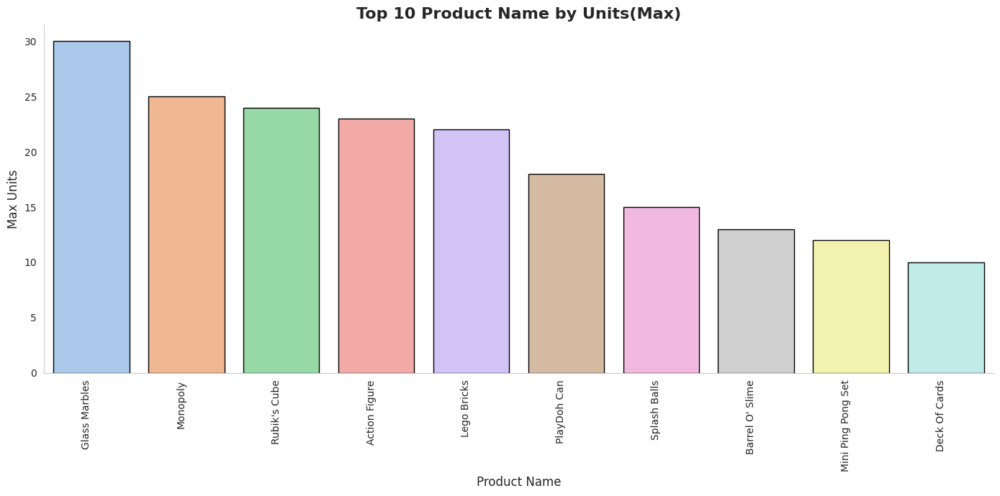

In [ ]:
# --- Example 4: Top 10 Products by max of Units Sold ---

plot_aggregated_barplot(
    df=df.copy(),
    aggregation_kpi='Units',
    groupby_column='Product_Name',
    n=10, # Showing top 5 for brevity in output
    top_or_bottom='top',
    agg_type='max',
    palette='pastel'
)

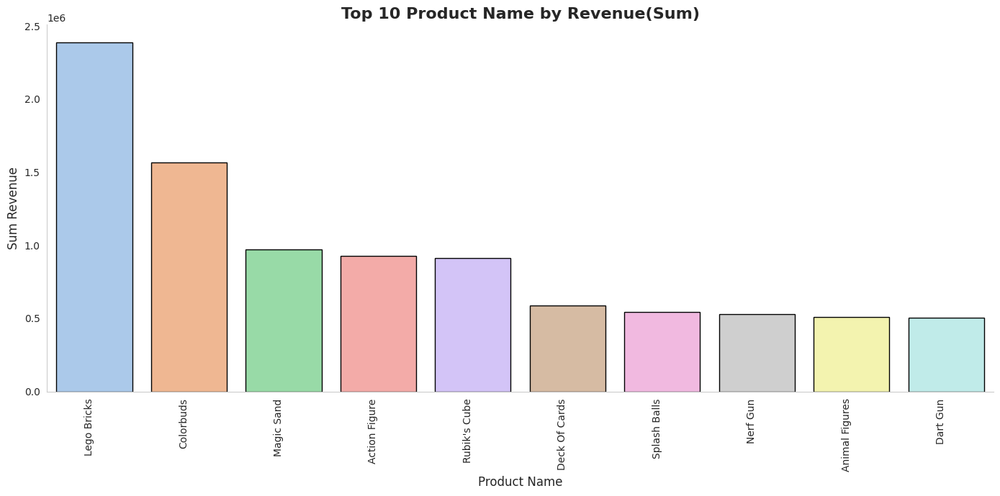

In [ ]:
# --- Example 5: Top 10 Products by Sum of Revenue ---

plot_aggregated_barplot(
    df=df.copy(),
    aggregation_kpi='Revenue',
    groupby_column='Product_Name',
    n=10, # Showing top 10 for brevity in output
    top_or_bottom='top',
    agg_type='sum',
    palette='pastel'
)

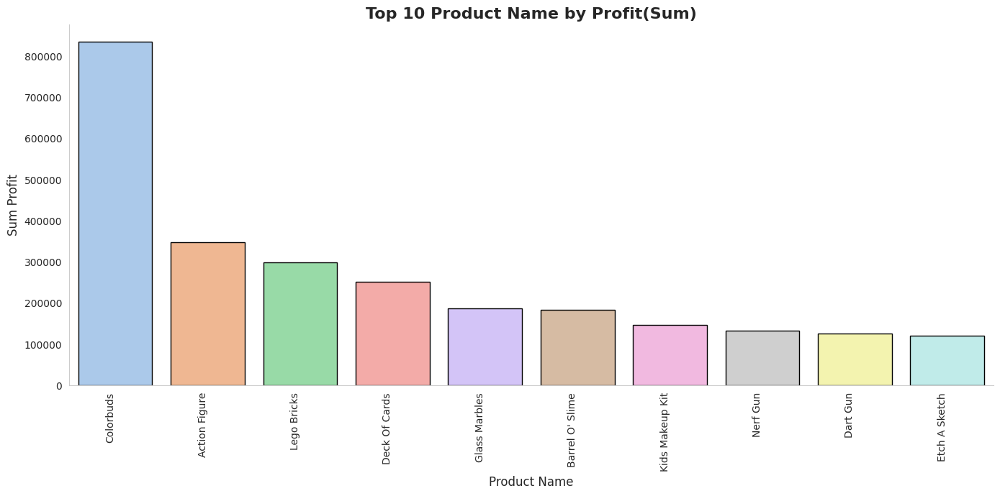

In [ ]:
# --- Example 6: Top 10 Products by Sum of Profits ---

plot_aggregated_barplot(
    df=df.copy(),
    aggregation_kpi='Profit',
    groupby_column='Product_Name',
    n=10, # Showing top 10 for brevity in output
    top_or_bottom='top',
    agg_type='sum',
    palette='pastel'
)

# Interpretation :

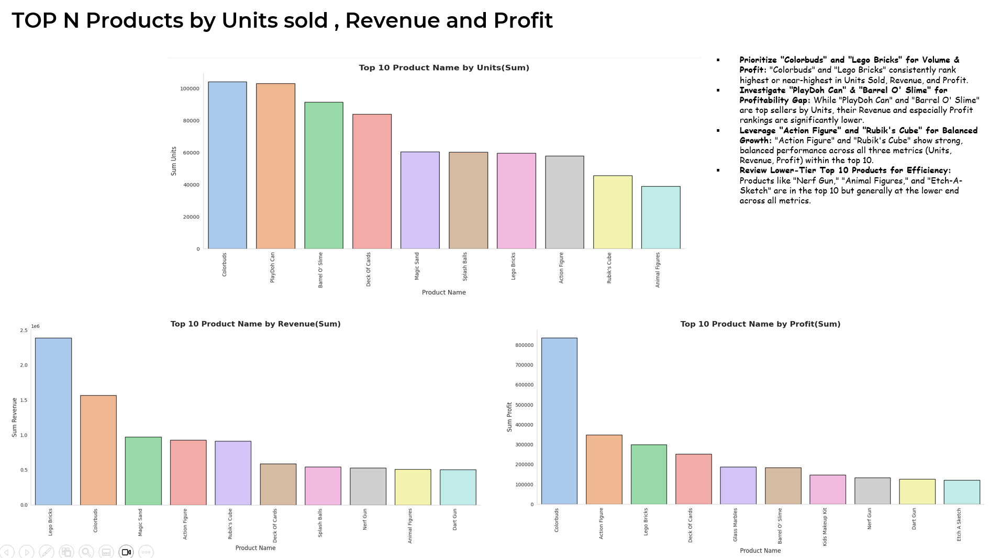

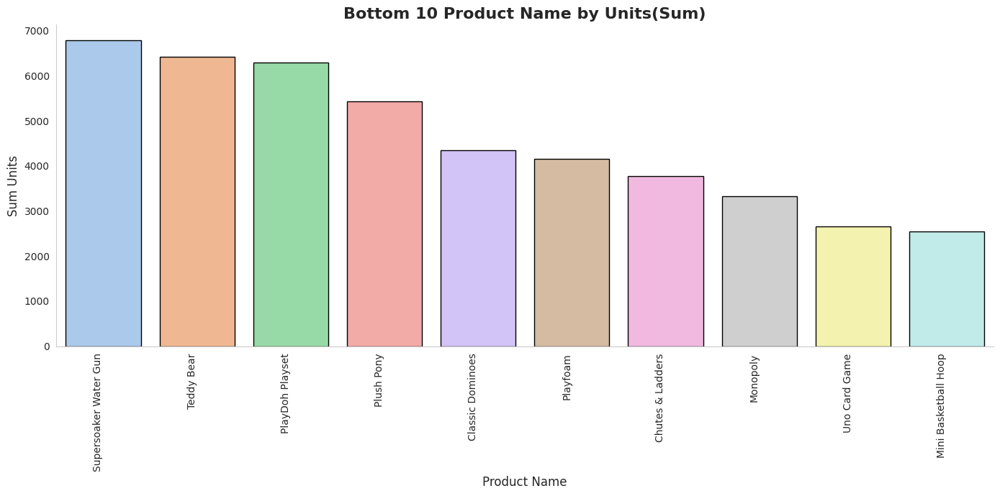

In [ ]:
# --- Example 7: Bottom 10 products by Sum of Units Sold ---

plot_aggregated_barplot(
    df=df.copy(),
    aggregation_kpi='Units',
    groupby_column='Product_Name',
    n=10, # Showing top 5 for brevity in output
    top_or_bottom='bottom',
    agg_type='sum',
    palette='pastel'
)

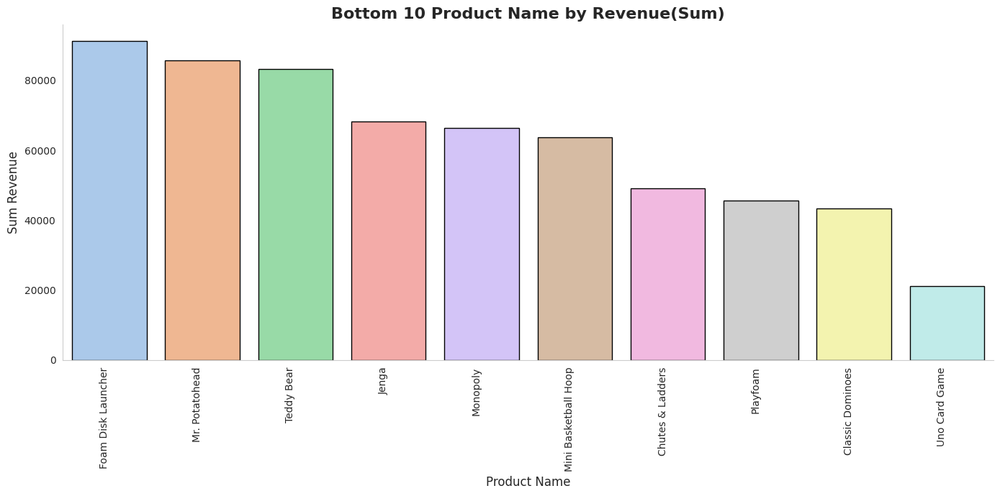

In [ ]:
# --- Example 8: Bottom 10 products by Sum of revenue  ---

plot_aggregated_barplot(
    df=df.copy(),
    aggregation_kpi='Revenue',
    groupby_column='Product_Name',
    n=10, # Showing top 5 for brevity in output
    top_or_bottom='bottom',
    agg_type='sum',
    palette='pastel'
)

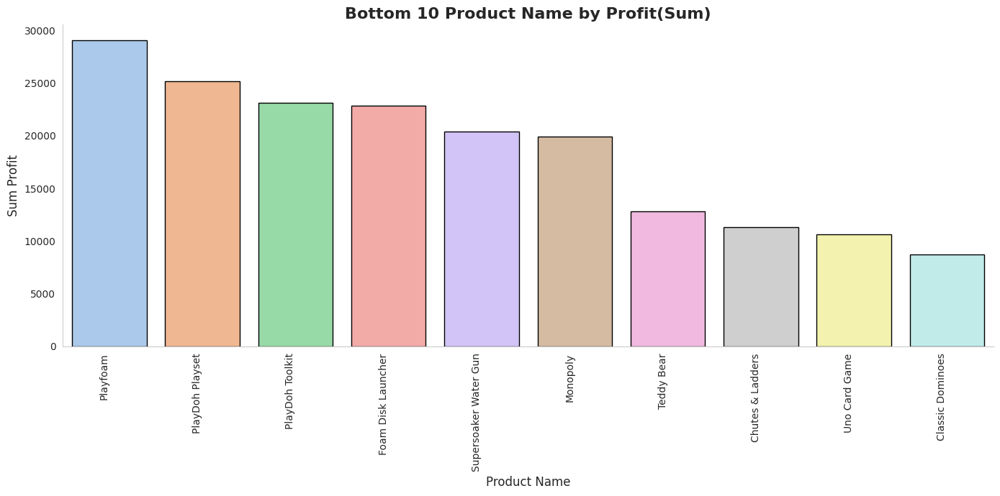

In [ ]:
# --- Example 9: Bottom 10 products by Sum of profit  ---

plot_aggregated_barplot(
    df=df.copy(),
    aggregation_kpi='Profit',
    groupby_column='Product_Name',
    n=10, # Showing top 5 for brevity in output
    top_or_bottom='bottom',
    agg_type='sum',
    palette='pastel'
)

# Interpretation

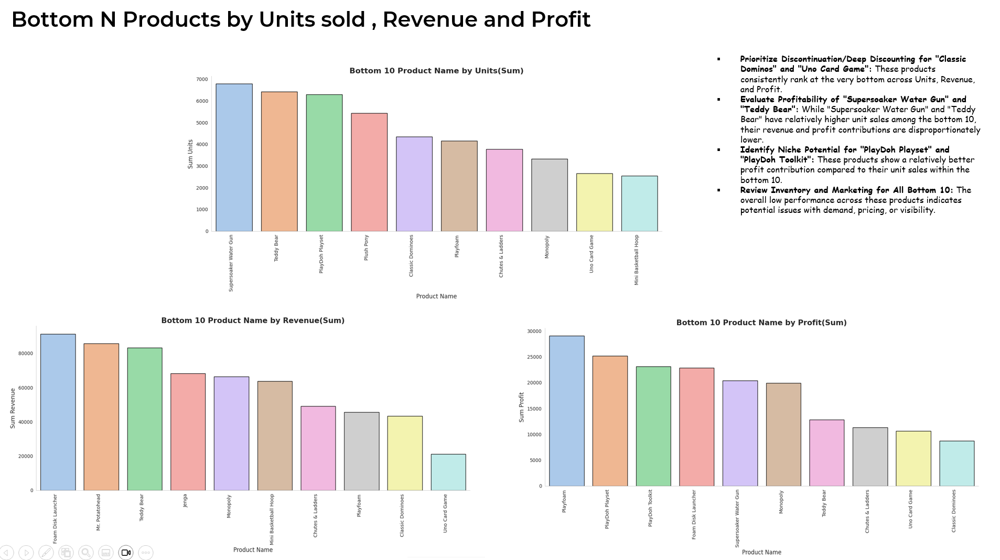

### H. Data Visualization for Top 10 and Bottom 10 Stores based on sum of different KPI's ( Units , Revenue , Profit)

* Example 1: Top 10 Stores by Sum of Units Sold
* Example 2: Top 10 Stores by Sum of Revenue
* Example 3: Top 10 Stores by Sum of Profit
* Example 4: Bottom 10 Stores by Sum of Units Sold
* Example 5: Bottom 10 Stores by Sum of Revenue
* Example 6: Bottom 10 Stores by Sum of Profit

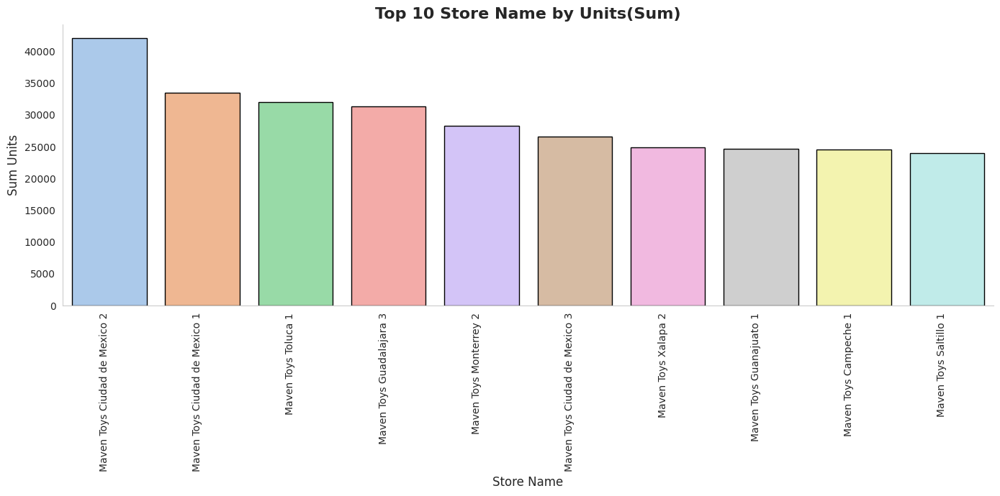

In [ ]:
# --- Example 1: Top 10 Stores by Sum of Units Sold ---

plot_aggregated_barplot(
    df=df.copy(),
    aggregation_kpi='Units',
    groupby_column='Store_Name',
    n=10, # Showing top 5 for brevity in output
    top_or_bottom='top',
    agg_type='sum',
    palette='pastel'
)

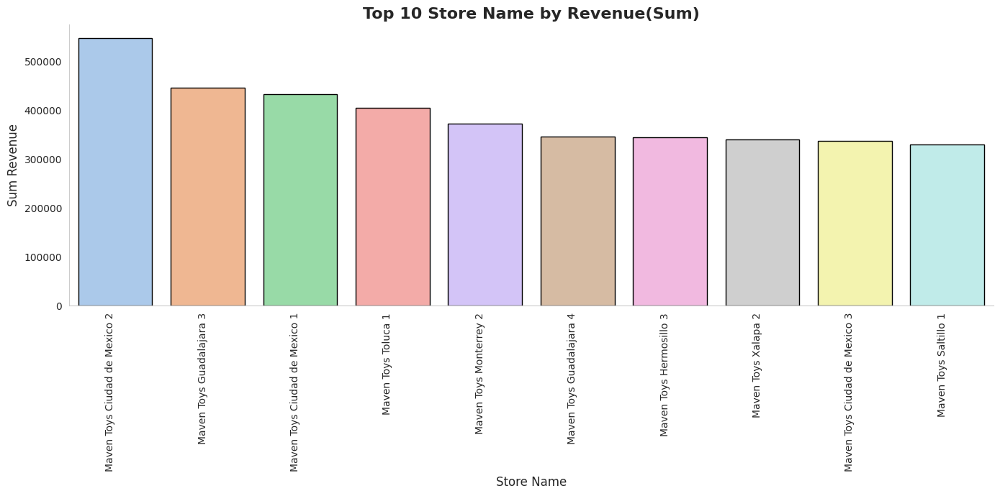

In [ ]:
# --- Example 2: Top 10 Stores by Sum of Revenue  ---

plot_aggregated_barplot(
    df=df.copy(),
    aggregation_kpi='Revenue',
    groupby_column='Store_Name',
    n=10, # Showing top 5 for brevity in output
    top_or_bottom='top',
    agg_type='sum',
    palette='pastel'
)

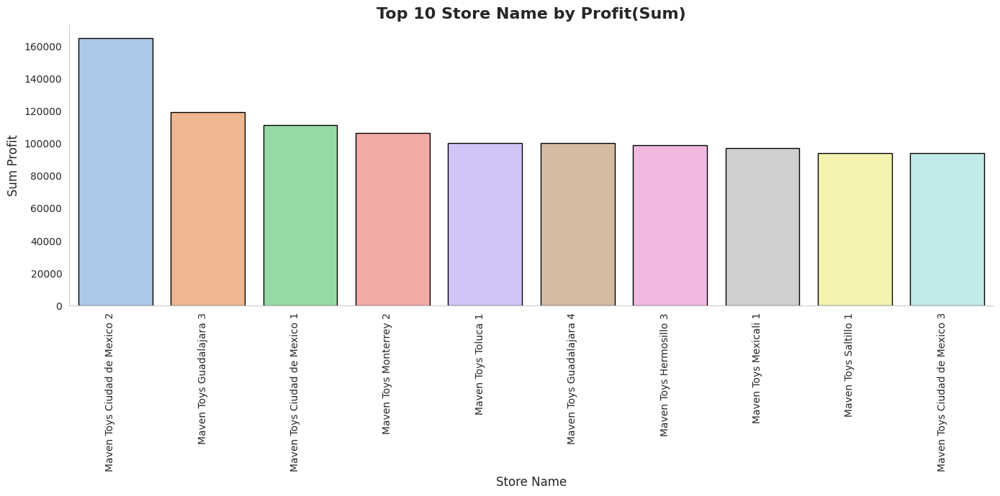

In [ ]:
# --- Example 3: Top 10 Stores by Sum of Profit  ---

plot_aggregated_barplot(
    df=df.copy(),
    aggregation_kpi='Profit',
    groupby_column='Store_Name',
    n=10, # Showing top 5 for brevity in output
    top_or_bottom='top',
    agg_type='sum',
    palette='pastel'
)

# Interpretation

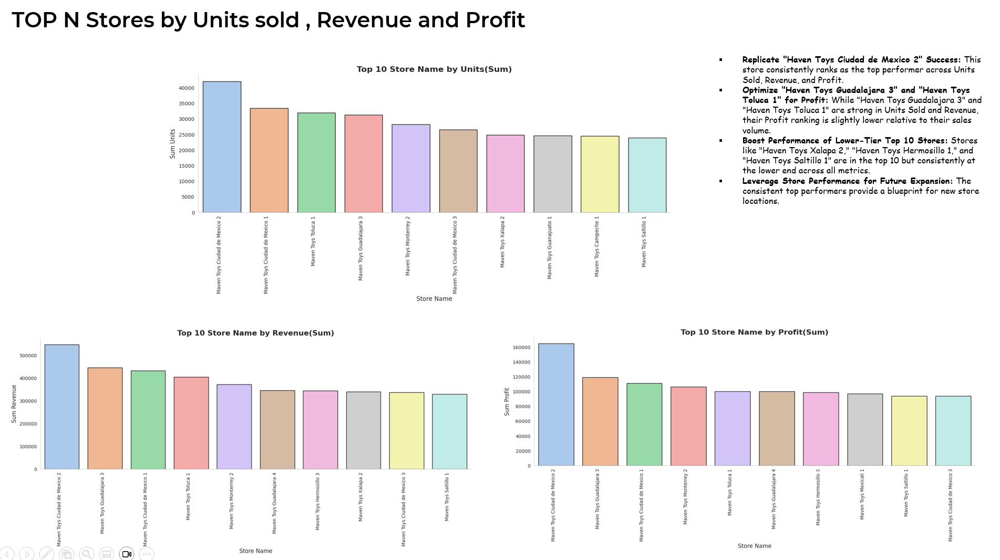

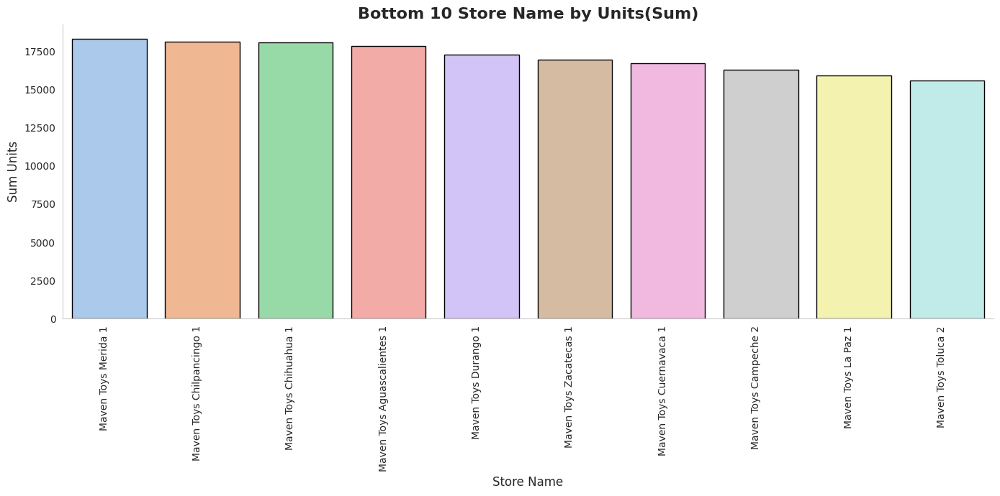

In [ ]:
# --- Example 4: Bottom 10 Stores by Sum of Units Sold ---

plot_aggregated_barplot(
    df=df.copy(),
    aggregation_kpi='Units',
    groupby_column='Store_Name',
    n=10, # Showing top 5 for brevity in output
    top_or_bottom='bottom',
    agg_type='sum',
    palette='pastel'
)

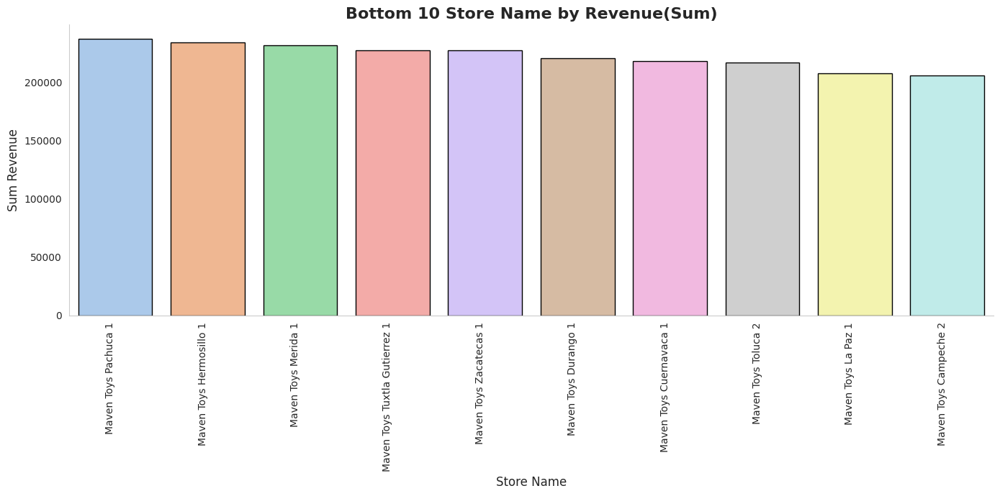

In [ ]:
# --- Example 5: Bottom 10 Stores by Sum of Revenue  ---

plot_aggregated_barplot(
    df=df.copy(),
    aggregation_kpi='Revenue',
    groupby_column='Store_Name',
    n=10, # Showing top 5 for brevity in output
    top_or_bottom='bottom',
    agg_type='sum',
    palette='pastel'
)

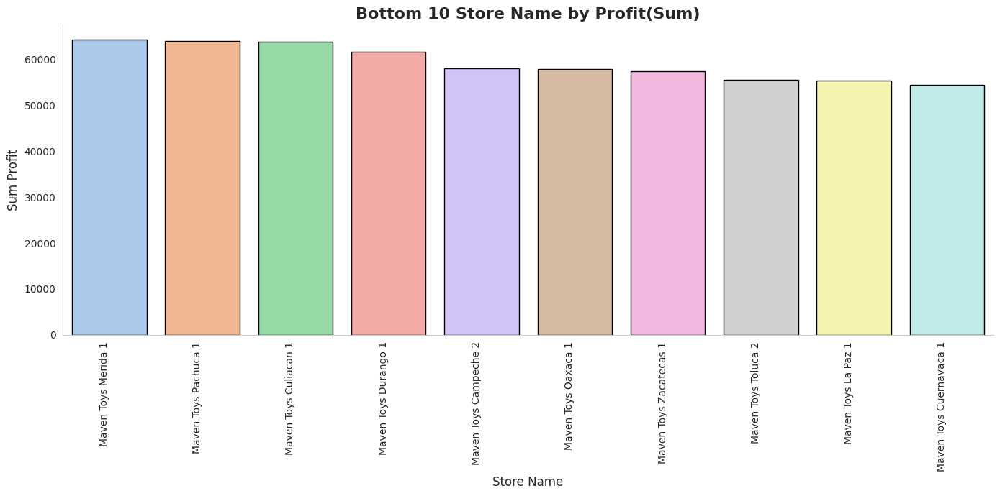

In [ ]:
# --- Example 6: Bottom 10 Stores by Sum of Profit ---

plot_aggregated_barplot(
    df=df.copy(),
    aggregation_kpi='Profit',
    groupby_column='Store_Name',
    n=10, # Showing top 5 for brevity in output
    top_or_bottom='bottom',
    agg_type='sum',
    palette='pastel'
)

# Interpretation

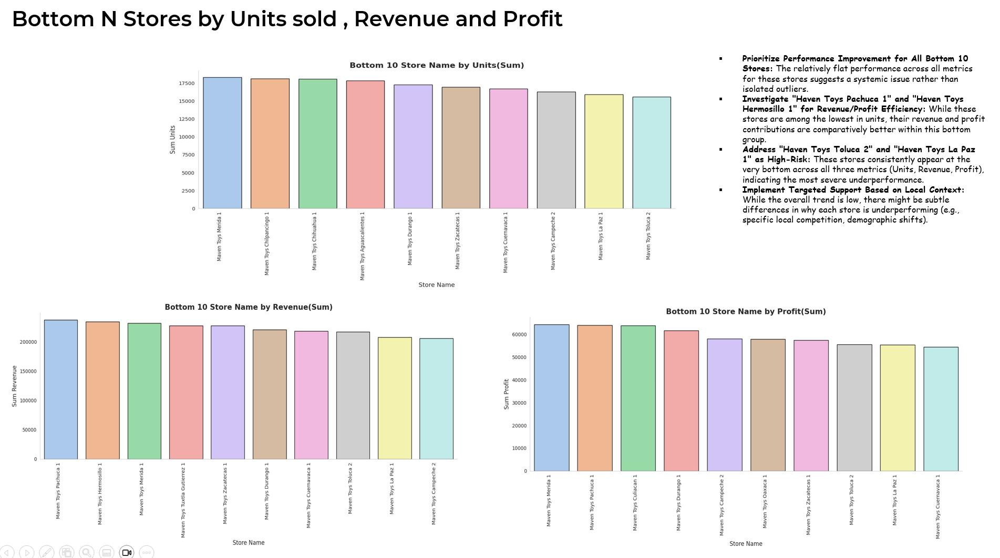

### I. Data visualization for Top 10 and Bottom 10 City based on sum of different KPI's ( Units , Revenue , Profit)

* Example 1: Top 10 City by Sum of Units Sold
* Example 2: Top 10 City by Sum of Revenue
* Example 3: Top 10 City by Sum of Profit
* Example 4: Bottom 10 City by Sum of Units Sold
* Example 5: Bottom 10 City by Sum of Revenue Sold
* Example 6: Bottom 10 City by Sum of Profit

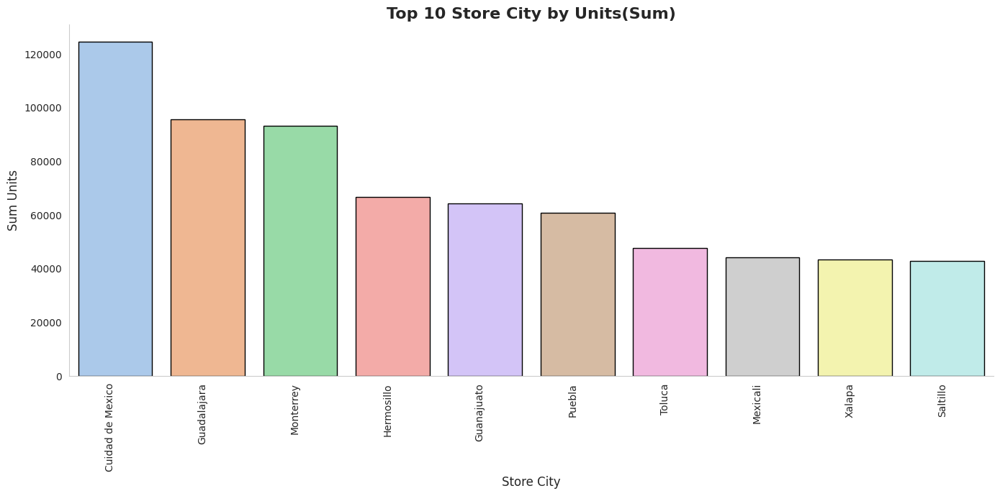

In [ ]:
# --- Example 1: Top 10 City by Sum of Units Sold ---

plot_aggregated_barplot(
    df=df.copy(),
    aggregation_kpi='Units',
    groupby_column='Store_City',
    n=10, # Showing top 5 for brevity in output
    top_or_bottom='top',
    agg_type='sum',
    palette='pastel'
)

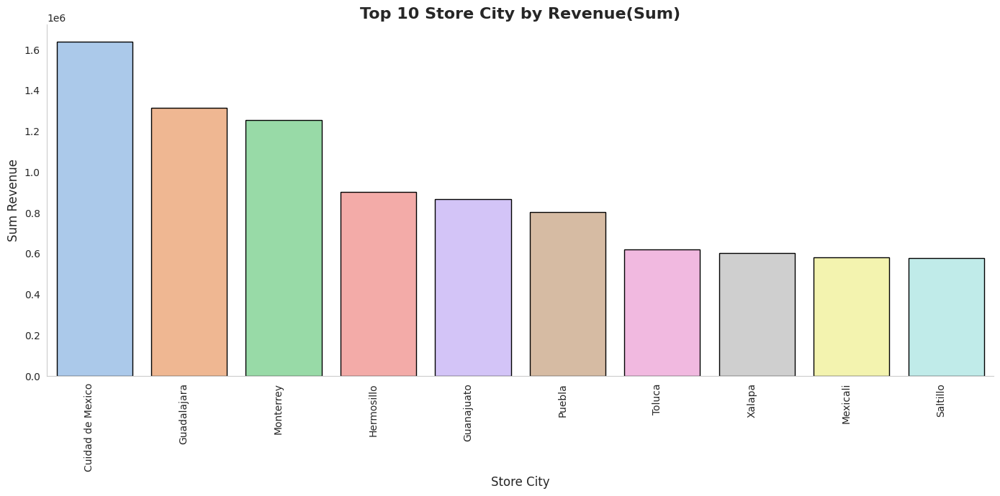

In [ ]:
# --- Example 2: Top 10 City by Sum of Revenue  ---

plot_aggregated_barplot(
    df=df.copy(),
    aggregation_kpi='Revenue',
    groupby_column='Store_City',
    n=10, # Showing top 5 for brevity in output
    top_or_bottom='top',
    agg_type='sum',
    palette='pastel'
)

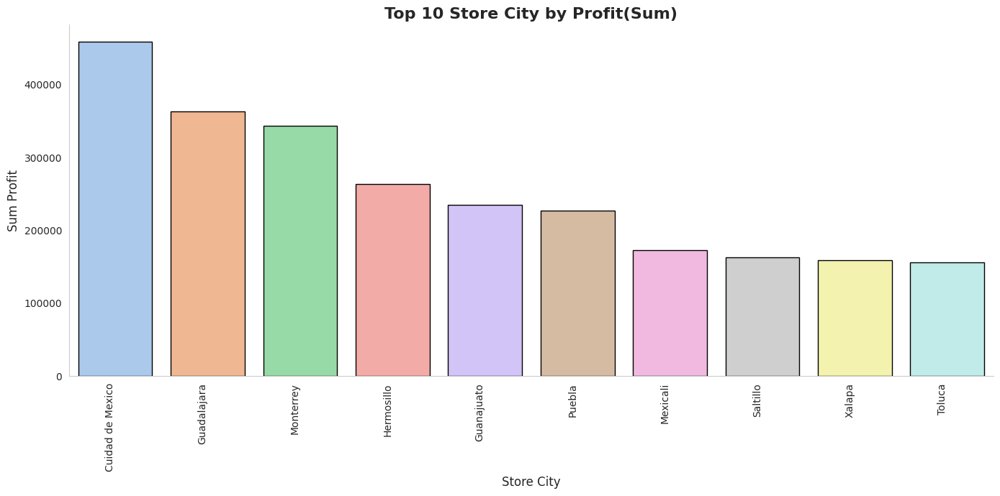

In [ ]:
# --- Example 3: Top 10 City by Sum of Profit ---

plot_aggregated_barplot(
    df=df.copy(),
    aggregation_kpi='Profit',
    groupby_column='Store_City',
    n=10, # Showing top 5 for brevity in output
    top_or_bottom='top',
    agg_type='sum',
    palette='pastel'
)

# Interpretation

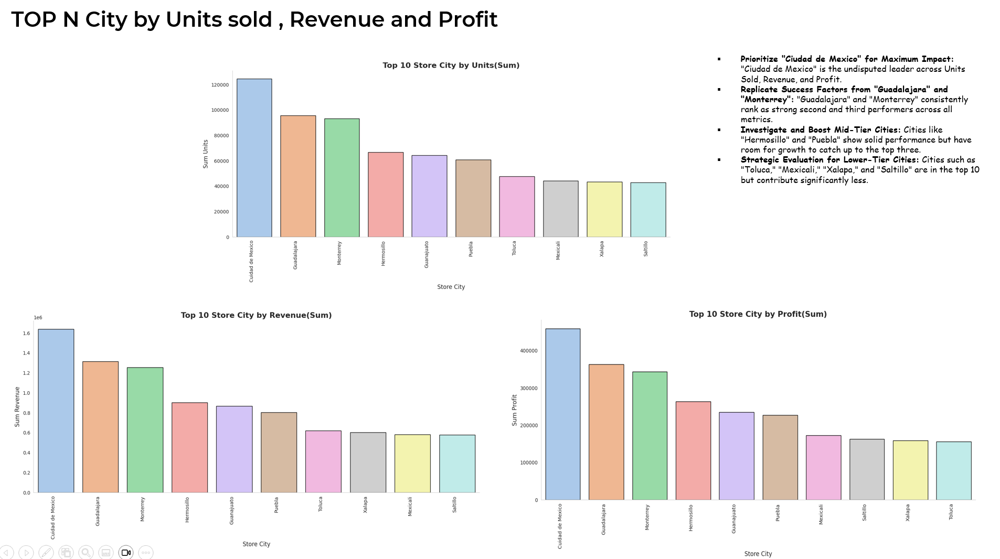

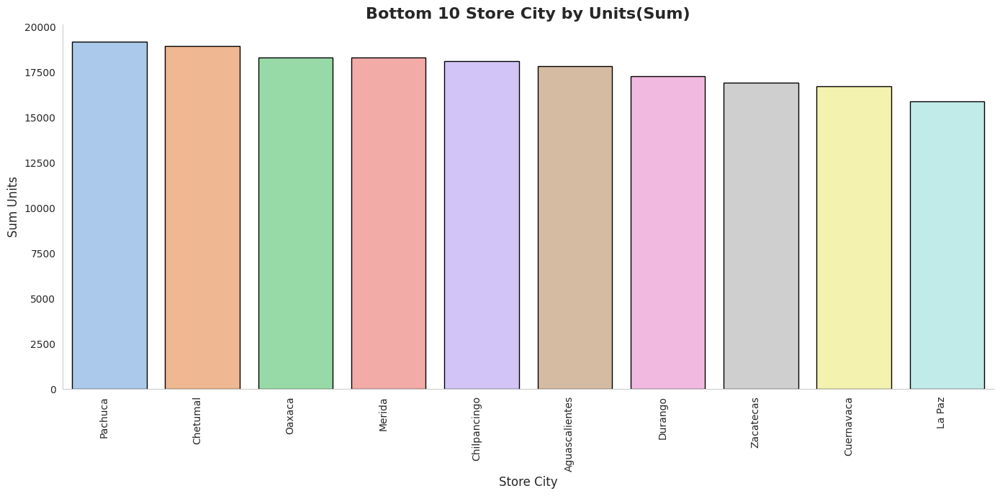

In [ ]:
# --- Example 4: Bottom 10 City by Sum of Units Sold ---

plot_aggregated_barplot(
    df=df.copy(),
    aggregation_kpi='Units',
    groupby_column='Store_City',
    n=10, # Showing top 5 for brevity in output
    top_or_bottom='bottom',
    agg_type='sum',
    palette='pastel'
)

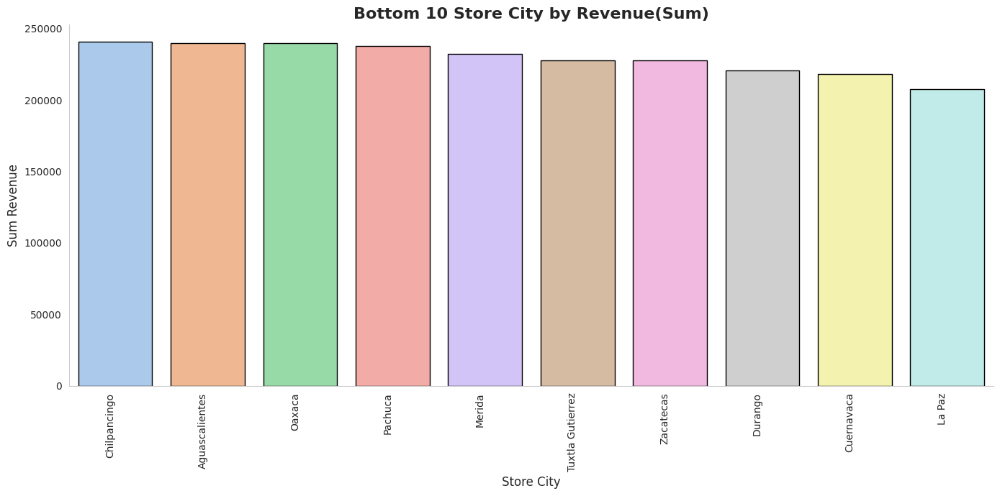

In [ ]:
# --- Example 5: Bottom 10 City by Sum of Revenue Sold ---

plot_aggregated_barplot(
    df=df.copy(),
    aggregation_kpi='Revenue',
    groupby_column='Store_City',
    n=10, # Showing top 5 for brevity in output
    top_or_bottom='bottom',
    agg_type='sum',
    palette='pastel'
)

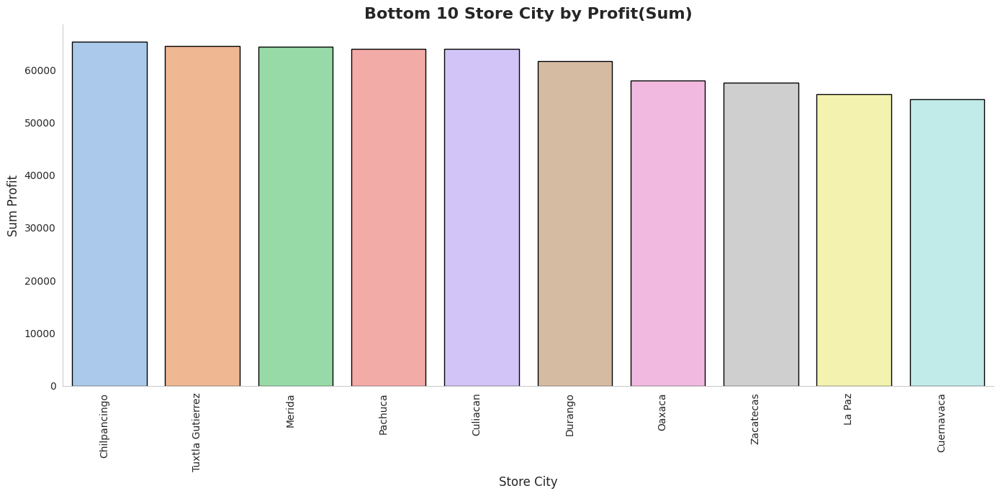

In [ ]:
# --- Example 6: Bottom 10 City by Sum of Profit ---

plot_aggregated_barplot(
    df=df.copy(),
    aggregation_kpi='Profit',
    groupby_column='Store_City',
    n=10, # Showing top 5 for brevity in output
    top_or_bottom='bottom',
    agg_type='sum',
    palette='pastel'
)

# Interpretation

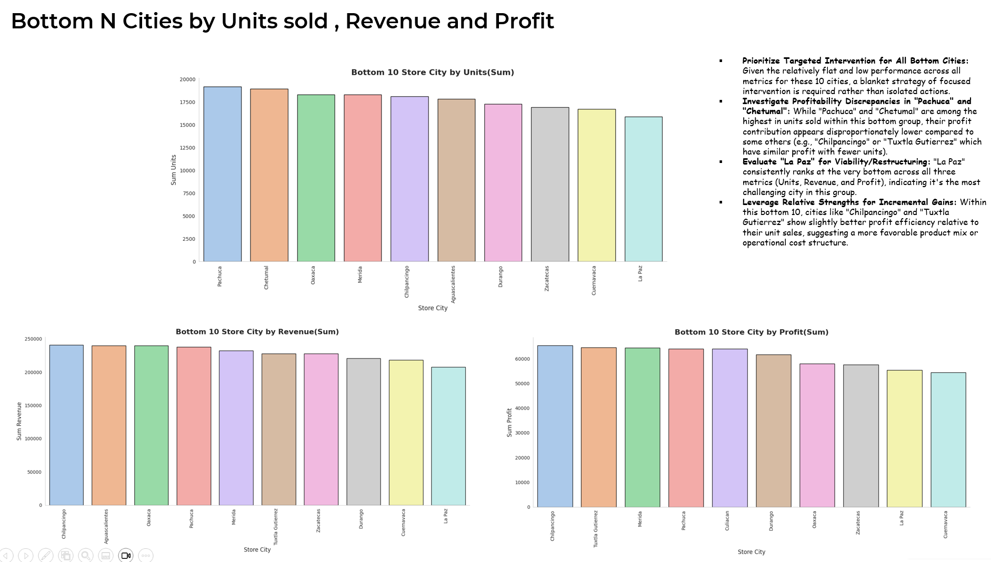

# 12. Multivariate analysis

* Utility function to create the composition stacked bar
* Top 10 store aggregated by KPI's ( Units , Revenue and Product ) analysis by product category composition
* Top 10 city aggregated by KPI's ( Units , Revenue and Product ) analysis by product category composition
* Top 10 products aggregated by KPI's ( Units , Revenue and Product ) analysis by store location composition

### A. Utility function to create the composition stacked bar

In [99]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from typing import List, Literal, Optional

def plot_categorical_composition_stacked_bar(
    df: pd.DataFrame,
    main_category_column: str,
    composition_column: str, # This replaces sub_category_column
    aggregation_kpi: str,     # NEW: KPI to aggregate (e.g., 'Units', 'Revenue', 'Profit')
    agg_type: Literal['sum', 'mean', 'median'] = 'sum', # NEW: Aggregation type for the KPI
    n: Optional[int] = 10,
    top_or_bottom: Literal['top', 'bottom'] = 'top',
    sort_by_total_kpi: bool = True, # NEW: Whether to sort main categories by their total KPI value
    title: str = None,
    x_label: str = 'Proportion (%)',
    y_label: str = None,
    legend_title: str = None,
    colormap: str = 'viridis',
    figsize: tuple = (18, 7)
):
    """
    Generates a 100% stacked bar chart showing the proportional distribution of a
    'composition_column' (e.g., Product_Category) within 'main_category_column' (e.g., Store_Name),
    based on the aggregation of a specified KPI (e.g., Units, Revenue, Profit).

    Args:
        df (pd.DataFrame): The input DataFrame.
        main_category_column (str): The column that will form the main bars (e.g., 'Store_Name').
        composition_column (str): The column whose values will form the segments within each bar
                                  (e.g., 'Product_Category', 'Store_Location').
        aggregation_kpi (str): The name of the KPI column to aggregate (e.g., 'Units', 'Revenue', 'Profit').
        agg_type (Literal['sum', 'mean', 'median']): The aggregation type for the KPI. Defaults to 'sum'.
        n (Optional[int], optional): The number of top/bottom `main_category_column` entries to display.
                                     If None, all unique entries are displayed. Defaults to 10.
        top_or_bottom (Literal['top', 'bottom'], optional): Whether to select 'top' N or 'bottom' N
                                                             `main_category_column` entries.
                                                             Only relevant if `n` is not None. Defaults to 'top'.
        sort_by_total_kpi (bool, optional): If True, main categories are sorted by their total KPI value
                                            before selecting top/bottom N. If False, they are sorted
                                            alphabetically by `main_category_column`. Defaults to True.
        title (str, optional): Custom title for the plot. If None, a default title is generated.
        x_label (str, optional): Custom label for the x-axis. Defaults to 'Proportion (%)'.
        y_label (str, optional): Custom label for the y-axis. If None, a default label is generated.
        legend_title (str, optional): Title for the legend. If None, `composition_column` is used.
        colormap (str, optional): Matplotlib colormap to use for the stacked bars. Defaults to 'viridis'.
        figsize (tuple, optional): Figure size (width, height) in inches. Defaults to (16, 8).
    """

    # --- Input Validation ---
    if main_category_column not in df.columns:
        print(f"Error: Main category column '{main_category_column}' not found in DataFrame.")
        return
    if composition_column not in df.columns:
        print(f"Error: Composition column '{composition_column}' not found in DataFrame.")
        return
    if aggregation_kpi not in df.columns:
        print(f"Error: Aggregation KPI '{aggregation_kpi}' not found in DataFrame.")
        return
    if top_or_bottom not in ['top', 'bottom']:
        print("Error: 'top_or_bottom' must be 'top' or 'bottom'.")
        return
    if agg_type not in ['sum', 'mean', 'median']:
        print(f"Error: Invalid 'agg_type'. Must be one of: 'sum', 'mean', 'median'.")
        return
    if not pd.api.types.is_numeric_dtype(df[aggregation_kpi]):
        print(f"Error: Aggregation KPI '{aggregation_kpi}' must be a numeric column.")
        return

    # --- Group and Aggregate the KPI ---
    # Group by both main and sub categories and aggregate the KPI
    grouped_data = df.groupby([main_category_column, composition_column])[aggregation_kpi].agg(agg_type)

    # Unstack the composition_column to get the format needed for stacked bar
    # This creates a table where rows are main_categories and columns are composition_categories
    # and values are the aggregated KPI.
    pivot_table_kpi = grouped_data.unstack(fill_value=0) # fill_value=0 for combinations not present

    # --- Select Top/Bottom N Main Categories based on KPI total ---
    if n is not None:
        if sort_by_total_kpi:
            # Sort by the total (or mean, median) of the KPI for each main category
            main_category_kpi_totals = pivot_table_kpi.sum(axis=1) # Sum across all composition categories for sorting
            if top_or_bottom == 'top':
                selected_main_categories = main_category_kpi_totals.nlargest(n).index
            else: # 'bottom'
                selected_main_categories = main_category_kpi_totals.nsmallest(n).index
            # Ensure the selected categories are present in the pivot table index
            pivot_table_kpi = pivot_table_kpi.loc[pivot_table_kpi.index.isin(selected_main_categories)]
        else:
            # Sort alphabetically and then select top/bottom N
            sorted_indices = sorted(pivot_table_kpi.index)
            if top_or_bottom == 'top':
                selected_main_categories = sorted_indices[:n]
            else:
                selected_main_categories = sorted_indices[-n:]
            pivot_table_kpi = pivot_table_kpi.loc[selected_main_categories]

    # Ensure the order is based on total KPI value if sorted
    if sort_by_total_kpi:
        pivot_table_kpi = pivot_table_kpi.loc[main_category_kpi_totals.reindex(pivot_table_kpi.index).sort_values(ascending=False if top_or_bottom == 'top' else True).index]


    # --- Convert Aggregated KPI Values to Proportions (Percentages) ---
    # Divide each row's KPI values by its total KPI sum to get proportions
    # Multiply by 100 to get actual percentage values for plotting
    percentage_pivot_table = pivot_table_kpi.apply(lambda r: r / r.sum(), axis=1) * 100

    # Handle cases where a main_category might have 0 total KPI (e.g., if filtered to nothing)
    # This prevents NaN in percentage calculation if r.sum() is 0.
    percentage_pivot_table.replace([np.inf, -np.inf], np.nan, inplace=True)
    percentage_pivot_table.fillna(0, inplace=True)


    # --- Plotting ---
    sns.set_style("whitegrid")
    plt.figure(figsize=figsize)

    ax = percentage_pivot_table.plot(
        kind='barh',
        stacked=True,
        cmap=colormap,
        ax=plt.gca(),
        edgecolor='black',
        width=0.8
    )

    # --- Add Percentage Labels to Bars ---
    for container in ax.containers:
        # Filter for values > 0 to avoid cluttering with 0% labels
        labels = [f'{w:.1f}%' if w > 0.0 else '' for w in container.datavalues]
        ax.bar_label(container, labels=labels, label_type='center', fontsize=9, color='black', fontweight='bold')

    # --- Set Titles and Labels ---
    if title is None:
        title_prefix = f'{top_or_bottom.title()} {n}' if n else 'Overall'
        title = (f'{title_prefix} {main_category_column.replace("_", " ").title()} '
                 f'Composition by {composition_column.replace("_", " ").title()} '
                 f'({agg_type.title()} {aggregation_kpi.replace("_", " ").title()})')
    plt.title(title, fontsize=16, fontweight='bold')

    plt.xlabel(x_label, fontsize=12)

    if y_label is None:
        y_label = main_category_column.replace("_", " ").title()
    plt.ylabel(y_label, fontsize=12)

    # --- Customize Plot Appearance ---
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.xlim(0, 100) # X-axis must be 0 to 100 for percentage
    plt.grid(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['left'].set_visible(False) # Hide left spine for cleaner look

    # Add legend
    if legend_title is None:
        legend_title = composition_column.replace("_", " ").title()
    plt.legend(title=legend_title, bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

    plt.tight_layout(rect=[0, 0, 0.85, 1])
    plt.show()

### B. Top 10 store aggregated by KPI's ( Units , Revenue and Product ) analysis by product category composition

* Top 10 Stores by Total Unit sold, showing composition by Product Category
* Top 10 Stores by Total Revenue, showing composition by Product Category
* Top 10 Stores by Total Profit, showing composition by Product Category

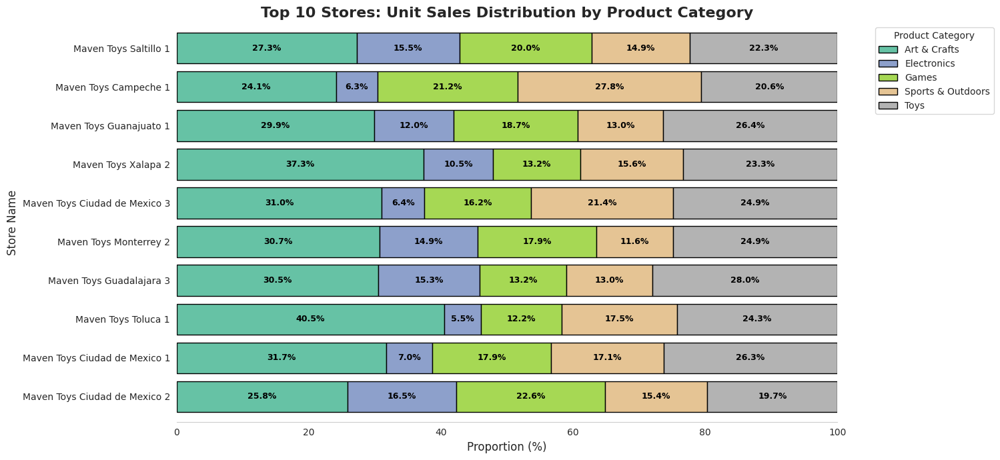

In [100]:
# 1. Top 10 Stores by Total Unit sold, showing composition by Product Category


plot_categorical_composition_stacked_bar(
    df=df.copy(),
    main_category_column='Store_Name',
    composition_column='Product_Category',
    aggregation_kpi='Units',
    agg_type='sum',
    n=10,
    top_or_bottom='top',
    sort_by_total_kpi=True,
    title='Top 10 Stores: Unit Sales Distribution by Product Category',
    colormap='Set2'
)

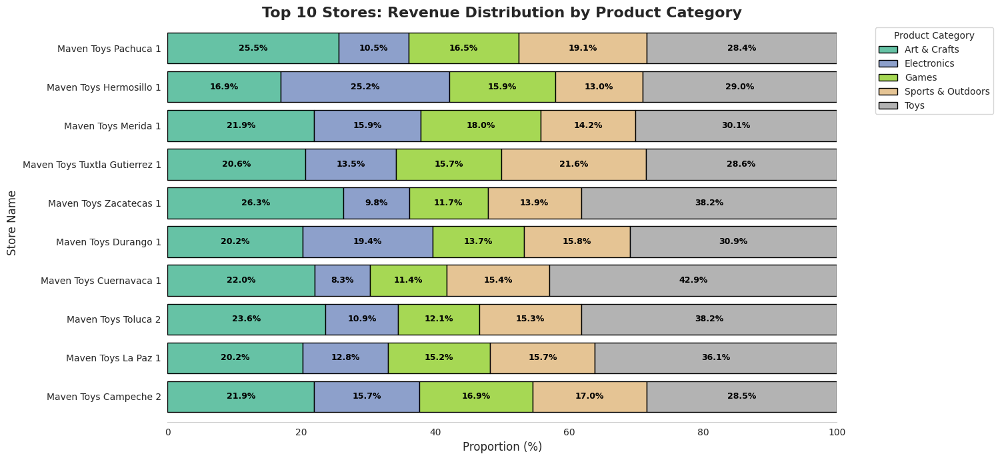

In [101]:
# 2. Top 10 Stores by Total Revenue, showing composition by Product Category


plot_categorical_composition_stacked_bar(
    df=df.copy(),
    main_category_column='Store_Name',
    composition_column='Product_Category',
    aggregation_kpi='Revenue',
    agg_type='sum',
    n=10,
    top_or_bottom='bottom',
    sort_by_total_kpi=True,
    title='Top 10 Stores: Revenue Distribution by Product Category',
    colormap='Set2'
)

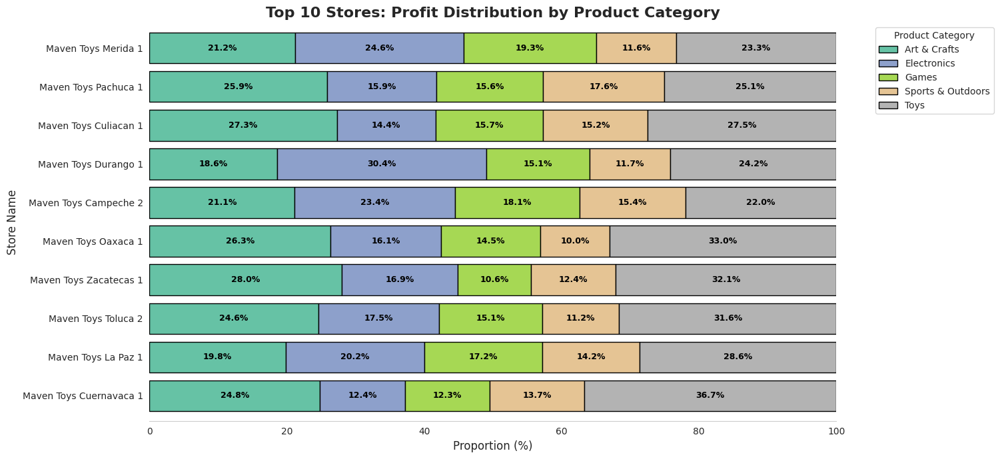

In [102]:
# 3. Top 10 Stores by Total Profit, showing composition by Product Category


plot_categorical_composition_stacked_bar(
    df=df.copy(),
    main_category_column='Store_Name',
    composition_column='Product_Category',
    aggregation_kpi='Profit',
    agg_type='sum',
    n=10,
    top_or_bottom='bottom',
    sort_by_total_kpi=True,
    title='Top 10 Stores: Profit Distribution by Product Category',
    colormap='Set2'
)

# Interpretation

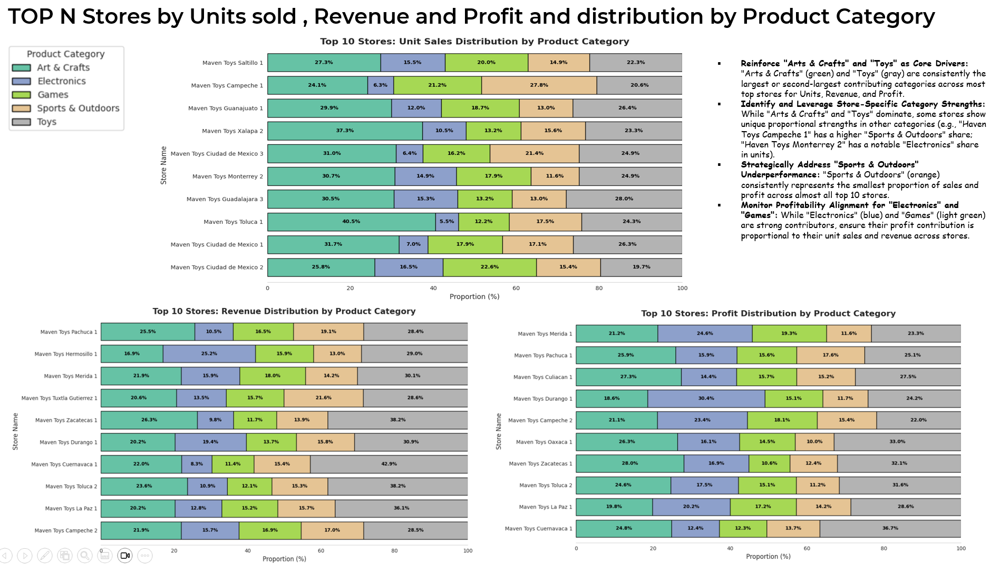

### C. Top 10 city aggregated by KPI's ( Units , Revenue and Product ) analysis by product category composition

* Top 10 City by Total Units Sold, showing composition by Product Category
* Top 10 City by Total Revenue , showing composition by Product Category
* Top 10 City by Total Profit , showing composition by Product Category

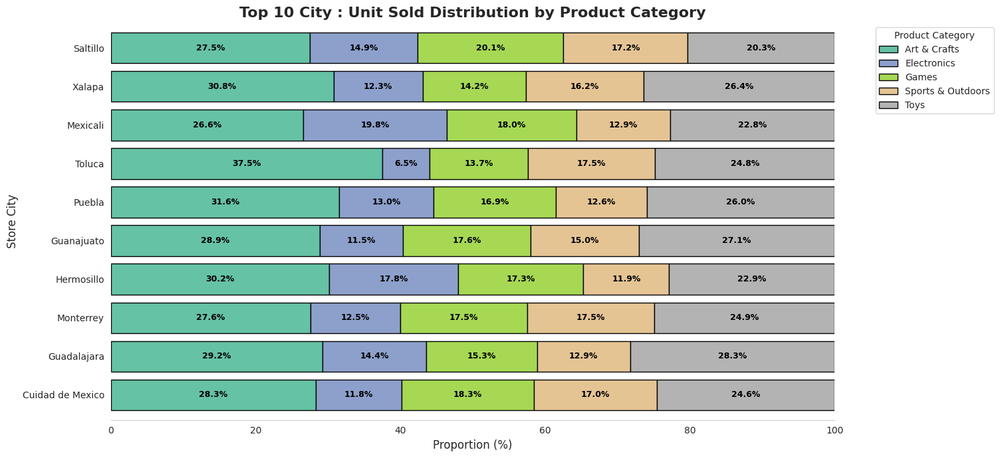

In [103]:
# 1. Top 10 City by Total Units Sold, showing composition by Product Category


plot_categorical_composition_stacked_bar(
    df=df.copy(),
    main_category_column='Store_City',
    composition_column='Product_Category',
    aggregation_kpi='Units',
    agg_type='sum',
    n=10,
    top_or_bottom='top',
    sort_by_total_kpi=True,
    title='Top 10 City : Unit Sold Distribution by Product Category',
    colormap='Set2'
)

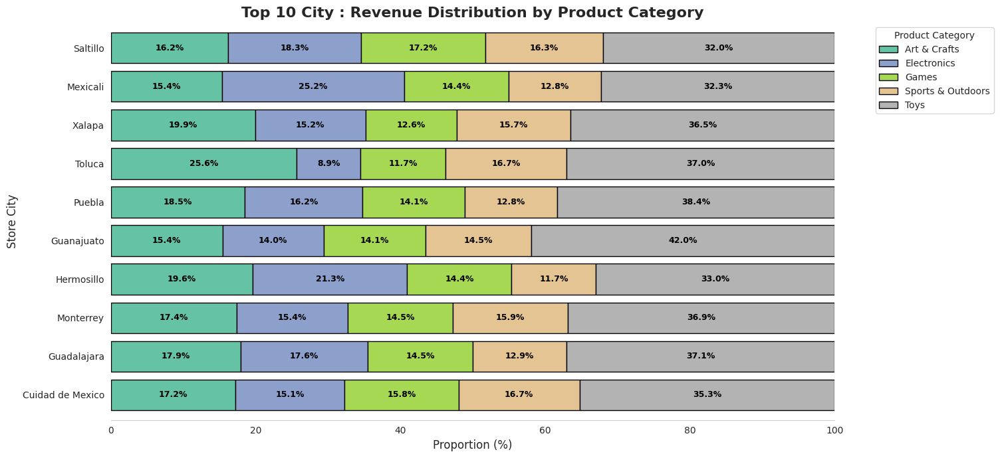

In [104]:
# 2. Top 10 City by Total Revenue , showing composition by Product Category


plot_categorical_composition_stacked_bar(
    df=df.copy(),
    main_category_column='Store_City',
    composition_column='Product_Category',
    aggregation_kpi='Revenue',
    agg_type='sum',
    n=10,
    top_or_bottom='top',
    sort_by_total_kpi=True,
    title='Top 10 City : Revenue Distribution by Product Category',
    colormap='Set2'
)

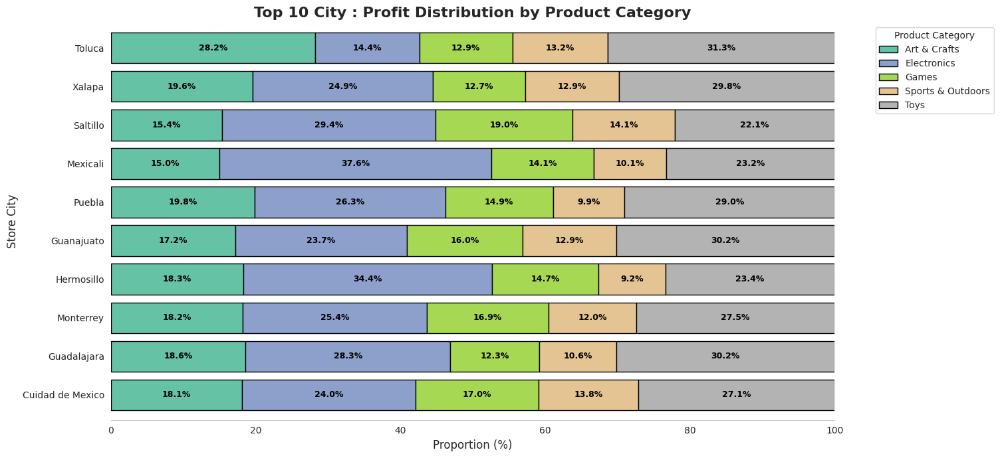

In [105]:
# 3. Top 10 City by Total Profit , showing composition by Product Category


plot_categorical_composition_stacked_bar(
    df=df.copy(),
    main_category_column='Store_City',
    composition_column='Product_Category',
    aggregation_kpi='Profit',
    agg_type='sum',
    n=10,
    top_or_bottom='top',
    sort_by_total_kpi=True,
    title='Top 10 City : Profit Distribution by Product Category',
    colormap='Set2'
)

# Interpretation

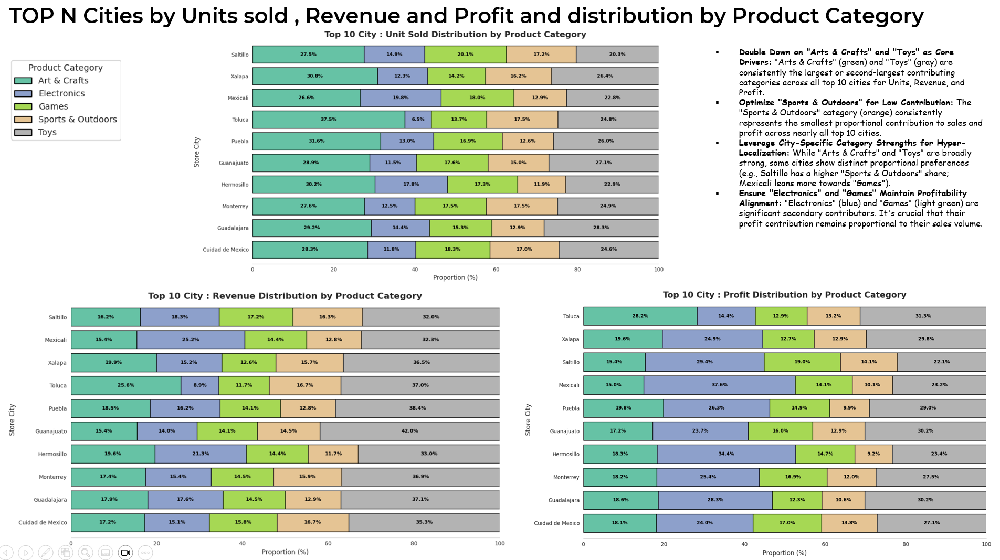

### D. Top 10 products aggregated by KPI's ( Units , Revenue and Product ) analysis by store location composition

* Top 10 Products by Total Units Sold, showing composition by Store Location
* Top 10 Products by Total Revenue , showing composition by Store Location
* Top 10 Products by Total Profit , showing composition by Store Location

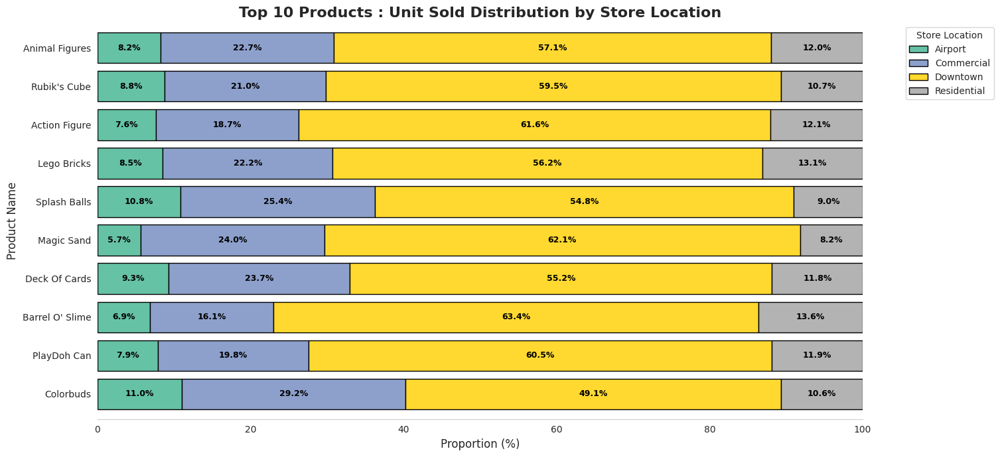

In [106]:
# 1. Top 10 Products by Total Units Sold, showing composition by Store Location


plot_categorical_composition_stacked_bar(
    df=df.copy(),
    main_category_column='Product_Name',
    composition_column='Store_Location',
    aggregation_kpi='Units',
    agg_type='sum',
    n=10,
    top_or_bottom='top',
    sort_by_total_kpi=True,
    title='Top 10 Products : Unit Sold Distribution by Store Location',
    colormap='Set2'
)

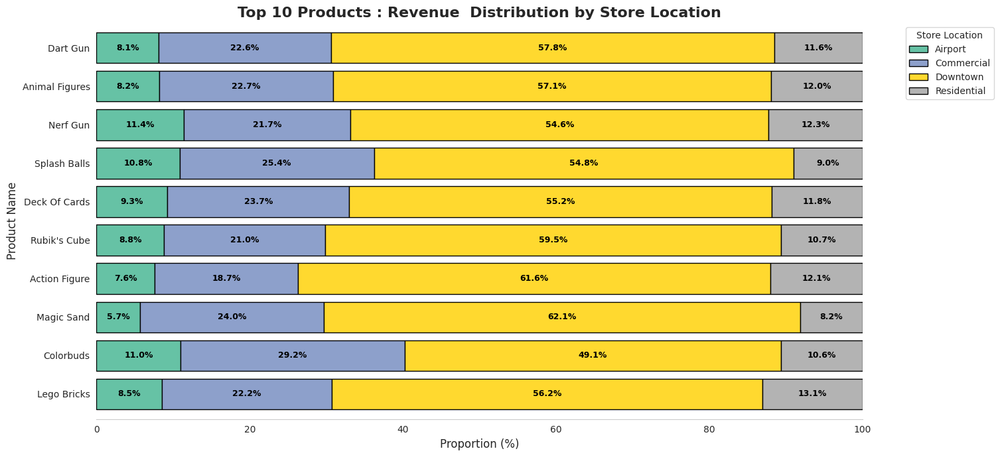

In [107]:
# 2. Top 10 Products by Total Revenue , showing composition by Store Location


plot_categorical_composition_stacked_bar(
    df=df.copy(),
    main_category_column='Product_Name',
    composition_column='Store_Location',
    aggregation_kpi='Revenue',
    agg_type='sum',
    n=10,
    top_or_bottom='top',
    sort_by_total_kpi=True,
    title='Top 10 Products : Revenue  Distribution by Store Location',
    colormap='Set2'
)

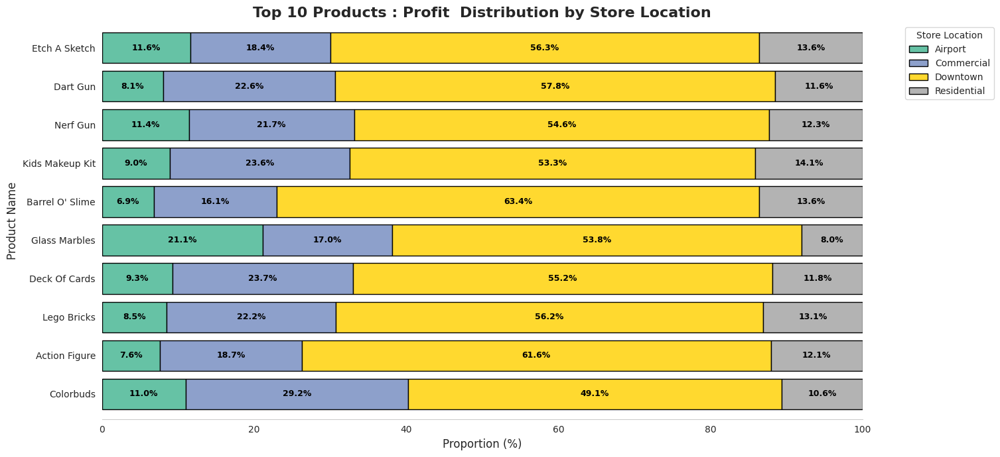

In [108]:
# 3. Top 10 Products by Total Profit , showing composition by Store Location


plot_categorical_composition_stacked_bar(
    df=df.copy(),
    main_category_column='Product_Name',
    composition_column='Store_Location',
    aggregation_kpi='Profit',
    agg_type='sum',
    n=10,
    top_or_bottom='top',
    sort_by_total_kpi=True,
    title='Top 10 Products : Profit  Distribution by Store Location',
    colormap='Set2'
)

# Interpretation

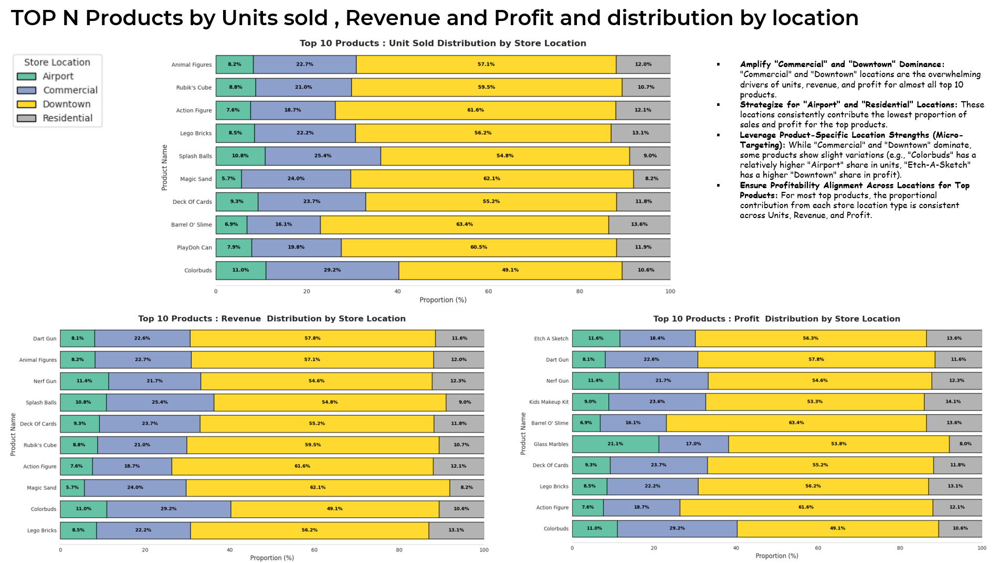

# Final Recommendation

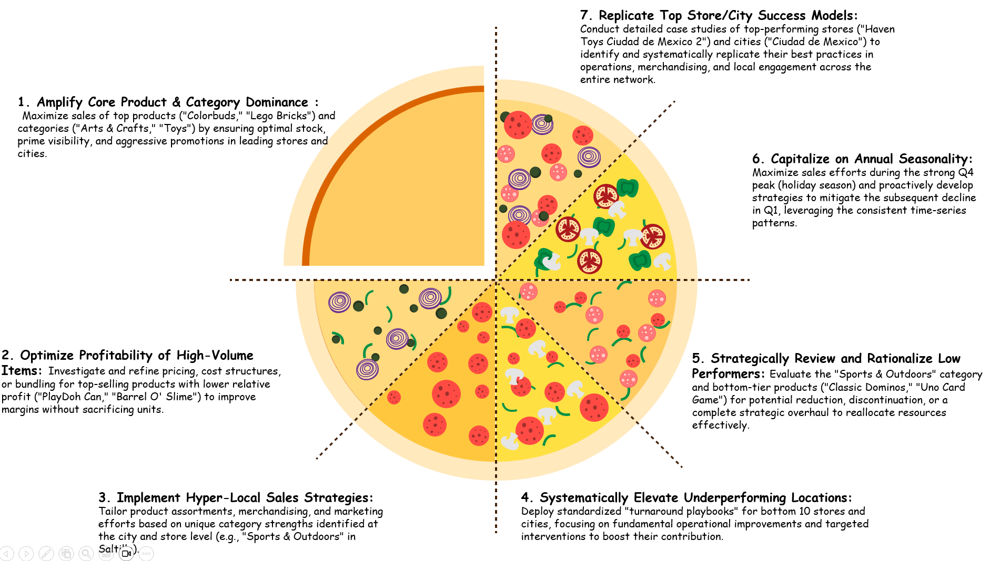

# COMPLETED